## Environment Setup

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# hack - https://github.com/googlecolab/colabtools/issues/3409#issuecomment-1446281277
import locale
locale.getpreferredencoding = lambda: "UTF-8"
! pip install -Uq ipdb
import ipdb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.2 MB/s eta 0:00:00


In [3]:
# This get the RAPIDS-Colab install files and test check your GPU.  Run this and the next cell only.
# Please read the output of this cell.  If your Colab Instance is not RAPIDS compatible, it will warn you and give you remediation steps.
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
%cd rapidsai-csp-utils
!git checkout 22.12-patch
%cd ..
!python rapidsai-csp-utils/colab/env-check.py
!python rapidsai-csp-utils/colab/pip-install.py

Cloning into 'rapidsai-csp-utils'...
remote: Enumerating objects: 390, done.
remote: Counting objects: 100% (121/121), done.
remote: Compressing objects: 100% (70/70), done.
remote: Total 390 (delta 89), reused 51 (delta 51), pack-reused 269
Receiving objects: 100% (390/390), 107.11 KiB | 7.65 MiB/s, done.
Resolving deltas: 100% (191/191), done.
/content/rapidsai-csp-utils
Branch '22.12-patch' set up to track remote branch '22.12-patch' from 'origin'.
Switched to a new branch '22.12-patch'
/content
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 1.8 MB/s eta 0:00:00
Traceback (most recent call last):
  File "/content/rapidsai-csp-utils/colab/env-check.py", line 26, in <module>
    gpu_name = pynvml.nvmlDeviceGetName(pynvml.nvmlDeviceGetHandleByIndex(0)).decode('UTF-8')
AttributeError: 'str' object has no attribute 'decode'. Did you mean: 'encode'?
Traceback (most recent call last):
  File "/content/rapidsai-csp-utils/colab/pip-install.py", line 26, in <module>
    gpu_name =

In [4]:
%%bash
# Install the Merlin Framework
pip install -Uq git+https://github.com/NVIDIA-Merlin/models.git@release-23.06
pip install -Uq git+https://github.com/NVIDIA-Merlin/nvtabular.git@release-23.06
pip install -Uq git+https://github.com/NVIDIA-Merlin/core.git@release-23.06
# pip install -Uq git+https://github.com/NVIDIA-Merlin/system.git@release-23.04
# pip install -Uq git+https://github.com/NVIDIA-Merlin/dataloader.git@release-23.04
pip install -Uq git+https://github.com/NVIDIA-Merlin/Transformers4Rec.git@release-23.06
# pip install -Uq xgboost lightfm implicit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.8/140.8 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.9/46.9 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.0/122.0 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.0/47.0 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 985.5/985.5 kB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 41.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 MB 36.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 27.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 763.4/763.4 kB 51.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Load Data
Reference
- https://github.com/NVIDIA-Merlin/models/blob/main/examples/02-Merlin-Models-and-NVTabular-integration.ipynb

In [1]:
import logging
import warnings

# Set the logging level to a higher value (e.g., CRITICAL)
logging.basicConfig(level=logging.ERROR)

warnings.filterwarnings("ignore")

In [2]:
import os
import shutil
import numpy as np
from nvtabular import ops
from merlin.schema.tags import Tags
import merlin.io
import merlin.models.tf as mm

import nvtabular as nvt

from os import path
import tensorflow as tf


# Get dataframe library - cudf or pandas
from merlin.core.dispatch import get_lib
pd = get_lib()

In [3]:
DATA_DIR = os.environ.get(
    "DATA_DIR", os.path.expanduser("/content/drive/MyDrive/ml-twotower-model/data/")
)
GIT_PROJECT = 'kchopra456/ml-model-template'
USE_REDUCED_TEXTUAL_EMBEDDINGS = True

In [4]:
import glob

USE_AUGMENTED_DATASET= True
DATA_VERSION = 'v4'

_TRAIN,_VALID,_TEST = ('train_aug', 'valid_aug', 'test_aug') if USE_AUGMENTED_DATASET else ('train', 'valid', 'test')

TRAIN_PATHS = sorted(glob.glob(os.path.join(DATA_DIR, _TRAIN + f'_{DATA_VERSION}', "*.parquet")))
VALID_PATHS = sorted(glob.glob(os.path.join(DATA_DIR, _VALID + f'_{DATA_VERSION}', "*.parquet")))
TEST_PATHS = sorted(glob.glob(os.path.join(DATA_DIR, _TEST + f'_{DATA_VERSION}', "*.parquet")))

TRAIN_PATHS, VALID_PATHS, TEST_PATHS

(['/content/drive/MyDrive/ml-twotower-model/data/train_aug_v4/part_0.parquet'],
 ['/content/drive/MyDrive/ml-twotower-model/data/valid_aug_v4/part_0.parquet'],
 ['/content/drive/MyDrive/ml-twotower-model/data/test_aug_v4/part_0.parquet'])

In [5]:
train = merlin.io.Dataset(
    TRAIN_PATHS, engine="parquet"
)
valid = merlin.io.Dataset(
    VALID_PATHS, engine="parquet"
)
test = merlin.io.Dataset(
    TEST_PATHS, engine="parquet"
)


In [6]:
schema = train.schema.select_by_tag([Tags.ITEM_ID, Tags.USER_ID, Tags.ITEM, Tags.USER])
schema

,name,tags,dtype,is_list,is_ragged,properties.start_index,properties.cat_path,properties.embedding_sizes.cardinality,properties.embedding_sizes.dimension,properties.freq_threshold,properties.num_buckets,properties.max_size,properties.domain.min,properties.domain.max,properties.domain.name,properties.value_count.min,properties.value_count.max
0,movie_id,"(Tags.ITEM, Tags.CATEGORICAL, Tags.ID)","DType(name='int64', element_type=<ElementType....",False,False,0.0,.//categories/unique.movie_id.parquet,1665.0,102.0,0.0,None,0.0,0,1664,movie_id,NaN,NaN
1,user_id,"(Tags.CATEGORICAL, Tags.ID, Tags.USER)","DType(name='int64', element_type=<ElementType....",False,False,0.0,.//categories/unique.user_id.parquet,944.0,74.0,0.0,None,0.0,0,943,user_id,NaN,NaN
2,gender,"(Tags.CATEGORICAL, Tags.USER)","DType(name='int64', element_type=<ElementType....",False,False,0.0,.//categories/unique.gender.parquet,3.0,16.0,0.0,None,0.0,0,2,gender,NaN,NaN
3,occupation,"(Tags.CATEGORICAL, Tags.USER)","DType(name='int64', element_type=<ElementType....",False,False,0.0,.//categories/unique.occupation.parquet,22.0,16.0,0.0,None,0.0,0,21,occupation,NaN,NaN
4,genres,"(Tags.ITEM, Tags.CATEGORICAL)","DType(name='int64', element_type=<ElementType....",True,True,0.0,.//categories/unique.genres.parquet,20.0,16.0,0.0,None,0.0,0,19,genres,0.0,NaN
5,synopsis,"(Tags.ITEM, Tags.CATEGORICAL)","DType(name='int64', element_type=<ElementType....",False,False,0.0,.//categories/unique.synopsis.parquet,1665.0,102.0,0.0,None,0.0,0,1664,synopsis,NaN,NaN
6,title,"(Tags.ITEM, Tags.CATEGORICAL)","DType(name='int64', element_type=<ElementType....",False,False,0.0,.//categories/unique.title.parquet,1665.0,102.0,0.0,None,0.0,0,1664,title,NaN,NaN
7,cast,"(Tags.ITEM, Tags.CATEGORICAL)","DType(name='int64', element_type=<ElementType....",True,True,0.0,.//categories/unique.cast.parquet,4760.0,183.0,0.0,None,0.0,0,4759,cast,0.0,NaN


In [7]:
# missing from load
schema['movie_id'].tags._tags.add(Tags.ITEM_ID)
schema['user_id'].tags._tags.add(Tags.USER_ID)

In [8]:
#sanity check
train.to_ddf().head()

,movie_id,movie_id_raw,user_id,gender,occupation,genres,rating,synopsis,title,cast
0,337,1012,7,2,1,"[2, 1]",1,336,336,"[1383, 1384, 1393, 1392, 1388, 1385]"
1,77,245,109,2,8,"[1, 8, 4, 3]",0,77,77,"[2, 30, 106, 558, 514]"
2,5,294,509,1,10,[2],0,5,5,"[46, 203, 204, 58, 202]"
3,614,948,94,2,1,"[2, 5]",0,619,617,"[2117, 2106, 973, 2114, 2091]"
4,1184,1251,104,2,8,[2],1,1196,1182,"[3545, 3532, 3503, 3520]"


In [11]:
schema = schema.excluding_by_name(col_names=['cast'])

In [12]:
# select only trainable features and exclude the target
train.schema = schema
valid.schema = schema

In [13]:
assert len(schema.select_by_tag(Tags.TARGET).column_names) == 0

## Augment with custom pre-trained embeddings

### Load embeddings

In [14]:
FULL_DATASET = True
embedding_path = f'embeddings_train_index_{DATA_VERSION}.parquet'
movie_id_col_to_use = 'movie_id'
if FULL_DATASET:
    embedding_path = f'embeddings_full_index_{DATA_VERSION}.parquet'
    movie_id_col_to_use = 'movie_id_raw'

# embeddings = pd.read_parquet(os.path.join(DATA_DIR, f'embeddings_train_index_{DATA_VERSION}.parquet'))
embeddings = pd.read_parquet(os.path.join(DATA_DIR, embedding_path))

embeddings.shape

(1664, 3)

In [15]:
# sanity check that movie index "0" is missing
embeddings.sort_values(movie_id_col_to_use)

,movie_id_raw,title_embeddings,synopsis_embeddings
41,1,"[-0.1271020621061325, -0.3848617672920227, -0....","[-0.23947608470916748, 0.04749224707484245, 0...."
305,2,"[-0.13687743246555328, -0.20053081214427948, -...","[-0.22074897587299347, 0.022454295307397842, 0..."
72,3,"[-0.01994566060602665, -0.20462116599082947, -...","[0.11733447015285492, 0.0836687907576561, 0.37..."
288,4,"[-0.0068391780368983746, -0.3333335518836975, ...","[-0.07648835331201553, 0.1145646795630455, 0.2..."
679,5,"[-0.3565199673175812, -0.2376198172569275, -0....","[-0.0027327132411301136, -0.1977999061346054, ..."
...,...,...,...
1340,1678,"[-0.0655791163444519, -0.003532692324370146, -...","[-0.19522230327129364, 0.31564751267433167, 0...."
1339,1679,"[0.009984835051000118, -0.04608602076768875, -...","[-0.07188992202281952, -0.14516761898994446, 0..."
930,1680,"[0.149348646402359, 0.009134890511631966, -0.0...","[-0.24428804218769073, -0.14837390184402466, 0..."
1619,1681,"[0.3425954580307007, -0.2802436947822571, 0.20...","[-0.2569529414176941, 0.2592751979827881, 0.16..."


In [16]:
# can be handled better with dask, but we will use pd
train_df = train.to_ddf().compute()
valid_df = valid.to_ddf().compute()
test_df = test.to_ddf().compute()

#### Synopsis Embeddings
- Synopsis embedding will use label encoded synopsis as lookup index

In [17]:
train_movie_id_synopsis_df = train_df[[movie_id_col_to_use, 'synopsis']].groupby([movie_id_col_to_use, 'synopsis'], as_index=False).count()
movie_id_synopsis_df = train_movie_id_synopsis_df
if FULL_DATASET:
    valid_movie_id_synopsis_df = valid_df[[movie_id_col_to_use, 'synopsis']].groupby([movie_id_col_to_use, 'synopsis'], as_index=False).count()
    test_movie_id_synopsis_df = test_df[[movie_id_col_to_use, 'synopsis']].groupby([movie_id_col_to_use, 'synopsis'], as_index=False).count()

    movie_id_synopsis_df = pd.concat((train_movie_id_synopsis_df, valid_movie_id_synopsis_df, test_movie_id_synopsis_df), axis=0, ignore_index=True).drop_duplicates()

movie_id_synopsis_df

,movie_id_raw,synopsis
0,1,8
1,2,240
2,3,375
3,4,108
4,5,390
...,...,...
4374,1669,1645
4375,1671,1580
4376,1674,1595
4377,1677,1607


In [18]:
idx_synopsis_embeddings_df = pd.merge(movie_id_synopsis_df[[movie_id_col_to_use, 'synopsis']],
                                      embeddings[[movie_id_col_to_use, 'synopsis_embeddings']], on=movie_id_col_to_use).drop(movie_id_col_to_use, axis=1).set_index('synopsis').sort_index()
# sanity check synopsis=0 has no embeddings
idx_synopsis_embeddings_df

,synopsis_embeddings
synopsis,
1,"[-0.4067784249782562, -0.014127916656434536, 0..."
2,"[-0.032858122140169144, 0.09768732637166977, 0..."
3,"[0.04936177283525467, -0.06918485462665558, 0...."
4,"[-0.16613557934761047, -0.041616834700107574, ..."
5,"[-0.06875813752412796, 0.1845909059047699, 0.2..."
...,...
1660,"[-0.12424704432487488, 0.10214965045452118, 0...."
1661,"[-0.17334190011024475, 0.059408169239759445, -..."
1662,"[-0.09875628352165222, -0.09560519456863403, 0..."


In [19]:
# add synopsis=0 embeddings
idx_synopsis_embeddings_df.loc[0, 'synopsis_embeddings'] = np.mean(idx_synopsis_embeddings_df['synopsis_embeddings'])
idx_synopsis_embeddings_df.sort_index(inplace=True)
idx_synopsis_embeddings_df

,synopsis_embeddings
synopsis,
0,"[-0.07655343072853454, 0.04274995435513828, 0...."
1,"[-0.4067784249782562, -0.014127916656434536, 0..."
2,"[-0.032858122140169144, 0.09768732637166977, 0..."
3,"[0.04936177283525467, -0.06918485462665558, 0...."
4,"[-0.16613557934761047, -0.041616834700107574, ..."
...,...
1660,"[-0.12424704432487488, 0.10214965045452118, 0...."
1661,"[-0.17334190011024475, 0.059408169239759445, -..."
1662,"[-0.09875628352165222, -0.09560519456863403, 0..."


In [20]:
synopsis_embeddings = np.stack(idx_synopsis_embeddings_df['synopsis_embeddings'])
#sanity check
assert (synopsis_embeddings[1] == idx_synopsis_embeddings_df.loc[1, 'synopsis_embeddings']).all()

#### Title Embeddings
- Title embedding will use label encoded title as lookup index

In [21]:
train_movie_id_title_df = train_df[[movie_id_col_to_use, 'title']].groupby([movie_id_col_to_use, 'title'], as_index=False).count()
movie_id_title_df = train_movie_id_title_df
if FULL_DATASET:
    valid_movie_id_title_df = valid_df[[movie_id_col_to_use, 'title']].groupby([movie_id_col_to_use, 'title'], as_index=False).count()
    test_movie_id_title_df = test_df[[movie_id_col_to_use, 'title']].groupby([movie_id_col_to_use, 'title'], as_index=False).count()

    movie_id_title_df = pd.concat((train_movie_id_title_df, valid_movie_id_title_df, test_movie_id_title_df), axis=0, ignore_index=True).drop_duplicates()

movie_id_title_df

,movie_id_raw,title
0,1,8
1,2,239
2,3,373
3,4,109
4,5,389
...,...,...
4374,1669,1591
4375,1671,1632
4376,1674,1589
4377,1677,1581


In [22]:
idx_title_embeddings_df = pd.merge(movie_id_title_df[[movie_id_col_to_use, 'title']],
                                      embeddings[[movie_id_col_to_use, 'title_embeddings']], on=movie_id_col_to_use).drop(movie_id_col_to_use, axis=1).set_index('title').sort_index()
# sanity check title=0 has no embeddings
idx_title_embeddings_df

,title_embeddings
title,
1,"[-0.09145651757717133, -0.0811767429113388, -0..."
2,"[-0.043679703027009964, -0.21339358389377594, ..."
3,"[-0.06971988081932068, -0.32740920782089233, -..."
4,"[-0.10080163925886154, -0.14979299902915955, -..."
5,"[0.20293867588043213, -0.21028143167495728, -0..."
...,...
1660,"[0.04619225487112999, -0.33449605107307434, -0..."
1661,"[-0.16195717453956604, -0.04123103991150856, 0..."
1662,"[0.07549984753131866, -0.18107983469963074, -0..."


In [23]:
# add title=0 embeddings
idx_title_embeddings_df.loc[0, 'title_embeddings'] = np.mean(idx_title_embeddings_df['title_embeddings'])
idx_title_embeddings_df.sort_index(inplace=True)
idx_title_embeddings_df

,title_embeddings
title,
0,"[-0.054924961270514286, -0.1981357344611227, -..."
1,"[-0.09145651757717133, -0.0811767429113388, -0..."
2,"[-0.043679703027009964, -0.21339358389377594, ..."
3,"[-0.06971988081932068, -0.32740920782089233, -..."
4,"[-0.10080163925886154, -0.14979299902915955, -..."
...,...
1660,"[0.04619225487112999, -0.33449605107307434, -0..."
1661,"[-0.16195717453956604, -0.04123103991150856, 0..."
1662,"[0.07549984753131866, -0.18107983469963074, -0..."


In [24]:
title_embeddings = np.stack(idx_title_embeddings_df['title_embeddings'])
#sanity check
assert (title_embeddings[1] == idx_title_embeddings_df.loc[1, 'title_embeddings']).all()

### Autoencoder

In [25]:
from keras.layers import Input, Dense
from keras.models import Model

def build_auto_encoder(textual_embedding_dim, encoded_dim=256):

    # Define the input layer
    input_layer = Input(shape=(textual_embedding_dim,))

    # Define the encoder layers
    encoded = Dense(encoded_dim, activation='relu')(input_layer)

    # Define the decoder layers
    decoded = Dense(textual_embedding_dim, activation='sigmoid')(encoded)

    # # Create the encoder model
    encoder_model = Model(input_layer, encoded)

    # Create the autoencoder model
    return Model(input_layer, decoded), encoder_model

In [26]:
encoded_dim = 256
synopsis_autoencoder, synopsis_encoder = build_auto_encoder(synopsis_embeddings.shape[1], encoded_dim)
synopsis_autoencoder.compile(optimizer='adam', loss='mean_squared_error')

synopsis_autoencoder.fit(synopsis_embeddings, synopsis_embeddings,
                        epochs=50,
                        batch_size=64, verbose=0)

In [27]:
encoded_dim = 64
title_autoencoder, title_encoder = build_auto_encoder(title_embeddings.shape[1], encoded_dim)
title_autoencoder.compile(optimizer='adam', loss='mean_squared_error')

title_autoencoder.fit(title_embeddings, title_embeddings,
                        epochs=50,
                        batch_size=64, verbose=0)

In [28]:
def reduce_embeddings(encoded, textual_embedding):
    input_layer = Input(shape=(textual_embedding.shape[1],))

    # Create a model that only includes the encoder part
    encoder_model = Model(input_layer, encoded)

    # Use the encoder to obtain the reduced-dimensional embeddings
    return encoder_model.predict(textual_embedding)

### Use Custom Embedding

In [29]:
if USE_REDUCED_TEXTUAL_EMBEDDINGS:
    synopsis_embeddings = synopsis_encoder.predict(synopsis_embeddings)
    title_embeddings = title_encoder.predict(title_embeddings)

53/53 [==============================] - 0s 1ms/step


In [30]:
# swap synopsis embedding
schema['synopsis'].properties['embedding_sizes'] = {
    'cardinality': float(synopsis_embeddings.shape[0]),
    'dimension': float(synopsis_embeddings.shape[1])
}

# swap title embdeddings
schema['title'].properties['embedding_sizes'] = {
    'cardinality': float(title_embeddings.shape[0]),
    'dimension': float(title_embeddings.shape[1])
}

schema

,name,tags,dtype,is_list,is_ragged,properties.start_index,properties.cat_path,properties.embedding_sizes.cardinality,properties.embedding_sizes.dimension,properties.freq_threshold,properties.num_buckets,properties.max_size,properties.domain.min,properties.domain.max,properties.domain.name,properties.value_count.min,properties.value_count.max
0,movie_id,"(Tags.ITEM, Tags.ITEM_ID, Tags.CATEGORICAL, Ta...","DType(name='int64', element_type=<ElementType....",False,False,0.0,.//categories/unique.movie_id.parquet,1665.0,102.0,0.0,None,0.0,0,1664,movie_id,NaN,NaN
1,user_id,"(Tags.USER_ID, Tags.CATEGORICAL, Tags.ID, Tags...","DType(name='int64', element_type=<ElementType....",False,False,0.0,.//categories/unique.user_id.parquet,944.0,74.0,0.0,None,0.0,0,943,user_id,NaN,NaN
2,gender,"(Tags.CATEGORICAL, Tags.USER)","DType(name='int64', element_type=<ElementType....",False,False,0.0,.//categories/unique.gender.parquet,3.0,16.0,0.0,None,0.0,0,2,gender,NaN,NaN
3,occupation,"(Tags.CATEGORICAL, Tags.USER)","DType(name='int64', element_type=<ElementType....",False,False,0.0,.//categories/unique.occupation.parquet,22.0,16.0,0.0,None,0.0,0,21,occupation,NaN,NaN
4,genres,"(Tags.ITEM, Tags.CATEGORICAL)","DType(name='int64', element_type=<ElementType....",True,True,0.0,.//categories/unique.genres.parquet,20.0,16.0,0.0,None,0.0,0,19,genres,0.0,NaN
5,synopsis,"(Tags.ITEM, Tags.CATEGORICAL)","DType(name='int64', element_type=<ElementType....",False,False,0.0,.//categories/unique.synopsis.parquet,1665.0,256.0,0.0,None,0.0,0,1664,synopsis,NaN,NaN
6,title,"(Tags.ITEM, Tags.CATEGORICAL)","DType(name='int64', element_type=<ElementType....",False,False,0.0,.//categories/unique.title.parquet,1665.0,64.0,0.0,None,0.0,0,1664,title,NaN,NaN


In [31]:
# set schema for train and validation set
train.schema = schema
valid.schema = schema

In [32]:
embed_dims = {}
embed_dims["synopsis"] = synopsis_embeddings.shape[1]
embed_dims["title"] = title_embeddings.shape[1]

embeddings_init={
    "synopsis": mm.TensorInitializer(synopsis_embeddings),
    "title": mm.TensorInitializer(title_embeddings),
}

item_embeddings_block = mm.Embeddings(
    train.schema.select_by_tag(Tags.ITEM),
    infer_embedding_sizes=True,
    embeddings_initializer=embeddings_init,
    trainable={
        'synopsis': False,
        'title': False
        },
    dim=embed_dims,
)

## Build Model
Reference
- https://github.com/NVIDIA-Merlin/models/blob/main/examples/05-Retrieval-Model.ipynb
- https://github.com/NVIDIA-Merlin/models/blob/main/examples/usecases/entertainment-with-pretrained-embeddings.ipynb

### Model definition

In [33]:
# collect model_helper.py
! rm model_helper.py || true
! wget --no-cache https://raw.githubusercontent.com/$GIT_PROJECT/master/model_helper.py #-O model_helper.py

--2023-09-04 14:24:10--  https://raw.githubusercontent.com/kchopra456/ml-model-template/master/model_helper.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10995 (11K) [text/plain]
Saving to: ‘model_helper.py’

model_helper.py     100%[===================>]  10.74K  --.-KB/s    in 0s      

2023-09-04 14:24:11 (63.6 MB/s) - ‘model_helper.py’ saved [10995/10995]



In [34]:
from model_helper import topk_metrics_aggregator
from model_helper import build_towers
from model_helper import default_plot_metrics
from model_helper import plot_metrics
from model_helper import merge_model_history
from model_helper import EvaluationCallback


In [35]:
# only define one time
if 'models' not in globals():
    models = dict()
    historys = dict()
    train_evaluation_clbks = dict()
    valid_evaluation_clbks = dict()
else:
    print('[INFO] skip redefining static variables')

### model_v1

In [ ]:
VERSION = 'v1'

_tower_dim = [128, 128] # @param

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 2 # @param
_validation_freq = 5 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 128
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [ ]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=5, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=5, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [ ]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 54s 635ms/step - loss: 7.4414 - auc: 0.5835 - recall_at_100: 0.0815 - mrr_at_100: 0.0065 - ndcg_at_100: 0.0190 - map_at_100: 0.0065 - precision_at_100: 8.1508e-04 - recall_at_50: 0.0440 - mrr_at_50: 0.0059 - ndcg_at_50: 0.0130 - map_at_50: 0.0059 - precision_at_50: 8.8032e-04 - recall_at_10: 0.0108 - mrr_at_10: 0.0046 - ndcg_at_10: 0.0060 - map_at_10: 0.0046 - precision_at_10: 0.0011 - regularization_loss: 0.0000e+00 - loss_batch: 7.3744
Epoch 2/50
35/35 [==============================] - 16s 410ms/step - loss: 7.2137 - auc: 0.6346 - recall_at_100: 0.1672 - mrr_at_100: 0.0127 - ndcg_at_100: 0.0389 - map_at_100: 0.0127 - precision_at_100: 0.0017 - recall_at_50: 0.0947 - mrr_at_50: 0.0117 - ndcg_at_50: 0.0272 - map_at_50: 0.0117 - precision_at_50: 0.0019 - recall_at_10: 0.0239 - mrr_at_10: 0.0089 - ndcg_at_10: 0.0124 - map_at_10: 0.0089 - precision_at_10: 0.0024 - regularization_loss: 0.0000e+00 - loss_batch: 7.1487
Epoch 3/50
35/35 [==

69/69 [==============================] - 6s 22ms/step - loss: 1.4373 - auc: 0.5826 - recall_at_100: 0.3107 - mrr_at_100: 0.0211 - ndcg_at_100: 0.0704 - map_at_100: 0.0211 - precision_at_100: 0.0031 - recall_at_10: 0.0431 - mrr_at_10: 0.0136 - ndcg_at_10: 0.0204 - map_at_10: 0.0136 - precision_at_10: 0.0043 - regularization_loss: 0.0000e+00 - loss_batch: 1.4431
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.4373056888580322, 'auc': 0.5825592279434204, 'recall_at_100': 0.3118857145309448, 'mrr_at_100': 0.021181529387831688, 'ndcg_at_100': 0.07074180990457535, 'map_at_100': 0.021181529387831688, 'precision_at_100': 0.0031188568100333214, 'recall_at_10': 0.04411555081605911, 'mrr_at_10': 0.01377338357269764, 'ndcg_at_10': 0.020724225789308548, 'map_at_10': 0.01377338357269764, 'precision_at_10': 0.004411555826663971, 'regularization_loss': 0.0, 'loss_batch': 1.7174031734466553, 'coverage': 0.9923126201153107, 'novelty': 0.022404371584699455}
Candidate set rows: 1387


15/15 [==============================] - 6s 24ms/step - loss: 0.8852 - auc: 0.5809 - recall_at_100: 0.1814 - mrr_at_100: 0.0084 - ndcg_at_100: 0.0370 - map_at_100: 0.0084 - precision_at_100: 0.0018 - recall_at_10: 0.0161 - mrr_at_10: 0.0044 - ndcg_at_10: 0.0071 - map_at_10: 0.0044 - precision_at_10: 0.0016 - regularization_loss: 0.0000e+00 - loss_batch: 0.9445
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.8851829171180725, 'auc': 0.5808975100517273, 'recall_at_100': 0.18757523596286774, 'mrr_at_100': 0.009079663082957268, 'ndcg_at_100': 0.03870806843042374, 'map_at_100': 0.009079663082957268, 'precision_at_100': 0.0018757523503154516, 'recall_at_10': 0.017186036333441734, 'mrr_at_10': 0.004767132923007011, 'ndcg_at_10': 0.007611144799739122, 'map_at_10': 0.004767132923007011, 'precision_at_10': 0.0017186037730425596, 'regularization_loss': 0.0, 'loss_batch': 1.5653494596481323, 'coverage': 0.9899062725306417, 'novelty': 0.1278297410871628}
35/35 [===============

69/69 [==============================] - 8s 21ms/step - loss: 1.5472 - auc: 0.5498 - recall_at_100: 0.3355 - mrr_at_100: 0.0248 - ndcg_at_100: 0.0783 - map_at_100: 0.0248 - precision_at_100: 0.0034 - recall_at_10: 0.0527 - mrr_at_10: 0.0167 - ndcg_at_10: 0.0250 - map_at_10: 0.0167 - precision_at_10: 0.0053 - regularization_loss: 0.0000e+00 - loss_batch: 1.5572
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.547204613685608, 'auc': 0.5498114228248596, 'recall_at_100': 0.3359163701534271, 'mrr_at_100': 0.025219988077878952, 'ndcg_at_100': 0.07867559045553207, 'map_at_100': 0.025219988077878952, 'precision_at_100': 0.0033591636456549168, 'recall_at_10': 0.05337454751133919, 'mrr_at_10': 0.017181498929858208, 'ndcg_at_10': 0.025496462360024452, 'map_at_10': 0.017181498929858208, 'precision_at_10': 0.005337454378604889, 'regularization_loss': 0.0, 'loss_batch': 2.0333852767944336, 'coverage': 1.0, 'novelty': 0.02786149027950127}
Candidate set rows: 1387


15/15 [==============================] - 4s 35ms/step - loss: 0.9320 - auc: 0.5636 - recall_at_100: 0.1871 - mrr_at_100: 0.0080 - ndcg_at_100: 0.0375 - map_at_100: 0.0080 - precision_at_100: 0.0019 - recall_at_10: 0.0133 - mrr_at_10: 0.0036 - ndcg_at_10: 0.0057 - map_at_10: 0.0036 - precision_at_10: 0.0013 - regularization_loss: 0.0000e+00 - loss_batch: 0.9843
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9320075511932373, 'auc': 0.563607931137085, 'recall_at_100': 0.19452989101409912, 'mrr_at_100': 0.008416064083576202, 'ndcg_at_100': 0.03915327414870262, 'map_at_100': 0.008416064083576202, 'precision_at_100': 0.0019452986307442188, 'recall_at_10': 0.014711782336235046, 'mrr_at_10': 0.0038522633258253336, 'ndcg_at_10': 0.006305774673819542, 'map_at_10': 0.0038522633258253336, 'precision_at_10': 0.0014711783733218908, 'regularization_loss': 0.0, 'loss_batch': 1.5315231084823608, 'coverage': 0.996395097332372, 'novelty': 0.1408093176048977}
35/35 [===============

69/69 [==============================] - 7s 22ms/step - loss: 1.6249 - auc: 0.5594 - recall_at_100: 0.3488 - mrr_at_100: 0.0276 - ndcg_at_100: 0.0831 - map_at_100: 0.0276 - precision_at_100: 0.0035 - recall_at_10: 0.0593 - mrr_at_10: 0.0193 - ndcg_at_10: 0.0285 - map_at_10: 0.0193 - precision_at_10: 0.0059 - regularization_loss: 0.0000e+00 - loss_batch: 1.6369
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.6248970031738281, 'auc': 0.5594464540481567, 'recall_at_100': 0.35058829188346863, 'mrr_at_100': 0.02719365991652012, 'ndcg_at_100': 0.0829872414469719, 'map_at_100': 0.02719365991652012, 'precision_at_100': 0.0035058825742453337, 'recall_at_10': 0.05807526782155037, 'mrr_at_10': 0.01879803277552128, 'ndcg_at_10': 0.0278090201318264, 'map_at_10': 0.01879803277552128, 'precision_at_10': 0.005807527340948582, 'regularization_loss': 0.0, 'loss_batch': 2.2055273056030273, 'coverage': 1.0, 'novelty': 0.03842705786471068}
Candidate set rows: 1387


15/15 [==============================] - 5s 34ms/step - loss: 0.9415 - auc: 0.5547 - recall_at_100: 0.1935 - mrr_at_100: 0.0070 - ndcg_at_100: 0.0374 - map_at_100: 0.0070 - precision_at_100: 0.0019 - recall_at_10: 0.0116 - mrr_at_10: 0.0027 - ndcg_at_10: 0.0047 - map_at_10: 0.0027 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 0.9899
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9415289163589478, 'auc': 0.5546737909317017, 'recall_at_100': 0.1919218897819519, 'mrr_at_100': 0.007136411964893341, 'ndcg_at_100': 0.03737296909093857, 'map_at_100': 0.007136411964893341, 'precision_at_100': 0.0019192188046872616, 'recall_at_10': 0.011301323771476746, 'mrr_at_10': 0.002738689538091421, 'ndcg_at_10': 0.004682824946939945, 'map_at_10': 0.002738689538091421, 'precision_at_10': 0.001130132470279932, 'regularization_loss': 0.0, 'loss_batch': 1.4956482648849487, 'coverage': 0.9956741167988464, 'novelty': 0.17223744292237442}
35/35 [================

69/69 [==============================] - 9s 32ms/step - loss: 1.7444 - auc: 0.5443 - recall_at_100: 0.3761 - mrr_at_100: 0.0302 - ndcg_at_100: 0.0901 - map_at_100: 0.0302 - precision_at_100: 0.0038 - recall_at_10: 0.0645 - mrr_at_10: 0.0212 - ndcg_at_10: 0.0311 - map_at_10: 0.0212 - precision_at_10: 0.0065 - regularization_loss: 0.0000e+00 - loss_batch: 1.7570
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.7444201707839966, 'auc': 0.5443416237831116, 'recall_at_100': 0.3764422535896301, 'mrr_at_100': 0.03034687601029873, 'ndcg_at_100': 0.09029558300971985, 'map_at_100': 0.03034687601029873, 'precision_at_100': 0.003764422843232751, 'recall_at_10': 0.06498390436172485, 'mrr_at_10': 0.021278217434883118, 'ndcg_at_10': 0.03131796047091484, 'map_at_10': 0.021278217434883118, 'precision_at_10': 0.006498390343040228, 'regularization_loss': 0.0, 'loss_batch': 2.355970621109009, 'coverage': 1.0, 'novelty': 0.03483818531106842}
Candidate set rows: 1387


15/15 [==============================] - 4s 25ms/step - loss: 0.9992 - auc: 0.5517 - recall_at_100: 0.1947 - mrr_at_100: 0.0069 - ndcg_at_100: 0.0376 - map_at_100: 0.0069 - precision_at_100: 0.0019 - recall_at_10: 0.0111 - mrr_at_10: 0.0025 - ndcg_at_10: 0.0044 - map_at_10: 0.0025 - precision_at_10: 0.0011 - regularization_loss: 0.0000e+00 - loss_batch: 1.0472
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9992060661315918, 'auc': 0.5516611337661743, 'recall_at_100': 0.2022201418876648, 'mrr_at_100': 0.0074190241284668446, 'ndcg_at_100': 0.03934764117002487, 'map_at_100': 0.0074190241284668446, 'precision_at_100': 0.00202220119535923, 'recall_at_10': 0.01250501535832882, 'mrr_at_10': 0.0027843054849654436, 'ndcg_at_10': 0.004970784764736891, 'map_at_10': 0.0027843054849654436, 'precision_at_10': 0.001250501605682075, 'regularization_loss': 0.0, 'loss_batch': 1.549149751663208, 'coverage': 0.9913482335976929, 'novelty': 0.15785068630733176}
35/35 [================

69/69 [==============================] - 9s 34ms/step - loss: 1.8049 - auc: 0.5459 - recall_at_100: 0.3832 - mrr_at_100: 0.0301 - ndcg_at_100: 0.0910 - map_at_100: 0.0301 - precision_at_100: 0.0038 - recall_at_10: 0.0627 - mrr_at_10: 0.0209 - ndcg_at_10: 0.0305 - map_at_10: 0.0209 - precision_at_10: 0.0063 - regularization_loss: 0.0000e+00 - loss_batch: 1.8179
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.8048787117004395, 'auc': 0.5458691120147705, 'recall_at_100': 0.385715514421463, 'mrr_at_100': 0.03057818114757538, 'ndcg_at_100': 0.09185956418514252, 'map_at_100': 0.03057818114757538, 'precision_at_100': 0.003857154631987214, 'recall_at_10': 0.06451383233070374, 'mrr_at_10': 0.021343756467103958, 'ndcg_at_10': 0.0312679223716259, 'map_at_10': 0.021343756467103958, 'precision_at_10': 0.006451384164392948, 'regularization_loss': 0.0, 'loss_batch': 2.436746597290039, 'coverage': 0.9993593850096092, 'novelty': 0.04235917707303926}
Candidate set rows: 1387


15/15 [==============================] - 5s 38ms/step - loss: 0.9435 - auc: 0.5525 - recall_at_100: 0.1824 - mrr_at_100: 0.0066 - ndcg_at_100: 0.0352 - map_at_100: 0.0066 - precision_at_100: 0.0018 - recall_at_10: 0.0088 - mrr_at_10: 0.0024 - ndcg_at_10: 0.0039 - map_at_10: 0.0024 - precision_at_10: 8.8427e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0060
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9434622526168823, 'auc': 0.5524798035621643, 'recall_at_100': 0.18897953629493713, 'mrr_at_100': 0.006876552943140268, 'ndcg_at_100': 0.03665189817547798, 'map_at_100': 0.006876552943140268, 'precision_at_100': 0.001889795414172113, 'recall_at_10': 0.010097633115947247, 'mrr_at_10': 0.002481604926288128, 'ndcg_at_10': 0.0041974987834692, 'map_at_10': 0.002481604926288128, 'precision_at_10': 0.001009763334877789, 'regularization_loss': 0.0, 'loss_batch': 1.6597987413406372, 'coverage': 0.9906272530641672, 'novelty': 0.1790053151100987}
35/35 [===============

69/69 [==============================] - 6s 22ms/step - loss: 1.8843 - auc: 0.5400 - recall_at_100: 0.4057 - mrr_at_100: 0.0323 - ndcg_at_100: 0.0971 - map_at_100: 0.0323 - precision_at_100: 0.0041 - recall_at_10: 0.0705 - mrr_at_10: 0.0224 - ndcg_at_10: 0.0335 - map_at_10: 0.0224 - precision_at_10: 0.0071 - regularization_loss: 0.0000e+00 - loss_batch: 1.8966
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.8842672109603882, 'auc': 0.5399965047836304, 'recall_at_100': 0.40481752157211304, 'mrr_at_100': 0.03281494230031967, 'ndcg_at_100': 0.09740670025348663, 'map_at_100': 0.03281494230031967, 'precision_at_100': 0.00404817471280694, 'recall_at_10': 0.07123728841543198, 'mrr_at_10': 0.022996431216597557, 'ndcg_at_10': 0.03407294675707817, 'map_at_10': 0.022996431216597557, 'precision_at_10': 0.007123728282749653, 'regularization_loss': 0.0, 'loss_batch': 2.483222484588623, 'coverage': 1.0, 'novelty': 0.03716256157635468}
Candidate set rows: 1387


15/15 [==============================] - 5s 24ms/step - loss: 0.9260 - auc: 0.5393 - recall_at_100: 0.1777 - mrr_at_100: 0.0056 - ndcg_at_100: 0.0335 - map_at_100: 0.0056 - precision_at_100: 0.0018 - recall_at_10: 0.0086 - mrr_at_10: 0.0016 - ndcg_at_10: 0.0032 - map_at_10: 0.0016 - precision_at_10: 8.6185e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9859
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9260175228118896, 'auc': 0.5393030047416687, 'recall_at_100': 0.18423163890838623, 'mrr_at_100': 0.0061539821326732635, 'ndcg_at_100': 0.035196468234062195, 'map_at_100': 0.0061539821326732635, 'precision_at_100': 0.0018423163564875722, 'recall_at_10': 0.010097633115947247, 'mrr_at_10': 0.0020070543978363276, 'ndcg_at_10': 0.0038220961578190327, 'map_at_10': 0.0020070543978363276, 'precision_at_10': 0.001009763334877789, 'regularization_loss': 0.0, 'loss_batch': 1.6116424798965454, 'coverage': 0.9899062725306417, 'novelty': 0.17395314517616675}
35/35 [=====

69/69 [==============================] - 8s 35ms/step - loss: 1.9350 - auc: 0.5577 - recall_at_100: 0.4132 - mrr_at_100: 0.0336 - ndcg_at_100: 0.0994 - map_at_100: 0.0336 - precision_at_100: 0.0041 - recall_at_10: 0.0732 - mrr_at_10: 0.0238 - ndcg_at_10: 0.0351 - map_at_10: 0.0238 - precision_at_10: 0.0073 - regularization_loss: 0.0000e+00 - loss_batch: 1.9459
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9349513053894043, 'auc': 0.557735800743103, 'recall_at_100': 0.41373464465141296, 'mrr_at_100': 0.03412562608718872, 'ndcg_at_100': 0.09995448589324951, 'map_at_100': 0.03412562608718872, 'precision_at_100': 0.004137346521019936, 'recall_at_10': 0.07390102744102478, 'mrr_at_10': 0.024274274706840515, 'ndcg_at_10': 0.03567337244749069, 'map_at_10': 0.024274274706840515, 'precision_at_10': 0.007390104234218597, 'regularization_loss': 0.0, 'loss_batch': 2.4679617881774902, 'coverage': 1.0, 'novelty': 0.03733322776040223}
Candidate set rows: 1387


15/15 [==============================] - 5s 39ms/step - loss: 0.9896 - auc: 0.5708 - recall_at_100: 0.1948 - mrr_at_100: 0.0063 - ndcg_at_100: 0.0370 - map_at_100: 0.0063 - precision_at_100: 0.0019 - recall_at_10: 0.0087 - mrr_at_10: 0.0018 - ndcg_at_10: 0.0034 - map_at_10: 0.0018 - precision_at_10: 8.6645e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0266
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9896315336227417, 'auc': 0.5708432197570801, 'recall_at_100': 0.19653604924678802, 'mrr_at_100': 0.006598365493118763, 'ndcg_at_100': 0.03762073814868927, 'map_at_100': 0.006598365493118763, 'precision_at_100': 0.001965360250324011, 'recall_at_10': 0.009696402586996555, 'mrr_at_10': 0.0020243297331035137, 'ndcg_at_10': 0.0037557485047727823, 'map_at_10': 0.0020243297331035137, 'precision_at_10': 0.0009696402121335268, 'regularization_loss': 0.0, 'loss_batch': 1.4129009246826172, 'coverage': 0.9913482335976929, 'novelty': 0.16529360210341806}
35/35 [========

69/69 [==============================] - 9s 34ms/step - loss: 1.9239 - auc: 0.5452 - recall_at_100: 0.4095 - mrr_at_100: 0.0348 - ndcg_at_100: 0.0999 - map_at_100: 0.0348 - precision_at_100: 0.0041 - recall_at_10: 0.0744 - mrr_at_10: 0.0249 - ndcg_at_10: 0.0363 - map_at_10: 0.0249 - precision_at_10: 0.0074 - regularization_loss: 0.0000e+00 - loss_batch: 1.9348
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9239373207092285, 'auc': 0.5452067852020264, 'recall_at_100': 0.41191133856773376, 'mrr_at_100': 0.03448130190372467, 'ndcg_at_100': 0.10008623450994492, 'map_at_100': 0.03448130190372467, 'precision_at_100': 0.004119113553315401, 'recall_at_10': 0.07455628365278244, 'mrr_at_10': 0.024565931409597397, 'ndcg_at_10': 0.03604915365576744, 'map_at_10': 0.024565931409597397, 'precision_at_10': 0.007455628365278244, 'regularization_loss': 0.0, 'loss_batch': 2.4506995677948, 'coverage': 1.0, 'novelty': 0.03909618573797678}
Candidate set rows: 1387


15/15 [==============================] - 4s 25ms/step - loss: 1.0047 - auc: 0.5599 - recall_at_100: 0.1965 - mrr_at_100: 0.0067 - ndcg_at_100: 0.0375 - map_at_100: 0.0067 - precision_at_100: 0.0020 - recall_at_10: 0.0092 - mrr_at_10: 0.0022 - ndcg_at_10: 0.0038 - map_at_10: 0.0022 - precision_at_10: 9.2282e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0403
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 1.0046675205230713, 'auc': 0.5599105954170227, 'recall_at_100': 0.19901029765605927, 'mrr_at_100': 0.006922187749296427, 'ndcg_at_100': 0.038316648453474045, 'map_at_100': 0.006922187749296427, 'precision_at_100': 0.0019901026971638203, 'recall_at_10': 0.010030761361122131, 'mrr_at_10': 0.0022669523023068905, 'ndcg_at_10': 0.004009213764220476, 'map_at_10': 0.0022669523023068905, 'precision_at_10': 0.0010030760895460844, 'regularization_loss': 0.0, 'loss_batch': 1.4131584167480469, 'coverage': 0.9899062725306417, 'novelty': 0.16422849181469873}
35/35 [=======

69/69 [==============================] - 7s 22ms/step - loss: 1.9067 - auc: 0.5550 - recall_at_100: 0.4046 - mrr_at_100: 0.0345 - ndcg_at_100: 0.0991 - map_at_100: 0.0345 - precision_at_100: 0.0040 - recall_at_10: 0.0752 - mrr_at_10: 0.0247 - ndcg_at_10: 0.0363 - map_at_10: 0.0247 - precision_at_10: 0.0075 - regularization_loss: 0.0000e+00 - loss_batch: 1.9189
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9066640138626099, 'auc': 0.5550392270088196, 'recall_at_100': 0.4083644449710846, 'mrr_at_100': 0.0352078378200531, 'ndcg_at_100': 0.10031048953533173, 'map_at_100': 0.0352078378200531, 'precision_at_100': 0.004083643667399883, 'recall_at_10': 0.07674995064735413, 'mrr_at_10': 0.025328613817691803, 'ndcg_at_10': 0.037142228335142136, 'map_at_10': 0.025328613817691803, 'precision_at_10': 0.007674995809793472, 'regularization_loss': 0.0, 'loss_batch': 2.500295877456665, 'coverage': 1.0, 'novelty': 0.04124928918245046}
Candidate set rows: 1387


15/15 [==============================] - 5s 38ms/step - loss: 0.9898 - auc: 0.5700 - recall_at_100: 0.1901 - mrr_at_100: 0.0067 - ndcg_at_100: 0.0365 - map_at_100: 0.0067 - precision_at_100: 0.0019 - recall_at_10: 0.0081 - mrr_at_10: 0.0023 - ndcg_at_10: 0.0036 - map_at_10: 0.0023 - precision_at_10: 8.0830e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0285
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9898234605789185, 'auc': 0.5700070858001709, 'recall_at_100': 0.19446301460266113, 'mrr_at_100': 0.006892380304634571, 'ndcg_at_100': 0.03748595714569092, 'map_at_100': 0.006892380304634571, 'precision_at_100': 0.0019446301739662886, 'recall_at_10': 0.009094556793570518, 'mrr_at_10': 0.0023760960903018713, 'ndcg_at_10': 0.003914157394319773, 'map_at_10': 0.0023760960903018713, 'precision_at_10': 0.0009094557026401162, 'regularization_loss': 0.0, 'loss_batch': 1.432621717453003, 'coverage': 0.9899062725306417, 'novelty': 0.16833273830774723}
35/35 [=========

69/69 [==============================] - 9s 30ms/step - loss: 1.9679 - auc: 0.5357 - recall_at_100: 0.4196 - mrr_at_100: 0.0355 - ndcg_at_100: 0.1022 - map_at_100: 0.0355 - precision_at_100: 0.0042 - recall_at_10: 0.0764 - mrr_at_10: 0.0254 - ndcg_at_10: 0.0371 - map_at_10: 0.0254 - precision_at_10: 0.0076 - regularization_loss: 0.0000e+00 - loss_batch: 1.9794
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9679170846939087, 'auc': 0.5357280373573303, 'recall_at_100': 0.41850659251213074, 'mrr_at_100': 0.03524687886238098, 'ndcg_at_100': 0.10190024226903915, 'map_at_100': 0.03524687886238098, 'precision_at_100': 0.0041850656270980835, 'recall_at_10': 0.07622289657592773, 'mrr_at_10': 0.025177685543894768, 'ndcg_at_10': 0.036906979978084564, 'map_at_10': 0.025177685543894768, 'precision_at_10': 0.007622288540005684, 'regularization_loss': 0.0, 'loss_batch': 2.523439645767212, 'coverage': 1.0, 'novelty': 0.043627110802683326}
Candidate set rows: 1387


15/15 [==============================] - 5s 39ms/step - loss: 1.0088 - auc: 0.5375 - recall_at_100: 0.1907 - mrr_at_100: 0.0061 - ndcg_at_100: 0.0361 - map_at_100: 0.0061 - precision_at_100: 0.0019 - recall_at_10: 0.0085 - mrr_at_10: 0.0018 - ndcg_at_10: 0.0034 - map_at_10: 0.0018 - precision_at_10: 8.4837e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0565
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 1.0087686777114868, 'auc': 0.537525475025177, 'recall_at_100': 0.1960010677576065, 'mrr_at_100': 0.006325789261609316, 'ndcg_at_100': 0.03715362027287483, 'map_at_100': 0.006325789261609316, 'precision_at_100': 0.0019600107334554195, 'recall_at_10': 0.008960813283920288, 'mrr_at_10': 0.0018689590506255627, 'ndcg_at_10': 0.0034656808711588383, 'map_at_10': 0.0018689590506255627, 'precision_at_10': 0.0008960813283920288, 'regularization_loss': 0.0, 'loss_batch': 1.556199550628662, 'coverage': 0.9870223503965393, 'novelty': 0.17482387838338898}
35/35 [==========

#### analysis

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v1


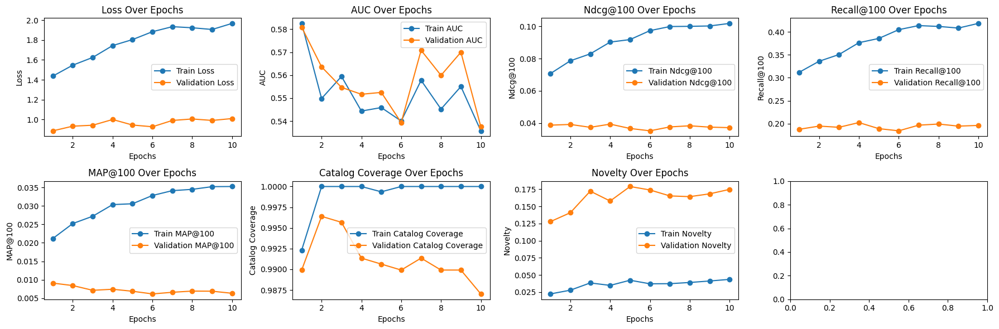

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


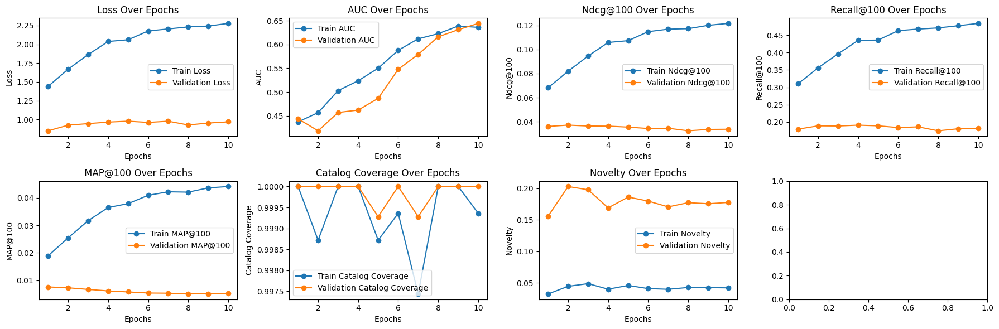

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


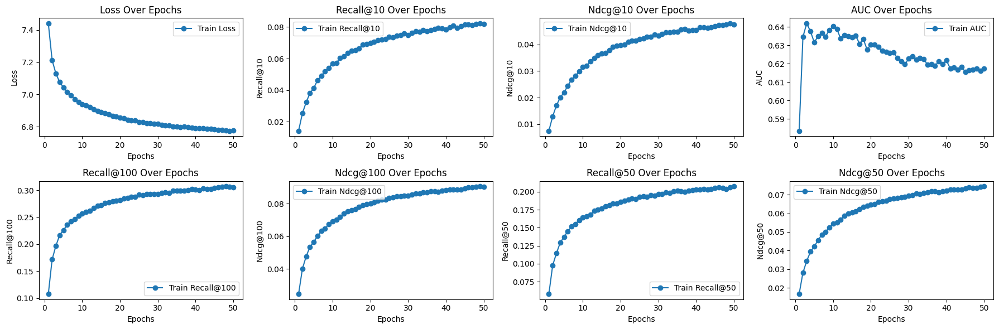

In [ ]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, None, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v2

In [ ]:
VERSION = 'v2'

_tower_dim = [512, 256] # @param

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 2 # @param
_validation_freq = 5 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 128
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [ ]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=5, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=5, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [ ]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 32s 453ms/step - loss: 7.9621 - auc: 0.5043 - recall_at_100: 0.0548 - mrr_at_100: 0.0035 - ndcg_at_100: 0.0120 - map_at_100: 0.0035 - precision_at_100: 5.4776e-04 - recall_at_50: 0.0284 - mrr_at_50: 0.0031 - ndcg_at_50: 0.0078 - map_at_50: 0.0031 - precision_at_50: 5.6726e-04 - recall_at_10: 0.0064 - mrr_at_10: 0.0022 - ndcg_at_10: 0.0032 - map_at_10: 0.0022 - precision_at_10: 6.4250e-04 - regularization_loss: 0.0000e+00 - loss_batch: 7.8787
Epoch 2/50
35/35 [==============================] - 10s 232ms/step - loss: 7.3422 - auc: 0.6148 - recall_at_100: 0.1179 - mrr_at_100: 0.0078 - ndcg_at_100: 0.0264 - map_at_100: 0.0078 - precision_at_100: 0.0012 - recall_at_50: 0.0625 - mrr_at_50: 0.0071 - ndcg_at_50: 0.0175 - map_at_50: 0.0071 - precision_at_50: 0.0013 - recall_at_10: 0.0157 - mrr_at_10: 0.0052 - ndcg_at_10: 0.0076 - map_at_10: 0.0052 - precision_at_10: 0.0016 - regularization_loss: 0.0000e+00 - loss_batch: 7.2768
Epoch 3/50
35/35

69/69 [==============================] - 10s 36ms/step - loss: 1.4144 - auc: 0.5486 - recall_at_100: 0.3041 - mrr_at_100: 0.0185 - ndcg_at_100: 0.0670 - map_at_100: 0.0185 - precision_at_100: 0.0030 - recall_at_10: 0.0379 - mrr_at_10: 0.0111 - ndcg_at_10: 0.0172 - map_at_10: 0.0111 - precision_at_10: 0.0038 - regularization_loss: 0.0000e+00 - loss_batch: 1.4209
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.4143785238265991, 'auc': 0.5486200451850891, 'recall_at_100': 0.3056323230266571, 'mrr_at_100': 0.018615709617733955, 'ndcg_at_100': 0.0673319399356842, 'map_at_100': 0.018615709617733955, 'precision_at_100': 0.0030563233885914087, 'recall_at_10': 0.0384034626185894, 'mrr_at_10': 0.011255713179707527, 'ndcg_at_10': 0.017458263784646988, 'map_at_10': 0.011255713179707527, 'precision_at_10': 0.0038403465878218412, 'regularization_loss': 0.0, 'loss_batch': 1.7322700023651123, 'coverage': 0.9974375400384369, 'novelty': 0.02829877261951205}
Candidate set rows: 1387


15/15 [==============================] - 4s 23ms/step - loss: 0.9203 - auc: 0.5573 - recall_at_100: 0.1866 - mrr_at_100: 0.0078 - ndcg_at_100: 0.0373 - map_at_100: 0.0078 - precision_at_100: 0.0019 - recall_at_10: 0.0159 - mrr_at_10: 0.0037 - ndcg_at_10: 0.0064 - map_at_10: 0.0037 - precision_at_10: 0.0016 - regularization_loss: 0.0000e+00 - loss_batch: 0.9754
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9202835559844971, 'auc': 0.5573176145553589, 'recall_at_100': 0.19479738175868988, 'mrr_at_100': 0.008660365827381611, 'ndcg_at_100': 0.03947906568646431, 'map_at_100': 0.008660365827381611, 'precision_at_100': 0.0019479738548398018, 'recall_at_10': 0.016784807667136192, 'mrr_at_10': 0.004188957158476114, 'ndcg_at_10': 0.007032447494566441, 'map_at_10': 0.004188957158476114, 'precision_at_10': 0.001678480883128941, 'regularization_loss': 0.0, 'loss_batch': 1.551224946975708, 'coverage': 0.9826964671953857, 'novelty': 0.14773617421275265}
35/35 [================

69/69 [==============================] - 6s 22ms/step - loss: 1.6111 - auc: 0.5005 - recall_at_100: 0.3427 - mrr_at_100: 0.0231 - ndcg_at_100: 0.0777 - map_at_100: 0.0231 - precision_at_100: 0.0034 - recall_at_10: 0.0499 - mrr_at_10: 0.0151 - ndcg_at_10: 0.0230 - map_at_10: 0.0151 - precision_at_10: 0.0050 - regularization_loss: 0.0000e+00 - loss_batch: 1.6215
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.6110666990280151, 'auc': 0.5005435347557068, 'recall_at_100': 0.3433520495891571, 'mrr_at_100': 0.023533759638667107, 'ndcg_at_100': 0.07815767824649811, 'map_at_100': 0.023533759638667107, 'precision_at_100': 0.0034335206728428602, 'recall_at_10': 0.049699440598487854, 'mrr_at_10': 0.015382323414087296, 'ndcg_at_10': 0.023239772766828537, 'map_at_10': 0.015382323414087296, 'precision_at_10': 0.004969943314790726, 'regularization_loss': 0.0, 'loss_batch': 2.118807792663574, 'coverage': 1.0, 'novelty': 0.04268513489045809}
Candidate set rows: 1387


15/15 [==============================] - 4s 24ms/step - loss: 0.9140 - auc: 0.4830 - recall_at_100: 0.1835 - mrr_at_100: 0.0071 - ndcg_at_100: 0.0360 - map_at_100: 0.0071 - precision_at_100: 0.0018 - recall_at_10: 0.0122 - mrr_at_10: 0.0029 - ndcg_at_10: 0.0050 - map_at_10: 0.0029 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 0.9708
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9139569401741028, 'auc': 0.4829624891281128, 'recall_at_100': 0.18811020255088806, 'mrr_at_100': 0.007910734973847866, 'ndcg_at_100': 0.037591367959976196, 'map_at_100': 0.007910734973847866, 'precision_at_100': 0.0018811019835993648, 'recall_at_10': 0.013775578700006008, 'mrr_at_10': 0.00355969974771142, 'ndcg_at_10': 0.005877070594578981, 'map_at_10': 0.00355969974771142, 'precision_at_10': 0.0013775578700006008, 'regularization_loss': 0.0, 'loss_batch': 1.5657973289489746, 'coverage': 0.989185291997116, 'novelty': 0.19391322229076702}
35/35 [================

69/69 [==============================] - 6s 23ms/step - loss: 1.7421 - auc: 0.5126 - recall_at_100: 0.3656 - mrr_at_100: 0.0280 - ndcg_at_100: 0.0859 - map_at_100: 0.0280 - precision_at_100: 0.0037 - recall_at_10: 0.0567 - mrr_at_10: 0.0192 - ndcg_at_10: 0.0278 - map_at_10: 0.0192 - precision_at_10: 0.0057 - regularization_loss: 0.0000e+00 - loss_batch: 1.7542
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.7420846223831177, 'auc': 0.512566328048706, 'recall_at_100': 0.36899232864379883, 'mrr_at_100': 0.027798723429441452, 'ndcg_at_100': 0.08640511333942413, 'map_at_100': 0.027798723429441452, 'precision_at_100': 0.0036899240221828222, 'recall_at_10': 0.05761944130063057, 'mrr_at_10': 0.01896095834672451, 'ndcg_at_10': 0.0278290044516325, 'map_at_10': 0.01896095834672451, 'precision_at_10': 0.005761943757534027, 'regularization_loss': 0.0, 'loss_batch': 2.327500581741333, 'coverage': 1.0, 'novelty': 0.03876192042091417}
Candidate set rows: 1387


15/15 [==============================] - 4s 25ms/step - loss: 0.9645 - auc: 0.4856 - recall_at_100: 0.1879 - mrr_at_100: 0.0065 - ndcg_at_100: 0.0360 - map_at_100: 0.0065 - precision_at_100: 0.0019 - recall_at_10: 0.0100 - mrr_at_10: 0.0022 - ndcg_at_10: 0.0040 - map_at_10: 0.0022 - precision_at_10: 0.0010 - regularization_loss: 0.0000e+00 - loss_batch: 1.0236
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9645382165908813, 'auc': 0.4855593144893646, 'recall_at_100': 0.19225625693798065, 'mrr_at_100': 0.0069499448873102665, 'ndcg_at_100': 0.037230368703603745, 'map_at_100': 0.0069499448873102665, 'precision_at_100': 0.001922562369145453, 'recall_at_10': 0.011435067281126976, 'mrr_at_10': 0.002617789898067713, 'ndcg_at_10': 0.004610342439264059, 'map_at_10': 0.002617789898067713, 'precision_at_10': 0.0011435069609433413, 'regularization_loss': 0.0, 'loss_batch': 1.641373634338379, 'coverage': 0.9949531362653208, 'novelty': 0.17283724340175954}
35/35 [=============

69/69 [==============================] - 6s 25ms/step - loss: 1.8868 - auc: 0.5658 - recall_at_100: 0.4041 - mrr_at_100: 0.0320 - ndcg_at_100: 0.0964 - map_at_100: 0.0320 - precision_at_100: 0.0040 - recall_at_10: 0.0682 - mrr_at_10: 0.0221 - ndcg_at_10: 0.0327 - map_at_10: 0.0221 - precision_at_10: 0.0068 - regularization_loss: 0.0000e+00 - loss_batch: 1.8989
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.8868452310562134, 'auc': 0.5657991170883179, 'recall_at_100': 0.4035924971103668, 'mrr_at_100': 0.03225003927946091, 'ndcg_at_100': 0.0966164618730545, 'map_at_100': 0.03225003927946091, 'precision_at_100': 0.004035924095660448, 'recall_at_10': 0.06887268275022507, 'mrr_at_10': 0.022432515397667885, 'ndcg_at_10': 0.03309432417154312, 'map_at_10': 0.022432515397667885, 'precision_at_10': 0.006887268275022507, 'regularization_loss': 0.0, 'loss_batch': 2.472519636154175, 'coverage': 1.0, 'novelty': 0.03306451612903226}
Candidate set rows: 1387


15/15 [==============================] - 4s 25ms/step - loss: 0.9949 - auc: 0.5350 - recall_at_100: 0.2012 - mrr_at_100: 0.0073 - ndcg_at_100: 0.0391 - map_at_100: 0.0073 - precision_at_100: 0.0020 - recall_at_10: 0.0117 - mrr_at_10: 0.0026 - ndcg_at_10: 0.0047 - map_at_10: 0.0026 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 1.0438
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9949491024017334, 'auc': 0.5350228548049927, 'recall_at_100': 0.19981275498867035, 'mrr_at_100': 0.007380868308246136, 'ndcg_at_100': 0.03890456259250641, 'map_at_100': 0.007380868308246136, 'precision_at_100': 0.0019981274381279945, 'recall_at_10': 0.011501939035952091, 'mrr_at_10': 0.0027408127207309008, 'ndcg_at_10': 0.004714098293334246, 'map_at_10': 0.0027408127207309008, 'precision_at_10': 0.0011501939734444022, 'regularization_loss': 0.0, 'loss_batch': 1.554539680480957, 'coverage': 0.9920692141312184, 'novelty': 0.16425709806653893}
35/35 [=============

69/69 [==============================] - 9s 27ms/step - loss: 1.9702 - auc: 0.5351 - recall_at_100: 0.4229 - mrr_at_100: 0.0326 - ndcg_at_100: 0.1002 - map_at_100: 0.0326 - precision_at_100: 0.0042 - recall_at_10: 0.0695 - mrr_at_10: 0.0222 - ndcg_at_10: 0.0330 - map_at_10: 0.0222 - precision_at_10: 0.0070 - regularization_loss: 0.0000e+00 - loss_batch: 1.9832
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9701577425003052, 'auc': 0.5351371765136719, 'recall_at_100': 0.42072874307632446, 'mrr_at_100': 0.03343869373202324, 'ndcg_at_100': 0.10052073746919632, 'map_at_100': 0.03343869373202324, 'precision_at_100': 0.004207286983728409, 'recall_at_10': 0.07143671065568924, 'mrr_at_10': 0.023202434182167053, 'ndcg_at_10': 0.03427375480532646, 'map_at_10': 0.023202434182167053, 'precision_at_10': 0.007143671158701181, 'regularization_loss': 0.0, 'loss_batch': 2.603492021560669, 'coverage': 1.0, 'novelty': 0.038010399451811845}
Candidate set rows: 1387


15/15 [==============================] - 4s 37ms/step - loss: 0.9833 - auc: 0.5003 - recall_at_100: 0.1928 - mrr_at_100: 0.0070 - ndcg_at_100: 0.0373 - map_at_100: 0.0070 - precision_at_100: 0.0019 - recall_at_10: 0.0124 - mrr_at_10: 0.0028 - ndcg_at_10: 0.0050 - map_at_10: 0.0028 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 1.0176
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9833006858825684, 'auc': 0.5003486275672913, 'recall_at_100': 0.19653604924678802, 'mrr_at_100': 0.0074980310164391994, 'ndcg_at_100': 0.03846026957035065, 'map_at_100': 0.0074980310164391994, 'precision_at_100': 0.0019653604831546545, 'recall_at_10': 0.013775578700006008, 'mrr_at_10': 0.00318129057995975, 'ndcg_at_10': 0.005594618618488312, 'map_at_10': 0.00318129057995975, 'precision_at_10': 0.0013775578700006008, 'regularization_loss': 0.0, 'loss_batch': 1.3765709400177002, 'coverage': 0.9920692141312184, 'novelty': 0.15721907302434146}
35/35 [==============

69/69 [==============================] - 9s 22ms/step - loss: 1.9693 - auc: 0.5130 - recall_at_100: 0.4191 - mrr_at_100: 0.0337 - ndcg_at_100: 0.1006 - map_at_100: 0.0337 - precision_at_100: 0.0042 - recall_at_10: 0.0728 - mrr_at_10: 0.0236 - ndcg_at_10: 0.0348 - map_at_10: 0.0236 - precision_at_10: 0.0073 - regularization_loss: 0.0000e+00 - loss_batch: 1.9829
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9693115949630737, 'auc': 0.513039231300354, 'recall_at_100': 0.41867753863334656, 'mrr_at_100': 0.03449686989188194, 'ndcg_at_100': 0.10129642486572266, 'map_at_100': 0.03449686989188194, 'precision_at_100': 0.00418677506968379, 'recall_at_10': 0.07485541701316833, 'mrr_at_10': 0.024358194321393967, 'ndcg_at_10': 0.035950787365436554, 'map_at_10': 0.024358194321393967, 'precision_at_10': 0.007485543377697468, 'regularization_loss': 0.0, 'loss_batch': 2.630314350128174, 'coverage': 1.0, 'novelty': 0.03777288203484879}
Candidate set rows: 1387


15/15 [==============================] - 5s 37ms/step - loss: 1.0154 - auc: 0.4725 - recall_at_100: 0.1951 - mrr_at_100: 0.0061 - ndcg_at_100: 0.0367 - map_at_100: 0.0061 - precision_at_100: 0.0020 - recall_at_10: 0.0095 - mrr_at_10: 0.0018 - ndcg_at_10: 0.0035 - map_at_10: 0.0018 - precision_at_10: 9.4724e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0497
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 1.015442132949829, 'auc': 0.47247904539108276, 'recall_at_100': 0.19921091198921204, 'mrr_at_100': 0.006563376169651747, 'ndcg_at_100': 0.0378664955496788, 'map_at_100': 0.006563376169651747, 'precision_at_100': 0.0019921089988201857, 'recall_at_10': 0.01083322148770094, 'mrr_at_10': 0.00217667524702847, 'ndcg_at_10': 0.00411922438070178, 'map_at_10': 0.00217667524702847, 'precision_at_10': 0.001083322218619287, 'regularization_loss': 0.0, 'loss_batch': 1.408301830291748, 'coverage': 0.992790194664744, 'novelty': 0.1679729248307802}
35/35 [===================

69/69 [==============================] - 6s 22ms/step - loss: 2.0346 - auc: 0.5173 - recall_at_100: 0.4312 - mrr_at_100: 0.0353 - ndcg_at_100: 0.1042 - map_at_100: 0.0353 - precision_at_100: 0.0043 - recall_at_10: 0.0770 - mrr_at_10: 0.0248 - ndcg_at_10: 0.0368 - map_at_10: 0.0248 - precision_at_10: 0.0077 - regularization_loss: 0.0000e+00 - loss_batch: 2.0485
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.034564256668091, 'auc': 0.5173047184944153, 'recall_at_100': 0.4312555193901062, 'mrr_at_100': 0.03539734706282616, 'ndcg_at_100': 0.10425689816474915, 'map_at_100': 0.03539734706282616, 'precision_at_100': 0.004312554839998484, 'recall_at_10': 0.07655052840709686, 'mrr_at_10': 0.024867797270417213, 'ndcg_at_10': 0.036732159554958344, 'map_at_10': 0.024867797270417213, 'precision_at_10': 0.007655052002519369, 'regularization_loss': 0.0, 'loss_batch': 2.7119810581207275, 'coverage': 1.0, 'novelty': 0.03984282575629542}
Candidate set rows: 1387


15/15 [==============================] - 4s 26ms/step - loss: 0.9538 - auc: 0.4891 - recall_at_100: 0.1800 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0340 - map_at_100: 0.0058 - precision_at_100: 0.0018 - recall_at_10: 0.0086 - mrr_at_10: 0.0019 - ndcg_at_10: 0.0034 - map_at_10: 0.0019 - precision_at_10: 8.5881e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0076
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9537778496742249, 'auc': 0.4891389310359955, 'recall_at_100': 0.18543533980846405, 'mrr_at_100': 0.006290259771049023, 'ndcg_at_100': 0.035409703850746155, 'map_at_100': 0.006290259771049023, 'precision_at_100': 0.0018543533515185118, 'recall_at_10': 0.00936204381287098, 'mrr_at_10': 0.002115110866725445, 'ndcg_at_10': 0.003752518678084016, 'map_at_10': 0.002115110866725445, 'precision_at_10': 0.000936204451136291, 'regularization_loss': 0.0, 'loss_batch': 1.5699361562728882, 'coverage': 0.9942321557317952, 'novelty': 0.18006492266564827}
35/35 [===========

69/69 [==============================] - 7s 22ms/step - loss: 2.0771 - auc: 0.5334 - recall_at_100: 0.4351 - mrr_at_100: 0.0357 - ndcg_at_100: 0.1053 - map_at_100: 0.0357 - precision_at_100: 0.0044 - recall_at_10: 0.0779 - mrr_at_10: 0.0250 - ndcg_at_10: 0.0371 - map_at_10: 0.0250 - precision_at_10: 0.0078 - regularization_loss: 0.0000e+00 - loss_batch: 2.0901
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.07707142829895, 'auc': 0.5333614945411682, 'recall_at_100': 0.4376228451728821, 'mrr_at_100': 0.036221738904714584, 'ndcg_at_100': 0.10611896961927414, 'map_at_100': 0.036221738904714584, 'precision_at_100': 0.004376227967441082, 'recall_at_10': 0.07882966101169586, 'mrr_at_10': 0.025543762370944023, 'ndcg_at_10': 0.03777679428458214, 'map_at_10': 0.025543762370944023, 'precision_at_10': 0.007882964797317982, 'regularization_loss': 0.0, 'loss_batch': 2.709092140197754, 'coverage': 1.0, 'novelty': 0.04205878417554971}
Candidate set rows: 1387


15/15 [==============================] - 6s 38ms/step - loss: 0.9711 - auc: 0.4974 - recall_at_100: 0.1870 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0351 - map_at_100: 0.0058 - precision_at_100: 0.0019 - recall_at_10: 0.0078 - mrr_at_10: 0.0016 - ndcg_at_10: 0.0030 - map_at_10: 0.0016 - precision_at_10: 7.8144e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0207
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9711158275604248, 'auc': 0.4973844885826111, 'recall_at_100': 0.1879095882177353, 'mrr_at_100': 0.006057693623006344, 'ndcg_at_100': 0.035591814666986465, 'map_at_100': 0.006057693623006344, 'precision_at_100': 0.0018790957983583212, 'recall_at_10': 0.009094556793570518, 'mrr_at_10': 0.0018370621837675571, 'ndcg_at_10': 0.0034647854045033455, 'map_at_10': 0.0018370621837675571, 'precision_at_10': 0.0009094557026401162, 'regularization_loss': 0.0, 'loss_batch': 1.5393052101135254, 'coverage': 0.9920692141312184, 'novelty': 0.17622874229116053}
35/35 [=======

69/69 [==============================] - 6s 24ms/step - loss: 2.1198 - auc: 0.5215 - recall_at_100: 0.4482 - mrr_at_100: 0.0371 - ndcg_at_100: 0.1087 - map_at_100: 0.0371 - precision_at_100: 0.0045 - recall_at_10: 0.0806 - mrr_at_10: 0.0261 - ndcg_at_10: 0.0386 - map_at_10: 0.0261 - precision_at_10: 0.0081 - regularization_loss: 0.0000e+00 - loss_batch: 2.1330
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.119751453399658, 'auc': 0.5214800834655762, 'recall_at_100': 0.4498162567615509, 'mrr_at_100': 0.03781392425298691, 'ndcg_at_100': 0.10959799587726593, 'map_at_100': 0.03781392425298691, 'precision_at_100': 0.0044981627725064754, 'recall_at_10': 0.08169282972812653, 'mrr_at_10': 0.026845555752515793, 'ndcg_at_10': 0.039450909942388535, 'map_at_10': 0.026845555752515793, 'precision_at_10': 0.008169281296432018, 'regularization_loss': 0.0, 'loss_batch': 2.761209487915039, 'coverage': 0.9993593850096092, 'novelty': 0.040699179974104445}
Candidate set rows: 1387


15/15 [==============================] - 4s 25ms/step - loss: 0.9652 - auc: 0.4861 - recall_at_100: 0.1811 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0340 - map_at_100: 0.0058 - precision_at_100: 0.0018 - recall_at_10: 0.0073 - mrr_at_10: 0.0018 - ndcg_at_10: 0.0030 - map_at_10: 0.0018 - precision_at_10: 7.3371e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0108
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9652268886566162, 'auc': 0.4860715866088867, 'recall_at_100': 0.18683964014053345, 'mrr_at_100': 0.006152979098260403, 'ndcg_at_100': 0.03537529706954956, 'map_at_100': 0.006152979098260403, 'precision_at_100': 0.001868396415375173, 'recall_at_10': 0.008626454509794712, 'mrr_at_10': 0.002026213798671961, 'ndcg_at_10': 0.003519188379868865, 'map_at_10': 0.002026213798671961, 'precision_at_10': 0.0008626455091871321, 'regularization_loss': 0.0, 'loss_batch': 1.4868720769882202, 'coverage': 0.992790194664744, 'novelty': 0.1761628993087988}
35/35 [=============

69/69 [==============================] - 9s 28ms/step - loss: 2.1331 - auc: 0.5211 - recall_at_100: 0.4477 - mrr_at_100: 0.0369 - ndcg_at_100: 0.1084 - map_at_100: 0.0369 - precision_at_100: 0.0045 - recall_at_10: 0.0801 - mrr_at_10: 0.0260 - ndcg_at_10: 0.0385 - map_at_10: 0.0260 - precision_at_10: 0.0080 - regularization_loss: 0.0000e+00 - loss_batch: 2.1464
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.133091926574707, 'auc': 0.5210572481155396, 'recall_at_100': 0.4493746757507324, 'mrr_at_100': 0.037487152963876724, 'ndcg_at_100': 0.10917871445417404, 'map_at_100': 0.037487152963876724, 'precision_at_100': 0.0044937459751963615, 'recall_at_10': 0.0809093788266182, 'mrr_at_10': 0.02656646817922592, 'ndcg_at_10': 0.03905859589576721, 'map_at_10': 0.02656646817922592, 'precision_at_10': 0.008090936578810215, 'regularization_loss': 0.0, 'loss_batch': 2.7808117866516113, 'coverage': 1.0, 'novelty': 0.040340520191649555}
Candidate set rows: 1387


15/15 [==============================] - 5s 37ms/step - loss: 0.9223 - auc: 0.4938 - recall_at_100: 0.1717 - mrr_at_100: 0.0056 - ndcg_at_100: 0.0323 - map_at_100: 0.0056 - precision_at_100: 0.0017 - recall_at_10: 0.0077 - mrr_at_10: 0.0020 - ndcg_at_10: 0.0033 - map_at_10: 0.0020 - precision_at_10: 7.7137e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9671
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9222579598426819, 'auc': 0.49375268816947937, 'recall_at_100': 0.176207035779953, 'mrr_at_100': 0.005938159301877022, 'ndcg_at_100': 0.033475421369075775, 'map_at_100': 0.005938159301877022, 'precision_at_100': 0.0017620703438296914, 'recall_at_10': 0.008960813283920288, 'mrr_at_10': 0.0021277419291436672, 'ndcg_at_10': 0.0036613454576581717, 'map_at_10': 0.0021277419291436672, 'precision_at_10': 0.0008960814448073506, 'regularization_loss': 0.0, 'loss_batch': 1.4355013370513916, 'coverage': 0.992790194664744, 'novelty': 0.17775683317624882}
35/35 [========

#### analysis

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v2


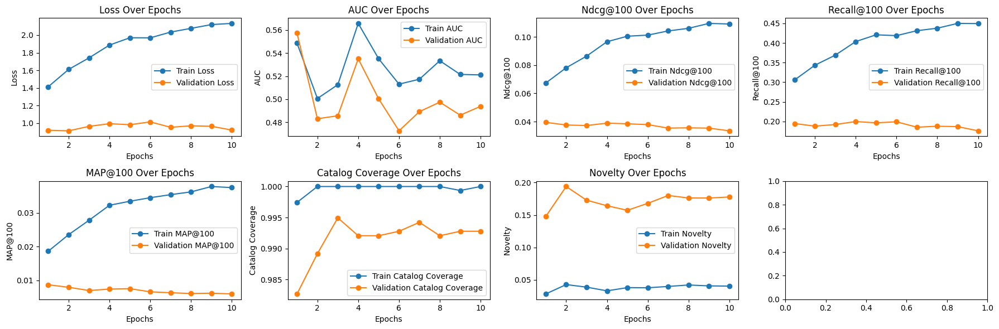

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


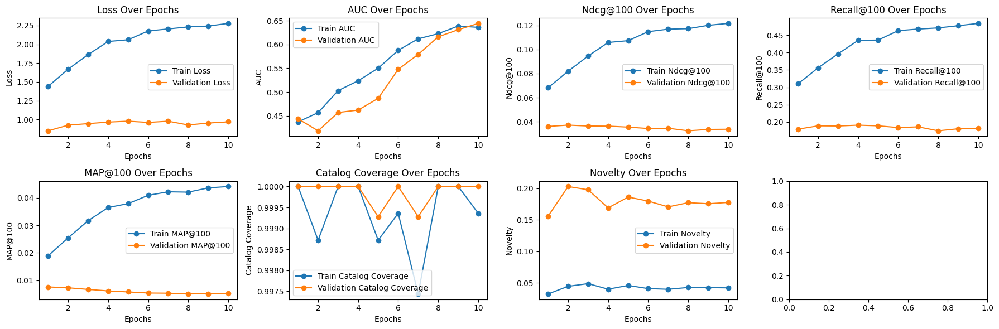

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


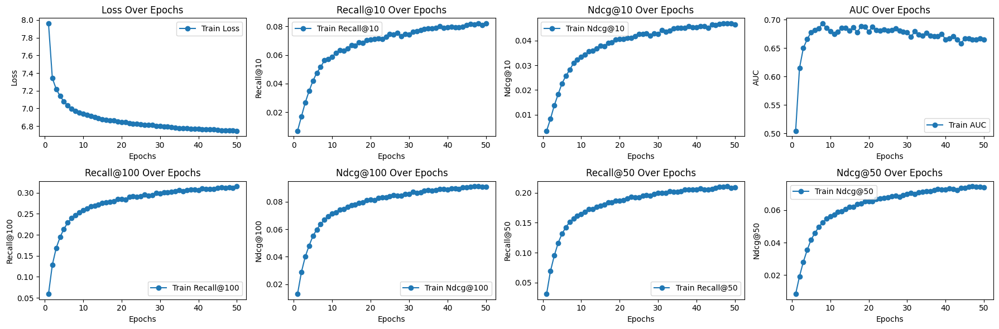

In [ ]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, None, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v3

In [ ]:
VERSION = 'v3'

_tower_dim = {
    'user':[128, 128],
    'item':[512, 256, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 2 # @param
_validation_freq = 5 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 128
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [ ]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

RuntimeError: ignored

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=5, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=5, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [ ]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 33s 505ms/step - loss: 7.3833 - auc: 0.5689 - recall_at_100: 0.1007 - mrr_at_100: 0.0073 - ndcg_at_100: 0.0230 - map_at_100: 0.0073 - precision_at_100: 0.0010 - recall_at_50: 0.0543 - mrr_at_50: 0.0066 - ndcg_at_50: 0.0156 - map_at_50: 0.0066 - precision_at_50: 0.0011 - recall_at_10: 0.0145 - mrr_at_10: 0.0050 - ndcg_at_10: 0.0072 - map_at_10: 0.0050 - precision_at_10: 0.0014 - regularization_loss: 0.0000e+00 - loss_batch: 7.3088
Epoch 2/50
35/35 [==============================] - 11s 268ms/step - loss: 7.0970 - auc: 0.6180 - recall_at_100: 0.2029 - mrr_at_100: 0.0200 - ndcg_at_100: 0.0515 - map_at_100: 0.0200 - precision_at_100: 0.0020 - recall_at_50: 0.1238 - mrr_at_50: 0.0189 - ndcg_at_50: 0.0387 - map_at_50: 0.0189 - precision_at_50: 0.0025 - recall_at_10: 0.0382 - mrr_at_10: 0.0154 - ndcg_at_10: 0.0206 - map_at_10: 0.0154 - precision_at_10: 0.0038 - regularization_loss: 0.0000e+00 - loss_batch: 7.0302
Epoch 3/50
35/35 [==========

69/69 [==============================] - 6s 22ms/step - loss: 1.6359 - auc: 0.5653 - recall_at_100: 0.3519 - mrr_at_100: 0.0254 - ndcg_at_100: 0.0816 - map_at_100: 0.0254 - precision_at_100: 0.0035 - recall_at_10: 0.0548 - mrr_at_10: 0.0168 - ndcg_at_10: 0.0255 - map_at_10: 0.0168 - precision_at_10: 0.0055 - regularization_loss: 0.0000e+00 - loss_batch: 1.6448
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.635948896408081, 'auc': 0.565330982208252, 'recall_at_100': 0.35219794511795044, 'mrr_at_100': 0.025360343977808952, 'ndcg_at_100': 0.08159705251455307, 'map_at_100': 0.025360343977808952, 'precision_at_100': 0.0035219788551330566, 'recall_at_10': 0.05458533763885498, 'mrr_at_10': 0.016833636909723282, 'ndcg_at_10': 0.025482455268502235, 'map_at_10': 0.016833636909723282, 'precision_at_10': 0.005458532832562923, 'regularization_loss': 0.0, 'loss_batch': 2.0673227310180664, 'coverage': 1.0, 'novelty': 0.025462400432023764}
Candidate set rows: 1387


15/15 [==============================] - 4s 25ms/step - loss: 0.9369 - auc: 0.5801 - recall_at_100: 0.1889 - mrr_at_100: 0.0078 - ndcg_at_100: 0.0376 - map_at_100: 0.0078 - precision_at_100: 0.0019 - recall_at_10: 0.0134 - mrr_at_10: 0.0035 - ndcg_at_10: 0.0057 - map_at_10: 0.0035 - precision_at_10: 0.0013 - regularization_loss: 0.0000e+00 - loss_batch: 0.9985
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9369248747825623, 'auc': 0.5801243782043457, 'recall_at_100': 0.19245687127113342, 'mrr_at_100': 0.007856449112296104, 'ndcg_at_100': 0.03825749084353447, 'map_at_100': 0.007856449112296104, 'precision_at_100': 0.0019245685543864965, 'recall_at_10': 0.0141768092289567, 'mrr_at_10': 0.0034611434675753117, 'ndcg_at_10': 0.005880034063011408, 'map_at_10': 0.0034611434675753117, 'precision_at_10': 0.001417680992744863, 'regularization_loss': 0.0, 'loss_batch': 1.6427901983261108, 'coverage': 0.9805335255948089, 'novelty': 0.15620341229087295}
35/35 [===============

69/69 [==============================] - 9s 26ms/step - loss: 1.7737 - auc: 0.5285 - recall_at_100: 0.3756 - mrr_at_100: 0.0269 - ndcg_at_100: 0.0869 - map_at_100: 0.0269 - precision_at_100: 0.0038 - recall_at_10: 0.0588 - mrr_at_10: 0.0179 - ndcg_at_10: 0.0273 - map_at_10: 0.0179 - precision_at_10: 0.0059 - regularization_loss: 0.0000e+00 - loss_batch: 1.7866
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.7737200260162354, 'auc': 0.5284672975540161, 'recall_at_100': 0.3764992356300354, 'mrr_at_100': 0.028165556490421295, 'ndcg_at_100': 0.088175468146801, 'map_at_100': 0.028165556490421295, 'precision_at_100': 0.0037649923469871283, 'recall_at_10': 0.06063929945230484, 'mrr_at_10': 0.019135188311338425, 'ndcg_at_10': 0.028656454756855965, 'map_at_10': 0.019135188311338425, 'precision_at_10': 0.006063929293304682, 'regularization_loss': 0.0, 'loss_batch': 2.398569107055664, 'coverage': 1.0, 'novelty': 0.03813182369591589}
Candidate set rows: 1387


15/15 [==============================] - 5s 39ms/step - loss: 0.9696 - auc: 0.5328 - recall_at_100: 0.1857 - mrr_at_100: 0.0071 - ndcg_at_100: 0.0362 - map_at_100: 0.0071 - precision_at_100: 0.0019 - recall_at_10: 0.0116 - mrr_at_10: 0.0030 - ndcg_at_10: 0.0049 - map_at_10: 0.0030 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 1.0256
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9695783257484436, 'auc': 0.532802402973175, 'recall_at_100': 0.19486424326896667, 'mrr_at_100': 0.007404153235256672, 'ndcg_at_100': 0.03809351101517677, 'map_at_100': 0.007404153235256672, 'precision_at_100': 0.0019486424280330539, 'recall_at_10': 0.012237528339028358, 'mrr_at_10': 0.0030101039446890354, 'ndcg_at_10': 0.005105634219944477, 'map_at_10': 0.0030101039446890354, 'precision_at_10': 0.001223752973601222, 'regularization_loss': 0.0, 'loss_batch': 1.6115323305130005, 'coverage': 0.9841384282624369, 'novelty': 0.16752531533131995}
35/35 [==============

69/69 [==============================] - 7s 22ms/step - loss: 1.7707 - auc: 0.5304 - recall_at_100: 0.3711 - mrr_at_100: 0.0285 - ndcg_at_100: 0.0875 - map_at_100: 0.0285 - precision_at_100: 0.0037 - recall_at_10: 0.0605 - mrr_at_10: 0.0196 - ndcg_at_10: 0.0290 - map_at_10: 0.0196 - precision_at_10: 0.0061 - regularization_loss: 0.0000e+00 - loss_batch: 1.7833
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.7707085609436035, 'auc': 0.5303856134414673, 'recall_at_100': 0.3739922046661377, 'mrr_at_100': 0.02896852232515812, 'ndcg_at_100': 0.08844352513551712, 'map_at_100': 0.02896852232515812, 'precision_at_100': 0.003739920910447836, 'recall_at_10': 0.06162217631936073, 'mrr_at_10': 0.020035438239574432, 'ndcg_at_10': 0.02957862988114357, 'map_at_10': 0.020035438239574432, 'precision_at_10': 0.006162217352539301, 'regularization_loss': 0.0, 'loss_batch': 2.379899501800537, 'coverage': 1.0, 'novelty': 0.04869107244281509}
Candidate set rows: 1387


15/15 [==============================] - 6s 38ms/step - loss: 0.9361 - auc: 0.5381 - recall_at_100: 0.1793 - mrr_at_100: 0.0057 - ndcg_at_100: 0.0338 - map_at_100: 0.0057 - precision_at_100: 0.0018 - recall_at_10: 0.0074 - mrr_at_10: 0.0016 - ndcg_at_10: 0.0029 - map_at_10: 0.0016 - precision_at_10: 7.3806e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9962
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9361207485198975, 'auc': 0.5381256341934204, 'recall_at_100': 0.18496723473072052, 'mrr_at_100': 0.006291001569479704, 'ndcg_at_100': 0.035368919372558594, 'map_at_100': 0.006291001569479704, 'precision_at_100': 0.001849672175012529, 'recall_at_10': 0.008827069774270058, 'mrr_at_10': 0.0020674513652920723, 'ndcg_at_10': 0.0035920904483646154, 'map_at_10': 0.0020674513652920723, 'precision_at_10': 0.0008827070123516023, 'regularization_loss': 0.0, 'loss_batch': 1.6247341632843018, 'coverage': 0.9877433309300648, 'novelty': 0.19802603947921044}
35/35 [=======

69/69 [==============================] - 8s 36ms/step - loss: 1.9299 - auc: 0.5251 - recall_at_100: 0.4116 - mrr_at_100: 0.0334 - ndcg_at_100: 0.0992 - map_at_100: 0.0334 - precision_at_100: 0.0041 - recall_at_10: 0.0725 - mrr_at_10: 0.0234 - ndcg_at_10: 0.0346 - map_at_10: 0.0234 - precision_at_10: 0.0072 - regularization_loss: 0.0000e+00 - loss_batch: 1.9414
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9298920631408691, 'auc': 0.5250973105430603, 'recall_at_100': 0.4132218360900879, 'mrr_at_100': 0.034292928874492645, 'ndcg_at_100': 0.10021757334470749, 'map_at_100': 0.034292928874492645, 'precision_at_100': 0.0041322181932628155, 'recall_at_10': 0.07428563386201859, 'mrr_at_10': 0.02426823414862156, 'ndcg_at_10': 0.0357578806579113, 'map_at_10': 0.02426823414862156, 'precision_at_10': 0.007428563199937344, 'regularization_loss': 0.0, 'loss_batch': 2.4886395931243896, 'coverage': 1.0, 'novelty': 0.03721535972216741}
Candidate set rows: 1387


15/15 [==============================] - 3s 24ms/step - loss: 0.9813 - auc: 0.5365 - recall_at_100: 0.1938 - mrr_at_100: 0.0069 - ndcg_at_100: 0.0372 - map_at_100: 0.0069 - precision_at_100: 0.0019 - recall_at_10: 0.0102 - mrr_at_10: 0.0027 - ndcg_at_10: 0.0044 - map_at_10: 0.0027 - precision_at_10: 0.0010 - regularization_loss: 0.0000e+00 - loss_batch: 1.0238
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.981310248374939, 'auc': 0.5365039706230164, 'recall_at_100': 0.19452989101409912, 'mrr_at_100': 0.006807334721088409, 'ndcg_at_100': 0.03738019987940788, 'map_at_100': 0.006807334721088409, 'precision_at_100': 0.0019452989799901843, 'recall_at_10': 0.010298248380422592, 'mrr_at_10': 0.0024225881788879633, 'ndcg_at_10': 0.0042109075002372265, 'map_at_10': 0.0024225881788879633, 'precision_at_10': 0.0010298248380422592, 'regularization_loss': 0.0, 'loss_batch': 1.4682735204696655, 'coverage': 0.9870223503965393, 'novelty': 0.16860361165742893}
35/35 [============

69/69 [==============================] - 9s 36ms/step - loss: 1.9498 - auc: 0.5537 - recall_at_100: 0.4146 - mrr_at_100: 0.0342 - ndcg_at_100: 0.1002 - map_at_100: 0.0342 - precision_at_100: 0.0041 - recall_at_10: 0.0738 - mrr_at_10: 0.0242 - ndcg_at_10: 0.0356 - map_at_10: 0.0242 - precision_at_10: 0.0074 - regularization_loss: 0.0000e+00 - loss_batch: 1.9622
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9498282670974731, 'auc': 0.553683876991272, 'recall_at_100': 0.4126235842704773, 'mrr_at_100': 0.034680381417274475, 'ndcg_at_100': 0.10033991932868958, 'map_at_100': 0.034680381417274475, 'precision_at_100': 0.004126235842704773, 'recall_at_10': 0.0743710994720459, 'mrr_at_10': 0.024758033454418182, 'ndcg_at_10': 0.036173827946186066, 'map_at_10': 0.024758033454418182, 'precision_at_10': 0.0074371094815433025, 'regularization_loss': 0.0, 'loss_batch': 2.548804998397827, 'coverage': 1.0, 'novelty': 0.04290459074571182}
Candidate set rows: 1387


15/15 [==============================] - 5s 27ms/step - loss: 0.9547 - auc: 0.5820 - recall_at_100: 0.1807 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0342 - map_at_100: 0.0058 - precision_at_100: 0.0018 - recall_at_10: 0.0078 - mrr_at_10: 0.0018 - ndcg_at_10: 0.0031 - map_at_10: 0.0018 - precision_at_10: 7.8158e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0052
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9547443985939026, 'auc': 0.5820333957672119, 'recall_at_100': 0.18523472547531128, 'mrr_at_100': 0.005949672777205706, 'ndcg_at_100': 0.03506045788526535, 'map_at_100': 0.005949672777205706, 'precision_at_100': 0.00185234728269279, 'recall_at_10': 0.008760198019444942, 'mrr_at_10': 0.0017875719349831343, 'ndcg_at_10': 0.0033423525746911764, 'map_at_10': 0.0017875719349831343, 'precision_at_10': 0.0008760197670198977, 'regularization_loss': 0.0, 'loss_batch': 1.5333625078201294, 'coverage': 0.9877433309300648, 'novelty': 0.1815206929740135}
35/35 [==========

69/69 [==============================] - 9s 36ms/step - loss: 2.0557 - auc: 0.5334 - recall_at_100: 0.4357 - mrr_at_100: 0.0363 - ndcg_at_100: 0.1059 - map_at_100: 0.0363 - precision_at_100: 0.0044 - recall_at_10: 0.0799 - mrr_at_10: 0.0257 - ndcg_at_10: 0.0381 - map_at_10: 0.0257 - precision_at_10: 0.0080 - regularization_loss: 0.0000e+00 - loss_batch: 2.0689
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.055673360824585, 'auc': 0.5333872437477112, 'recall_at_100': 0.43806445598602295, 'mrr_at_100': 0.03716392070055008, 'ndcg_at_100': 0.1071302518248558, 'map_at_100': 0.03716392070055008, 'precision_at_100': 0.004380643833428621, 'recall_at_10': 0.08093786239624023, 'mrr_at_10': 0.026484787464141846, 'ndcg_at_10': 0.03900858387351036, 'map_at_10': 0.026484787464141846, 'precision_at_10': 0.008093786425888538, 'regularization_loss': 0.0, 'loss_batch': 2.696908950805664, 'coverage': 1.0, 'novelty': 0.035848697966166125}
Candidate set rows: 1387


15/15 [==============================] - 4s 34ms/step - loss: 1.0152 - auc: 0.5371 - recall_at_100: 0.1953 - mrr_at_100: 0.0065 - ndcg_at_100: 0.0371 - map_at_100: 0.0065 - precision_at_100: 0.0020 - recall_at_10: 0.0096 - mrr_at_10: 0.0021 - ndcg_at_10: 0.0038 - map_at_10: 0.0021 - precision_at_10: 9.6059e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0530
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 1.0151697397232056, 'auc': 0.5371431112289429, 'recall_at_100': 0.1980072259902954, 'mrr_at_100': 0.0064941453747451305, 'ndcg_at_100': 0.037569861859083176, 'map_at_100': 0.0064941453747451305, 'precision_at_100': 0.0019800723530352116, 'recall_at_10': 0.009897017851471901, 'mrr_at_10': 0.0021053189411759377, 'ndcg_at_10': 0.0038590512704104185, 'map_at_10': 0.0021053189411759377, 'precision_at_10': 0.0009897018317133188, 'regularization_loss': 0.0, 'loss_batch': 1.4485188722610474, 'coverage': 0.9826964671953857, 'novelty': 0.15894151356817798}
35/35 [=====

69/69 [==============================] - 9s 34ms/step - loss: 2.0368 - auc: 0.5328 - recall_at_100: 0.4303 - mrr_at_100: 0.0354 - ndcg_at_100: 0.1042 - map_at_100: 0.0354 - precision_at_100: 0.0043 - recall_at_10: 0.0789 - mrr_at_10: 0.0250 - ndcg_at_10: 0.0374 - map_at_10: 0.0250 - precision_at_10: 0.0079 - regularization_loss: 0.0000e+00 - loss_batch: 2.0492
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.036775827407837, 'auc': 0.5328189730644226, 'recall_at_100': 0.4309706389904022, 'mrr_at_100': 0.036516427993774414, 'ndcg_at_100': 0.10526955872774124, 'map_at_100': 0.036516427993774414, 'precision_at_100': 0.004309705924242735, 'recall_at_10': 0.07982678711414337, 'mrr_at_10': 0.026104075834155083, 'ndcg_at_10': 0.038447897881269455, 'map_at_10': 0.026104075834155083, 'precision_at_10': 0.007982680574059486, 'regularization_loss': 0.0, 'loss_batch': 2.641695022583008, 'coverage': 1.0, 'novelty': 0.04279361045561808}
Candidate set rows: 1387


15/15 [==============================] - 5s 41ms/step - loss: 0.9927 - auc: 0.5494 - recall_at_100: 0.1895 - mrr_at_100: 0.0066 - ndcg_at_100: 0.0363 - map_at_100: 0.0066 - precision_at_100: 0.0019 - recall_at_10: 0.0096 - mrr_at_10: 0.0024 - ndcg_at_10: 0.0040 - map_at_10: 0.0024 - precision_at_10: 9.6164e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0285
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9927406311035156, 'auc': 0.5493918061256409, 'recall_at_100': 0.19225625693798065, 'mrr_at_100': 0.0063546327874064445, 'ndcg_at_100': 0.03655141219496727, 'map_at_100': 0.0063546327874064445, 'precision_at_100': 0.0019225624855607748, 'recall_at_10': 0.009027685038745403, 'mrr_at_10': 0.0020175629761070013, 'ndcg_at_10': 0.003586740465834737, 'map_at_10': 0.0020175629761070013, 'precision_at_10': 0.0009027685737237334, 'regularization_loss': 0.0, 'loss_batch': 1.4028337001800537, 'coverage': 0.9906272530641672, 'novelty': 0.17944814462416747}
35/35 [======

69/69 [==============================] - 7s 23ms/step - loss: 2.1098 - auc: 0.5203 - recall_at_100: 0.4452 - mrr_at_100: 0.0378 - ndcg_at_100: 0.1091 - map_at_100: 0.0378 - precision_at_100: 0.0045 - recall_at_10: 0.0838 - mrr_at_10: 0.0269 - ndcg_at_10: 0.0400 - map_at_10: 0.0269 - precision_at_10: 0.0084 - regularization_loss: 0.0000e+00 - loss_batch: 2.1216
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.1098239421844482, 'auc': 0.5202866792678833, 'recall_at_100': 0.44689610600471497, 'mrr_at_100': 0.038496535271406174, 'ndcg_at_100': 0.10994207859039307, 'map_at_100': 0.038496535271406174, 'precision_at_100': 0.004468961618840694, 'recall_at_10': 0.0844847708940506, 'mrr_at_10': 0.027560202404856682, 'ndcg_at_10': 0.0406506173312664, 'map_at_10': 0.027560202404856682, 'precision_at_10': 0.00844847597181797, 'regularization_loss': 0.0, 'loss_batch': 2.682171106338501, 'coverage': 1.0, 'novelty': 0.03805027639914457}
Candidate set rows: 1387


15/15 [==============================] - 4s 25ms/step - loss: 0.9668 - auc: 0.5275 - recall_at_100: 0.1840 - mrr_at_100: 0.0056 - ndcg_at_100: 0.0345 - map_at_100: 0.0056 - precision_at_100: 0.0018 - recall_at_10: 0.0071 - mrr_at_10: 0.0014 - ndcg_at_10: 0.0027 - map_at_10: 0.0014 - precision_at_10: 7.0850e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9989
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9668462872505188, 'auc': 0.5274742841720581, 'recall_at_100': 0.1865052878856659, 'mrr_at_100': 0.005804101005196571, 'ndcg_at_100': 0.03511127457022667, 'map_at_100': 0.005804101005196571, 'precision_at_100': 0.0018650527345016599, 'recall_at_10': 0.00795773696154356, 'mrr_at_10': 0.001610016799531877, 'ndcg_at_10': 0.0030318608041852713, 'map_at_10': 0.001610016799531877, 'precision_at_10': 0.000795773696154356, 'regularization_loss': 0.0, 'loss_batch': 1.3344643115997314, 'coverage': 0.9834174477289113, 'novelty': 0.16183284709112752}
35/35 [============

69/69 [==============================] - 7s 24ms/step - loss: 2.0833 - auc: 0.5161 - recall_at_100: 0.4387 - mrr_at_100: 0.0375 - ndcg_at_100: 0.1076 - map_at_100: 0.0375 - precision_at_100: 0.0044 - recall_at_10: 0.0833 - mrr_at_10: 0.0268 - ndcg_at_10: 0.0398 - map_at_10: 0.0268 - precision_at_10: 0.0083 - regularization_loss: 0.0000e+00 - loss_batch: 2.0949
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.0833492279052734, 'auc': 0.5160784721374512, 'recall_at_100': 0.4405287504196167, 'mrr_at_100': 0.03856515511870384, 'ndcg_at_100': 0.10892762243747711, 'map_at_100': 0.03856515511870384, 'precision_at_100': 0.0044052875600755215, 'recall_at_10': 0.08558160811662674, 'mrr_at_10': 0.027921410277485847, 'ndcg_at_10': 0.04117982089519501, 'map_at_10': 0.027921410277485847, 'precision_at_10': 0.008558161556720734, 'regularization_loss': 0.0, 'loss_batch': 2.644331693649292, 'coverage': 1.0, 'novelty': 0.04047210300429185}
Candidate set rows: 1387


15/15 [==============================] - 5s 24ms/step - loss: 0.9518 - auc: 0.5229 - recall_at_100: 0.1790 - mrr_at_100: 0.0055 - ndcg_at_100: 0.0334 - map_at_100: 0.0055 - precision_at_100: 0.0018 - recall_at_10: 0.0066 - mrr_at_10: 0.0015 - ndcg_at_10: 0.0027 - map_at_10: 0.0015 - precision_at_10: 6.5727e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0024
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.951804518699646, 'auc': 0.5228888988494873, 'recall_at_100': 0.181690514087677, 'mrr_at_100': 0.005623241420835257, 'ndcg_at_100': 0.03415035456418991, 'map_at_100': 0.005623241420835257, 'precision_at_100': 0.0018169052200391889, 'recall_at_10': 0.0066871740855276585, 'mrr_at_10': 0.0014519925462082028, 'ndcg_at_10': 0.002629911992698908, 'map_at_10': 0.0014519925462082028, 'precision_at_10': 0.0006687174900434911, 'regularization_loss': 0.0, 'loss_batch': 1.5309640169143677, 'coverage': 0.9877433309300648, 'novelty': 0.1743390645220928}
35/35 [===========

69/69 [==============================] - 7s 32ms/step - loss: 2.0750 - auc: 0.5387 - recall_at_100: 0.4413 - mrr_at_100: 0.0384 - ndcg_at_100: 0.1089 - map_at_100: 0.0384 - precision_at_100: 0.0044 - recall_at_10: 0.0849 - mrr_at_10: 0.0276 - ndcg_at_10: 0.0408 - map_at_10: 0.0276 - precision_at_10: 0.0085 - regularization_loss: 0.0000e+00 - loss_batch: 2.0874
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.0750458240509033, 'auc': 0.5387058854103088, 'recall_at_100': 0.43974530696868896, 'mrr_at_100': 0.0390460379421711, 'ndcg_at_100': 0.10925523936748505, 'map_at_100': 0.0390460379421711, 'precision_at_100': 0.0043974523432552814, 'recall_at_10': 0.08592347800731659, 'mrr_at_10': 0.028361419215798378, 'ndcg_at_10': 0.04159120097756386, 'map_at_10': 0.028361419215798378, 'precision_at_10': 0.008592347614467144, 'regularization_loss': 0.0, 'loss_batch': 2.673429250717163, 'coverage': 1.0, 'novelty': 0.036863296978226025}
Candidate set rows: 1387


15/15 [==============================] - 4s 25ms/step - loss: 0.9348 - auc: 0.5523 - recall_at_100: 0.1739 - mrr_at_100: 0.0050 - ndcg_at_100: 0.0322 - map_at_100: 0.0050 - precision_at_100: 0.0017 - recall_at_10: 0.0054 - mrr_at_10: 0.0010 - ndcg_at_10: 0.0020 - map_at_10: 0.0010 - precision_at_10: 5.3894e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9779
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9348215460777283, 'auc': 0.5523324012756348, 'recall_at_100': 0.17747759819030762, 'mrr_at_100': 0.005218330770730972, 'ndcg_at_100': 0.03302472457289696, 'map_at_100': 0.005218330770730972, 'precision_at_100': 0.001774776028469205, 'recall_at_10': 0.006152200046926737, 'mrr_at_10': 0.0012509261723607779, 'ndcg_at_10': 0.0023561788257211447, 'map_at_10': 0.0012509261723607779, 'precision_at_10': 0.0006152199930511415, 'regularization_loss': 0.0, 'loss_batch': 1.4280250072479248, 'coverage': 0.9863013698630136, 'novelty': 0.17217454811027935}
35/35 [========

#### analysis

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v3


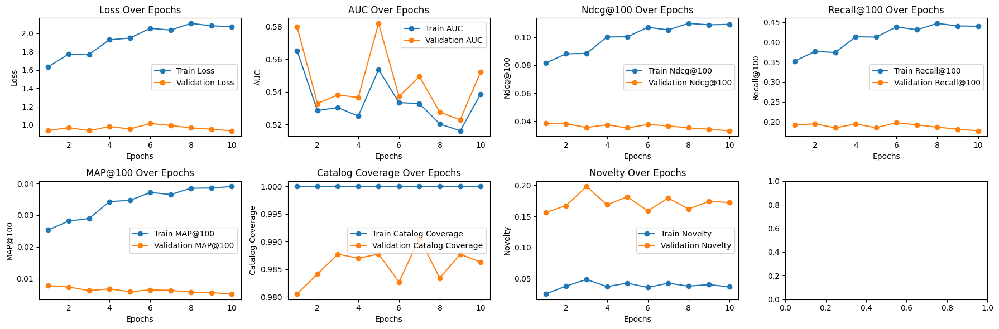

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


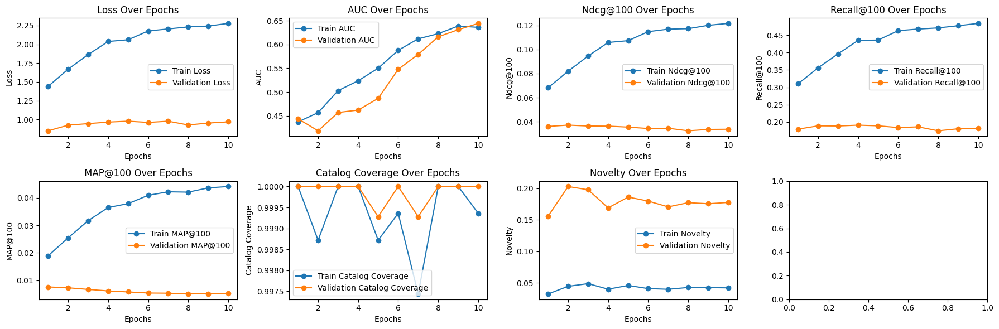

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


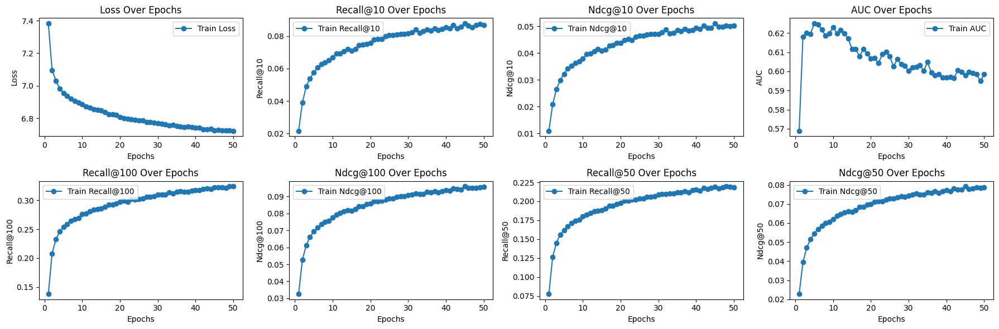

In [ ]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, None, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v4

In [ ]:
VERSION = 'v4'

_tower_dim = {
    'user':[128, 128],
    'item':[512, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 2 # @param
_validation_freq = 5 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 128
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [ ]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=5, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=5, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [ ]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

KeyboardInterrupt: ignored

#### analysis

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v4


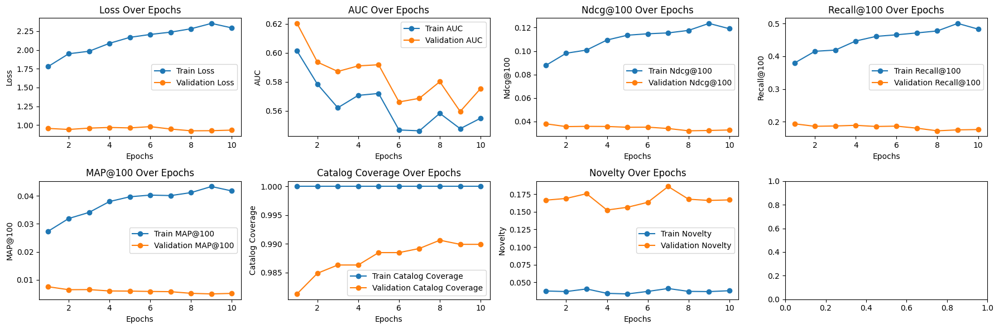

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


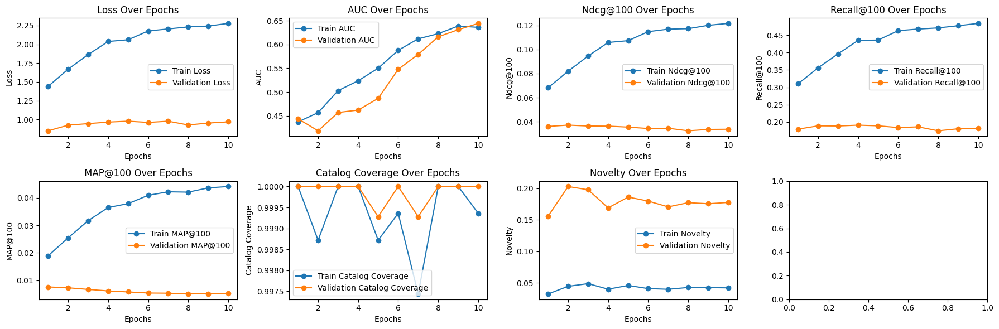

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


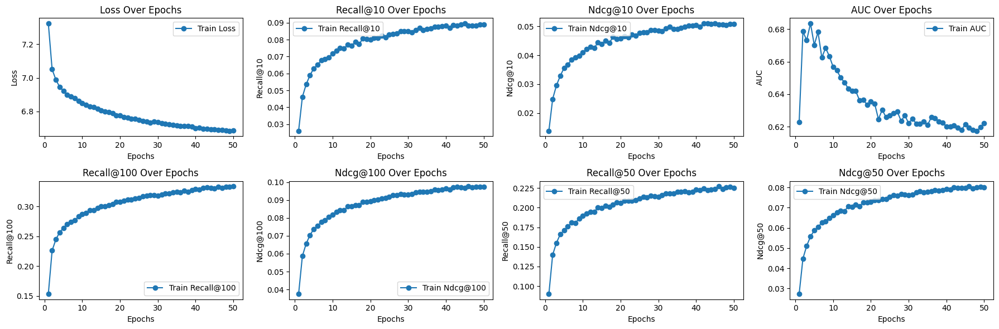

In [ ]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, None, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v5

In [ ]:
VERSION = 'v5'

_tower_dim = {
    'user':[128, 128],
    'item':[512, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 2 # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 64
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [ ]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=50, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=50, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [ ]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 54s 897ms/step - loss: 7.4665 - auc: 0.5594 - recall_at_100: 0.0795 - mrr_at_100: 0.0059 - ndcg_at_100: 0.0182 - map_at_100: 0.0059 - precision_at_100: 7.9487e-04 - recall_at_50: 0.0412 - mrr_at_50: 0.0054 - ndcg_at_50: 0.0120 - map_at_50: 0.0054 - precision_at_50: 8.2416e-04 - recall_at_10: 0.0103 - mrr_at_10: 0.0041 - ndcg_at_10: 0.0055 - map_at_10: 0.0041 - precision_at_10: 0.0010 - regularization_loss: 0.0000e+00 - loss_batch: 7.3981 - val_loss: 7.3968 - val_auc: 0.5761 - val_recall_at_100: 0.1279 - val_mrr_at_100: 0.0086 - val_ndcg_at_100: 0.0286 - val_map_at_100: 0.0086 - val_precision_at_100: 0.0013 - val_recall_at_50: 0.0704 - val_mrr_at_50: 0.0078 - val_ndcg_at_50: 0.0194 - val_map_at_50: 0.0078 - val_precision_at_50: 0.0014 - val_recall_at_10: 0.0166 - val_mrr_at_10: 0.0057 - val_ndcg_at_10: 0.0082 - val_map_at_10: 0.0057 - val_precision_at_10: 0.0017 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.3121
Epoch 2/50


69/69 [==============================] - 6s 19ms/step - loss: 2.1068 - auc: 0.5766 - recall_at_100: 0.4470 - mrr_at_100: 0.0371 - ndcg_at_100: 0.1086 - map_at_100: 0.0371 - precision_at_100: 0.0045 - recall_at_10: 0.0812 - mrr_at_10: 0.0262 - ndcg_at_10: 0.0388 - map_at_10: 0.0262 - precision_at_10: 0.0081 - regularization_loss: 0.0000e+00 - loss_batch: 2.1184
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.1068129539489746, 'auc': 0.5766170024871826, 'recall_at_100': 0.4495171010494232, 'mrr_at_100': 0.038073763251304626, 'ndcg_at_100': 0.10980609059333801, 'map_at_100': 0.038073763251304626, 'precision_at_100': 0.004495170898735523, 'recall_at_10': 0.08333095908164978, 'mrr_at_10': 0.027193885296583176, 'ndcg_at_10': 0.0400838740170002, 'map_at_10': 0.027193885296583176, 'precision_at_10': 0.008333097212016582, 'regularization_loss': 0.0, 'loss_batch': 2.6677067279815674, 'coverage': 0.9993593850096092, 'novelty': 0.03520890116865175}
Candidate set rows: 1387


15/15 [==============================] - 3s 24ms/step - loss: 0.9666 - auc: 0.5941 - recall_at_100: 0.1810 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0343 - map_at_100: 0.0058 - precision_at_100: 0.0018 - recall_at_10: 0.0081 - mrr_at_10: 0.0017 - ndcg_at_10: 0.0032 - map_at_10: 0.0017 - precision_at_10: 8.0526e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0119
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.966554582118988, 'auc': 0.5941396951675415, 'recall_at_100': 0.1884445697069168, 'mrr_at_100': 0.006069611757993698, 'ndcg_at_100': 0.035677142441272736, 'map_at_100': 0.006069611757993698, 'precision_at_100': 0.001884445664472878, 'recall_at_10': 0.008626454509794712, 'mrr_at_10': 0.001811136375181377, 'ndcg_at_10': 0.0033431858755648136, 'map_at_10': 0.001811136375181377, 'precision_at_10': 0.0008626453927718103, 'regularization_loss': 0.0, 'loss_batch': 1.4864853620529175, 'coverage': 0.9956741167988464, 'novelty': 0.15706195869420386}
35/35 [===========

#### analysis

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

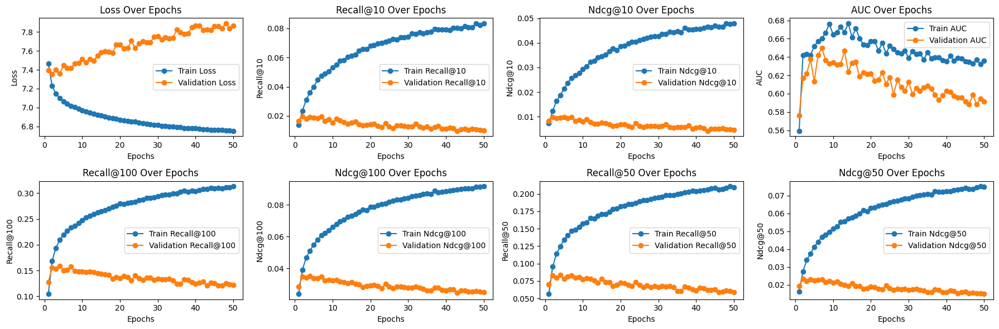

In [ ]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

Plot for model v5


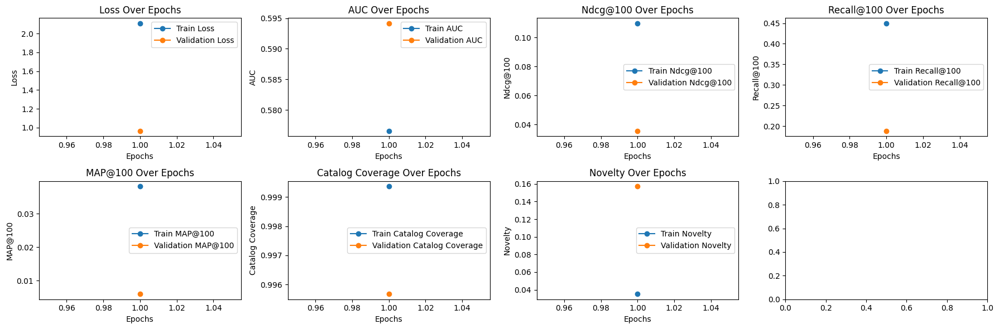

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


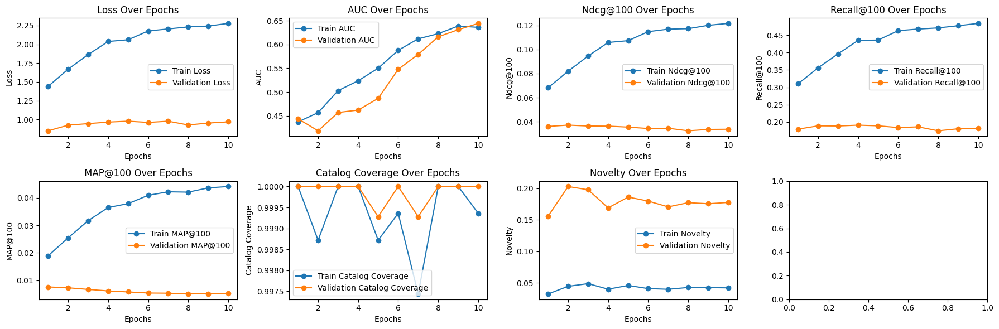

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


### model_v6

In [ ]:
VERSION = 'v6'

_tower_dim = {
    'user':[128, 128],
    'item':[512, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 2 # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [ ]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=25, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=25, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [ ]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 50s 761ms/step - loss: 7.4767 - auc: 0.5879 - recall_at_100: 0.0814 - mrr_at_100: 0.0056 - ndcg_at_100: 0.0182 - map_at_100: 0.0056 - precision_at_100: 8.1389e-04 - recall_at_50: 0.0426 - mrr_at_50: 0.0050 - ndcg_at_50: 0.0120 - map_at_50: 0.0050 - precision_at_50: 8.5292e-04 - recall_at_10: 0.0095 - mrr_at_10: 0.0037 - ndcg_at_10: 0.0051 - map_at_10: 0.0037 - precision_at_10: 9.4762e-04 - regularization_loss: 0.0000e+00 - loss_batch: 7.4085 - val_loss: 7.3972 - val_auc: 0.6373 - val_recall_at_100: 0.1267 - val_mrr_at_100: 0.0085 - val_ndcg_at_100: 0.0284 - val_map_at_100: 0.0085 - val_precision_at_100: 0.0013 - val_recall_at_50: 0.0685 - val_mrr_at_50: 0.0077 - val_ndcg_at_50: 0.0190 - val_map_at_50: 0.0077 - val_precision_at_50: 0.0014 - val_recall_at_10: 0.0151 - val_mrr_at_10: 0.0056 - val_ndcg_at_10: 0.0078 - val_map_at_10: 0.0056 - val_precision_at_10: 0.0015 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.2303
Epoch 2

69/69 [==============================] - 6s 21ms/step - loss: 1.9048 - auc: 0.5216 - recall_at_100: 0.4059 - mrr_at_100: 0.0332 - ndcg_at_100: 0.0979 - map_at_100: 0.0332 - precision_at_100: 0.0041 - recall_at_10: 0.0705 - mrr_at_10: 0.0234 - ndcg_at_10: 0.0342 - map_at_10: 0.0234 - precision_at_10: 0.0071 - regularization_loss: 0.0000e+00 - loss_batch: 1.9150
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9048019647598267, 'auc': 0.5215737223625183, 'recall_at_100': 0.40772342681884766, 'mrr_at_100': 0.03326280787587166, 'ndcg_at_100': 0.09825717657804489, 'map_at_100': 0.03326280787587166, 'precision_at_100': 0.0040772343054413795, 'recall_at_10': 0.07173585146665573, 'mrr_at_10': 0.023418264463543892, 'ndcg_at_10': 0.034513235092163086, 'map_at_10': 0.023418264463543892, 'precision_at_10': 0.007173583842813969, 'regularization_loss': 0.0, 'loss_batch': 2.398939609527588, 'coverage': 0.9993593850096092, 'novelty': 0.03527475404930236}
Candidate set rows: 1387


15/15 [==============================] - 5s 24ms/step - loss: 0.9859 - auc: 0.5070 - recall_at_100: 0.1919 - mrr_at_100: 0.0071 - ndcg_at_100: 0.0372 - map_at_100: 0.0071 - precision_at_100: 0.0019 - recall_at_10: 0.0127 - mrr_at_10: 0.0029 - ndcg_at_10: 0.0051 - map_at_10: 0.0029 - precision_at_10: 0.0013 - regularization_loss: 0.0000e+00 - loss_batch: 1.0296
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.985910952091217, 'auc': 0.5070129036903381, 'recall_at_100': 0.1968035250902176, 'mrr_at_100': 0.007466100621968508, 'ndcg_at_100': 0.03845718875527382, 'map_at_100': 0.007466100621968508, 'precision_at_100': 0.00196803524158895, 'recall_at_10': 0.013374348171055317, 'mrr_at_10': 0.0030666000675410032, 'ndcg_at_10': 0.0054024686105549335, 'map_at_10': 0.0030666000675410032, 'precision_at_10': 0.0013374347472563386, 'regularization_loss': 0.0, 'loss_batch': 1.486833930015564, 'coverage': 0.9956741167988464, 'novelty': 0.15343312723722746}
35/35 [================

69/69 [==============================] - 6s 21ms/step - loss: 2.1281 - auc: 0.5320 - recall_at_100: 0.4485 - mrr_at_100: 0.0365 - ndcg_at_100: 0.1081 - map_at_100: 0.0365 - precision_at_100: 0.0045 - recall_at_10: 0.0798 - mrr_at_10: 0.0256 - ndcg_at_10: 0.0381 - map_at_10: 0.0256 - precision_at_10: 0.0080 - regularization_loss: 0.0000e+00 - loss_batch: 2.1443
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.1281418800354004, 'auc': 0.5319961905479431, 'recall_at_100': 0.4489615559577942, 'mrr_at_100': 0.03713157773017883, 'ndcg_at_100': 0.10873929411172867, 'map_at_100': 0.03713157773017883, 'precision_at_100': 0.004489616025239229, 'recall_at_10': 0.08065297454595566, 'mrr_at_10': 0.02628828026354313, 'ndcg_at_10': 0.03877876326441765, 'map_at_10': 0.02628828026354313, 'precision_at_10': 0.008065295405685902, 'regularization_loss': 0.0, 'loss_batch': 2.9119882583618164, 'coverage': 1.0, 'novelty': 0.04213207041372532}
Candidate set rows: 1387


15/15 [==============================] - 3s 24ms/step - loss: 0.9392 - auc: 0.5026 - recall_at_100: 0.1795 - mrr_at_100: 0.0055 - ndcg_at_100: 0.0336 - map_at_100: 0.0055 - precision_at_100: 0.0018 - recall_at_10: 0.0082 - mrr_at_10: 0.0016 - ndcg_at_10: 0.0031 - map_at_10: 0.0016 - precision_at_10: 8.1533e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9880
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9392232298851013, 'auc': 0.502617597579956, 'recall_at_100': 0.18055370450019836, 'mrr_at_100': 0.005777575541287661, 'ndcg_at_100': 0.03403248265385628, 'map_at_100': 0.005777575541287661, 'precision_at_100': 0.001805537031032145, 'recall_at_10': 0.008158352226018906, 'mrr_at_10': 0.0018160984618589282, 'ndcg_at_10': 0.0032439299393445253, 'map_at_10': 0.0018160984618589282, 'precision_at_10': 0.0008158351993188262, 'regularization_loss': 0.0, 'loss_batch': 1.4982693195343018, 'coverage': 0.9913482335976929, 'novelty': 0.17176684881602916}
35/35 [=========

#### analysis

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

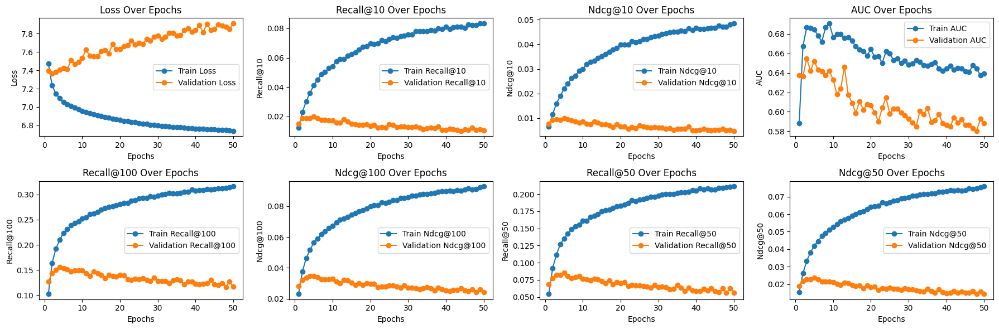

In [ ]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

Plot for model v6


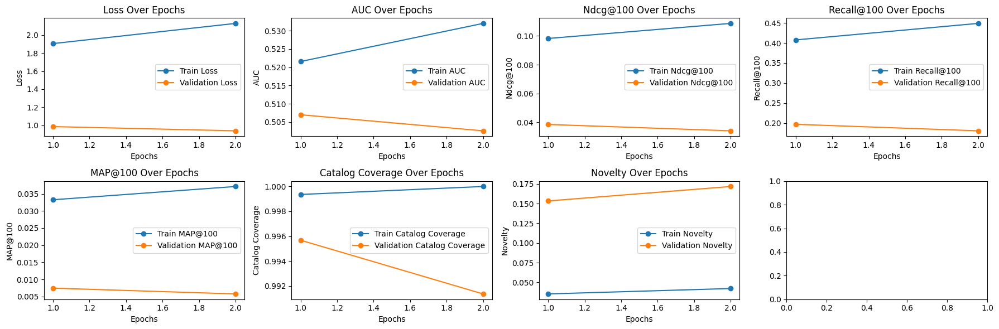

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


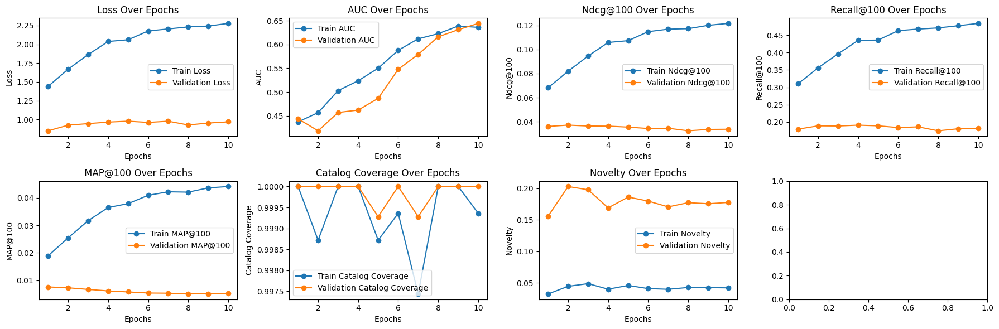

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


### model_v7

In [ ]:
VERSION = 'v7'

_tower_dim = {
    'user':[128, 128],
    'item':[512, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 4 # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [ ]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=25, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=25, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [ ]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 34s 598ms/step - loss: 7.3890 - auc: 0.6262 - recall_at_100: 0.1025 - mrr_at_100: 0.0078 - ndcg_at_100: 0.0238 - map_at_100: 0.0078 - precision_at_100: 0.0010 - recall_at_50: 0.0570 - mrr_at_50: 0.0072 - ndcg_at_50: 0.0165 - map_at_50: 0.0072 - precision_at_50: 0.0011 - recall_at_10: 0.0152 - mrr_at_10: 0.0055 - ndcg_at_10: 0.0077 - map_at_10: 0.0055 - precision_at_10: 0.0015 - regularization_loss: 0.0000e+00 - loss_batch: 7.3161 - val_loss: 7.4203 - val_auc: 0.6366 - val_recall_at_100: 0.1420 - val_mrr_at_100: 0.0103 - val_ndcg_at_100: 0.0325 - val_map_at_100: 0.0103 - val_precision_at_100: 0.0014 - val_recall_at_50: 0.0774 - val_mrr_at_50: 0.0095 - val_ndcg_at_50: 0.0221 - val_map_at_50: 0.0095 - val_precision_at_50: 0.0015 - val_recall_at_10: 0.0192 - val_mrr_at_10: 0.0072 - val_ndcg_at_10: 0.0099 - val_map_at_10: 0.0072 - val_precision_at_10: 0.0019 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.4380
Epoch 2/50
35/35 [=

69/69 [==============================] - 8s 33ms/step - loss: 2.0681 - auc: 0.5559 - recall_at_100: 0.4359 - mrr_at_100: 0.0354 - ndcg_at_100: 0.1049 - map_at_100: 0.0354 - precision_at_100: 0.0044 - recall_at_10: 0.0766 - mrr_at_10: 0.0248 - ndcg_at_10: 0.0367 - map_at_10: 0.0248 - precision_at_10: 0.0077 - regularization_loss: 0.0000e+00 - loss_batch: 2.0821
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.0681447982788086, 'auc': 0.5558827519416809, 'recall_at_100': 0.4371670186519623, 'mrr_at_100': 0.03603952378034592, 'ndcg_at_100': 0.10579080879688263, 'map_at_100': 0.03603952378034592, 'precision_at_100': 0.004371669143438339, 'recall_at_10': 0.0784023255109787, 'mrr_at_10': 0.02545853704214096, 'ndcg_at_10': 0.03761468082666397, 'map_at_10': 0.02545853704214096, 'precision_at_10': 0.007840231992304325, 'regularization_loss': 0.0, 'loss_batch': 2.7454965114593506, 'coverage': 1.0, 'novelty': 0.04030258996495427}
Candidate set rows: 1387


15/15 [==============================] - 3s 23ms/step - loss: 0.9108 - auc: 0.5411 - recall_at_100: 0.1737 - mrr_at_100: 0.0059 - ndcg_at_100: 0.0332 - map_at_100: 0.0059 - precision_at_100: 0.0017 - recall_at_10: 0.0093 - mrr_at_10: 0.0020 - ndcg_at_10: 0.0036 - map_at_10: 0.0020 - precision_at_10: 9.3444e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9575
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9108282923698425, 'auc': 0.5411443114280701, 'recall_at_100': 0.1776782125234604, 'mrr_at_100': 0.006056155543774366, 'ndcg_at_100': 0.03395234793424606, 'map_at_100': 0.006056155543774366, 'precision_at_100': 0.0017767819808796048, 'recall_at_10': 0.008626454509794712, 'mrr_at_10': 0.002021410735324025, 'ndcg_at_10': 0.003504042513668537, 'map_at_10': 0.002021410735324025, 'precision_at_10': 0.0008626453927718103, 'regularization_loss': 0.0, 'loss_batch': 1.4450300931930542, 'coverage': 0.9942321557317952, 'novelty': 0.17430683918669132}
35/35 [===========

69/69 [==============================] - 7s 31ms/step - loss: 2.2361 - auc: 0.5507 - recall_at_100: 0.4746 - mrr_at_100: 0.0410 - ndcg_at_100: 0.1172 - map_at_100: 0.0410 - precision_at_100: 0.0047 - recall_at_10: 0.0915 - mrr_at_10: 0.0293 - ndcg_at_10: 0.0436 - map_at_10: 0.0293 - precision_at_10: 0.0091 - regularization_loss: 0.0000e+00 - loss_batch: 2.2497
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.2361438274383545, 'auc': 0.5507199168205261, 'recall_at_100': 0.4766530990600586, 'mrr_at_100': 0.0414174385368824, 'ndcg_at_100': 0.11782288551330566, 'map_at_100': 0.0414174385368824, 'precision_at_100': 0.0047665308229625225, 'recall_at_10': 0.0929318219423294, 'mrr_at_10': 0.029711147770285606, 'ndcg_at_10': 0.044227562844753265, 'map_at_10': 0.029711147770285606, 'precision_at_10': 0.009293180890381336, 'regularization_loss': 0.0, 'loss_batch': 2.8918569087982178, 'coverage': 1.0, 'novelty': 0.039099427813251514}
Candidate set rows: 1387


15/15 [==============================] - 3s 22ms/step - loss: 0.9538 - auc: 0.5505 - recall_at_100: 0.1810 - mrr_at_100: 0.0053 - ndcg_at_100: 0.0336 - map_at_100: 0.0053 - precision_at_100: 0.0018 - recall_at_10: 0.0066 - mrr_at_10: 0.0013 - ndcg_at_10: 0.0025 - map_at_10: 0.0013 - precision_at_10: 6.6218e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0026
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9537833333015442, 'auc': 0.5505001544952393, 'recall_at_100': 0.1838304102420807, 'mrr_at_100': 0.005576143506914377, 'ndcg_at_100': 0.03440597280859947, 'map_at_100': 0.005576143506914377, 'precision_at_100': 0.0018383041024208069, 'recall_at_10': 0.007556506432592869, 'mrr_at_10': 0.0014721071347594261, 'ndcg_at_10': 0.0028298208490014076, 'map_at_10': 0.0014721071347594261, 'precision_at_10': 0.0007556507480330765, 'regularization_loss': 0.0, 'loss_batch': 1.5128562450408936, 'coverage': 0.989185291997116, 'novelty': 0.16643134486410166}
35/35 [=========

#### analysis

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

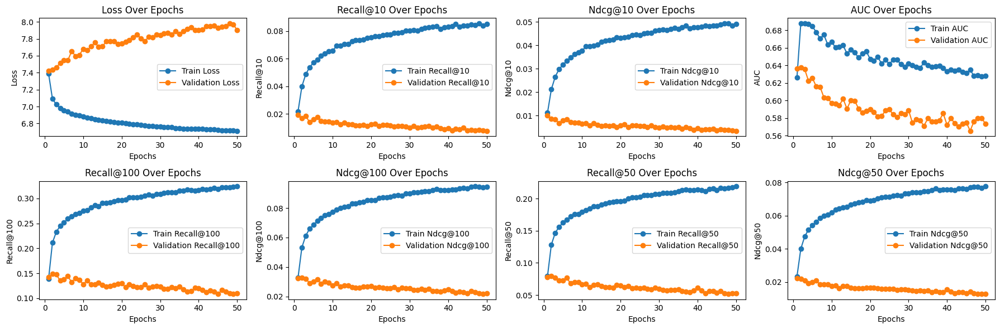

In [ ]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

Plot for model v7


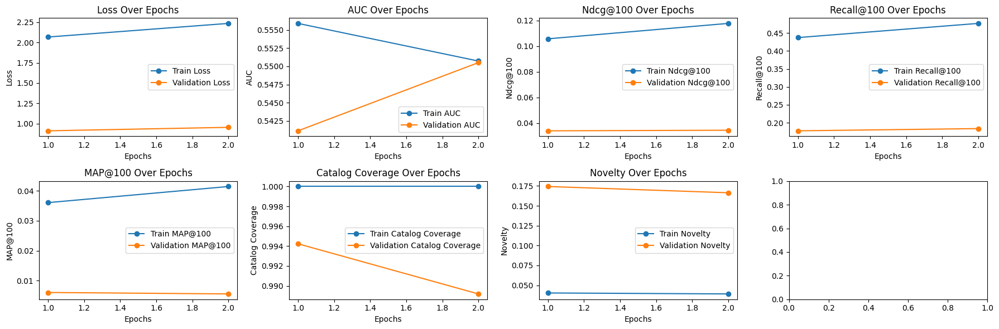

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


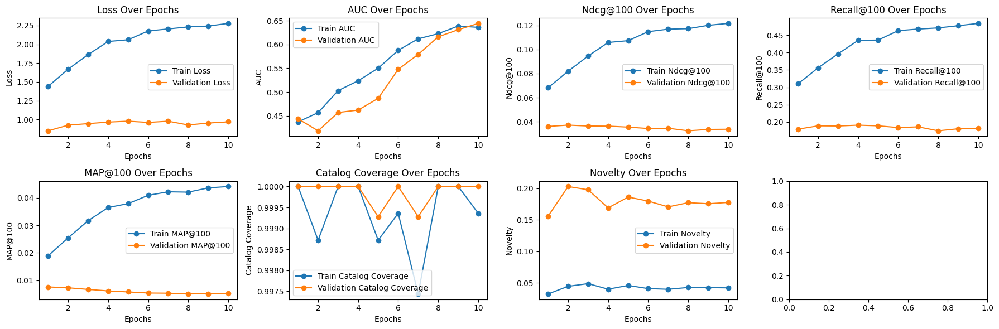

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


### model_v8

In [ ]:
VERSION = 'v8'

_tower_dim = {
    'user':[128, 128],
    'item':[512, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 4 # @param
_validation_freq = 1 # @param
# _loss = 'categorical_crossentropy' # @param
_loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [ ]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

RuntimeError: ignored

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=25, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=25, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [ ]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 43s 821ms/step - loss: 8.4130 - auc: 0.5860 - recall_at_100: 0.0877 - mrr_at_100: 0.0065 - ndcg_at_100: 0.0202 - map_at_100: 0.0065 - precision_at_100: 8.7733e-04 - recall_at_50: 0.0475 - mrr_at_50: 0.0059 - ndcg_at_50: 0.0137 - map_at_50: 0.0059 - precision_at_50: 9.4910e-04 - recall_at_10: 0.0126 - mrr_at_10: 0.0045 - ndcg_at_10: 0.0064 - map_at_10: 0.0045 - precision_at_10: 0.0013 - regularization_loss: 0.0000e+00 - loss_batch: 8.3533 - val_loss: 8.3484 - val_auc: 0.6174 - val_recall_at_100: 0.1341 - val_mrr_at_100: 0.0087 - val_ndcg_at_100: 0.0297 - val_map_at_100: 0.0087 - val_precision_at_100: 0.0013 - val_recall_at_50: 0.0705 - val_mrr_at_50: 0.0078 - val_ndcg_at_50: 0.0195 - val_map_at_50: 0.0078 - val_precision_at_50: 0.0014 - val_recall_at_10: 0.0163 - val_mrr_at_10: 0.0057 - val_ndcg_at_10: 0.0081 - val_map_at_10: 0.0057 - val_precision_at_10: 0.0016 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 7.5169
Epoch 2/50


69/69 [==============================] - 7s 31ms/step - loss: 1.7611 - auc: 0.5545 - recall_at_100: 0.3843 - mrr_at_100: 0.0261 - ndcg_at_100: 0.0875 - map_at_100: 0.0261 - precision_at_100: 0.0038 - recall_at_10: 0.0562 - mrr_at_10: 0.0169 - ndcg_at_10: 0.0259 - map_at_10: 0.0169 - precision_at_10: 0.0056 - regularization_loss: 0.0000e+00 - loss_batch: 1.7820
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.7610623836517334, 'auc': 0.5544601082801819, 'recall_at_100': 0.384561687707901, 'mrr_at_100': 0.027017852291464806, 'ndcg_at_100': 0.08831297606229782, 'map_at_100': 0.027017852291464806, 'precision_at_100': 0.0038456169422715902, 'recall_at_10': 0.05781886726617813, 'mrr_at_10': 0.017816999927163124, 'ndcg_at_10': 0.026987437158823013, 'map_at_10': 0.017816999927163124, 'precision_at_10': 0.00578188756480813, 'regularization_loss': 0.0, 'loss_batch': 2.7765109539031982, 'coverage': 1.0, 'novelty': 0.04947793693268272}
Candidate set rows: 1387


15/15 [==============================] - 3s 24ms/step - loss: 0.7554 - auc: 0.5156 - recall_at_100: 0.1568 - mrr_at_100: 0.0063 - ndcg_at_100: 0.0309 - map_at_100: 0.0063 - precision_at_100: 0.0016 - recall_at_10: 0.0114 - mrr_at_10: 0.0029 - ndcg_at_10: 0.0048 - map_at_10: 0.0029 - precision_at_10: 0.0011 - regularization_loss: 0.0000e+00 - loss_batch: 0.8050
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.7553708553314209, 'auc': 0.5156096816062927, 'recall_at_100': 0.1624983251094818, 'mrr_at_100': 0.0065779308788478374, 'ndcg_at_100': 0.03217475116252899, 'map_at_100': 0.0065779308788478374, 'precision_at_100': 0.0016249831533059478, 'recall_at_10': 0.011568810790777206, 'mrr_at_10': 0.0029295131098479033, 'ndcg_at_10': 0.0049017248675227165, 'map_at_10': 0.0029295131098479033, 'precision_at_10': 0.0011568812187761068, 'regularization_loss': 0.0, 'loss_batch': 1.3243764638900757, 'coverage': 0.9790915645277577, 'novelty': 0.19915522703273494}
35/35 [==========

69/69 [==============================] - 8s 35ms/step - loss: 1.9409 - auc: 0.5632 - recall_at_100: 0.4218 - mrr_at_100: 0.0286 - ndcg_at_100: 0.0959 - map_at_100: 0.0286 - precision_at_100: 0.0042 - recall_at_10: 0.0603 - mrr_at_10: 0.0185 - ndcg_at_10: 0.0280 - map_at_10: 0.0185 - precision_at_10: 0.0060 - regularization_loss: 0.0000e+00 - loss_batch: 1.9611
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9409030675888062, 'auc': 0.5632296204566956, 'recall_at_100': 0.42369163036346436, 'mrr_at_100': 0.02987181954085827, 'ndcg_at_100': 0.09735949337482452, 'map_at_100': 0.02987181954085827, 'precision_at_100': 0.004236915614455938, 'recall_at_10': 0.0626620352268219, 'mrr_at_10': 0.01968521438539028, 'ndcg_at_10': 0.02953094057738781, 'map_at_10': 0.01968521438539028, 'precision_at_10': 0.006266204174607992, 'regularization_loss': 0.0, 'loss_batch': 2.921396493911743, 'coverage': 1.0, 'novelty': 0.053509618112693634}
Candidate set rows: 1387


15/15 [==============================] - 4s 25ms/step - loss: 0.7050 - auc: 0.5081 - recall_at_100: 0.1476 - mrr_at_100: 0.0053 - ndcg_at_100: 0.0284 - map_at_100: 0.0053 - precision_at_100: 0.0015 - recall_at_10: 0.0091 - mrr_at_10: 0.0022 - ndcg_at_10: 0.0037 - map_at_10: 0.0022 - precision_at_10: 9.1276e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.7514
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.7049569487571716, 'auc': 0.5081170201301575, 'recall_at_100': 0.15126387774944305, 'mrr_at_100': 0.006009244825690985, 'ndcg_at_100': 0.029692817479372025, 'map_at_100': 0.006009244825690985, 'precision_at_100': 0.0015126385260373354, 'recall_at_10': 0.010231376625597477, 'mrr_at_10': 0.0027155231218785048, 'ndcg_at_10': 0.004428751301020384, 'map_at_10': 0.0027155231218785048, 'precision_at_10': 0.0010231377091258764, 'regularization_loss': 0.0, 'loss_batch': 1.2371282577514648, 'coverage': 0.9834174477289113, 'novelty': 0.19447308723448134}
35/35 [=======

#### analysis

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

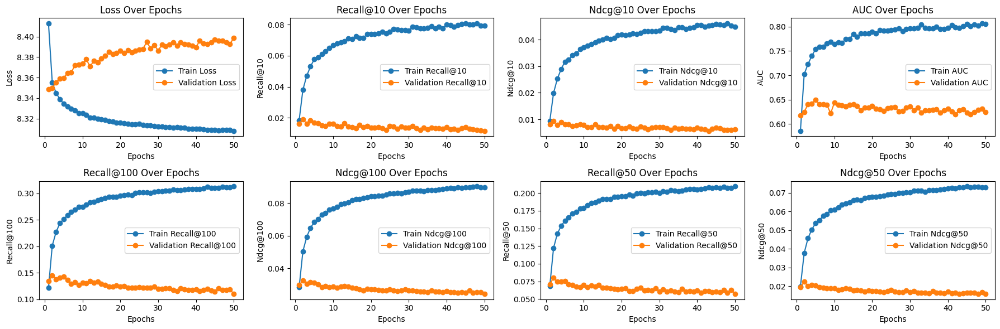

In [ ]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

Plot for model v8


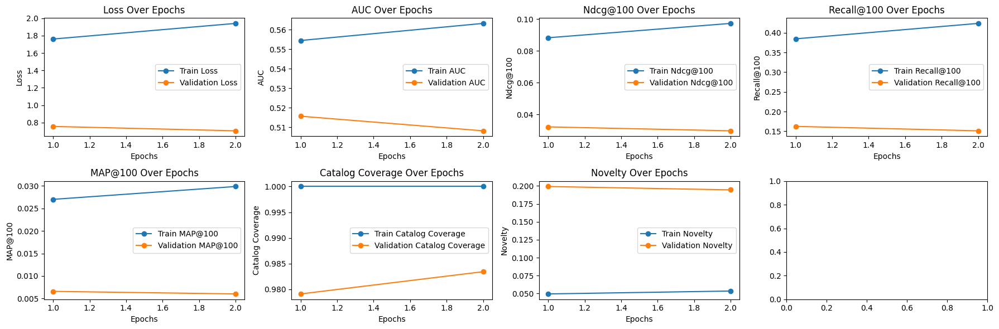

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


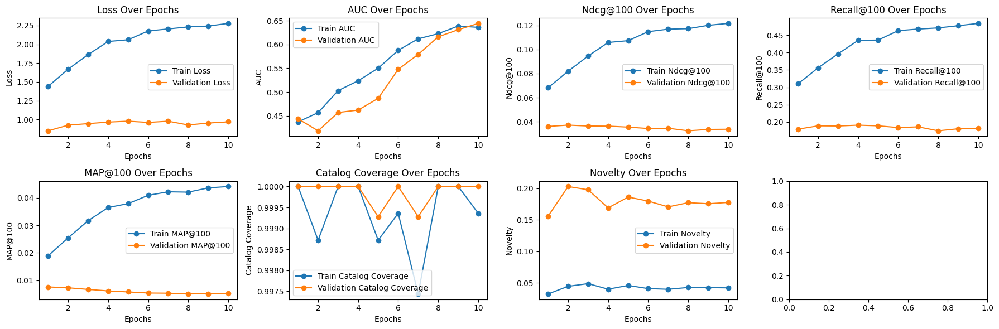

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


### model_v9

In [ ]:
VERSION = 'v9'

_tower_dim = {
    'user':[128, 128],
    'item':[512, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 4 # @param
_validation_freq = 1 # @param
# _loss = 'categorical_crossentropy' # @param
_loss = 'bpr-max' # @param

_logq_sampling_correction = True # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [ ]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=25, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=25, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

[INFO] hacked the logq correction to match item cardinality


#### model

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [ ]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 37s 628ms/step - loss: 9.0814 - auc: 0.5020 - recall_at_100: 0.0516 - mrr_at_100: 0.0032 - ndcg_at_100: 0.0113 - map_at_100: 0.0032 - precision_at_100: 5.1643e-04 - recall_at_50: 0.0259 - mrr_at_50: 0.0029 - ndcg_at_50: 0.0071 - map_at_50: 0.0029 - precision_at_50: 5.1811e-04 - recall_at_10: 0.0056 - mrr_at_10: 0.0021 - ndcg_at_10: 0.0029 - map_at_10: 0.0021 - precision_at_10: 5.6359e-04 - regularization_loss: 0.0000e+00 - loss_batch: 8.9959 - val_loss: 9.1174 - val_auc: 0.4918 - val_recall_at_100: 0.0550 - val_mrr_at_100: 0.0047 - val_ndcg_at_100: 0.0130 - val_map_at_100: 0.0047 - val_precision_at_100: 5.4969e-04 - val_recall_at_50: 0.0280 - val_mrr_at_50: 0.0043 - val_ndcg_at_50: 0.0087 - val_map_at_50: 0.0043 - val_precision_at_50: 5.6039e-04 - val_recall_at_10: 0.0066 - val_mrr_at_10: 0.0035 - val_ndcg_at_10: 0.0042 - val_map_at_10: 0.0035 - val_precision_at_10: 6.6203e-04 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 8.

69/69 [==============================] - 5s 20ms/step - loss: 1.9492 - auc: 0.5248 - recall_at_100: 0.4284 - mrr_at_100: 0.0354 - ndcg_at_100: 0.1040 - map_at_100: 0.0354 - precision_at_100: 0.0043 - recall_at_10: 0.0784 - mrr_at_10: 0.0251 - ndcg_at_10: 0.0373 - map_at_10: 0.0251 - precision_at_10: 0.0078 - regularization_loss: 0.0000e+00 - loss_batch: 1.9541
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9492326974868774, 'auc': 0.5247736573219299, 'recall_at_100': 0.43067148327827454, 'mrr_at_100': 0.0357171855866909, 'ndcg_at_100': 0.1046295017004013, 'map_at_100': 0.0357171855866909, 'precision_at_100': 0.00430671451613307, 'recall_at_10': 0.0780177190899849, 'mrr_at_10': 0.025162992998957634, 'ndcg_at_10': 0.037303682416677475, 'map_at_10': 0.025162992998957634, 'precision_at_10': 0.007801772095263004, 'regularization_loss': 0.0, 'loss_batch': 2.1835668087005615, 'coverage': 0.185137732222934, 'novelty': 0.0022234587870242437}
Candidate set rows: 1387


15/15 [==============================] - 3s 25ms/step - loss: 1.0594 - auc: 0.5114 - recall_at_100: 0.2364 - mrr_at_100: 0.0121 - ndcg_at_100: 0.0497 - map_at_100: 0.0121 - precision_at_100: 0.0024 - recall_at_10: 0.0229 - mrr_at_10: 0.0063 - ndcg_at_10: 0.0101 - map_at_10: 0.0063 - precision_at_10: 0.0023 - regularization_loss: 0.0000e+00 - loss_batch: 1.0026
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 1.059383749961853, 'auc': 0.5113555192947388, 'recall_at_100': 0.2288350909948349, 'mrr_at_100': 0.011200444772839546, 'ndcg_at_100': 0.04760928452014923, 'map_at_100': 0.011200444772839546, 'precision_at_100': 0.002288350835442543, 'recall_at_10': 0.020797111093997955, 'mrr_at_10': 0.0056343949399888515, 'ndcg_at_10': 0.00904357060790062, 'map_at_10': 0.0056343949399888515, 'precision_at_10': 0.0020797112956643105, 'regularization_loss': 0.0, 'loss_batch': 0.40871262550354004, 'coverage': 0.2083633741888969, 'novelty': 0.035107967237527925}
35/35 [==============

69/69 [==============================] - 6s 21ms/step - loss: 2.0890 - auc: 0.5392 - recall_at_100: 0.4589 - mrr_at_100: 0.0387 - ndcg_at_100: 0.1121 - map_at_100: 0.0387 - precision_at_100: 0.0046 - recall_at_10: 0.0851 - mrr_at_10: 0.0275 - ndcg_at_10: 0.0408 - map_at_10: 0.0275 - precision_at_10: 0.0085 - regularization_loss: 0.0000e+00 - loss_batch: 2.0977
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.088958501815796, 'auc': 0.5392341613769531, 'recall_at_100': 0.46209511160850525, 'mrr_at_100': 0.03903750702738762, 'ndcg_at_100': 0.11299318075180054, 'map_at_100': 0.03903750702738762, 'precision_at_100': 0.004620951134711504, 'recall_at_10': 0.08612290024757385, 'mrr_at_10': 0.0277715977281332, 'ndcg_at_10': 0.041178327053785324, 'map_at_10': 0.0277715977281332, 'precision_at_10': 0.008612290024757385, 'regularization_loss': 0.0, 'loss_batch': 2.514190196990967, 'coverage': 0.2530429212043562, 'novelty': 0.0022365262928212963}
Candidate set rows: 1387


15/15 [==============================] - 5s 23ms/step - loss: 1.0425 - auc: 0.5131 - recall_at_100: 0.2308 - mrr_at_100: 0.0117 - ndcg_at_100: 0.0484 - map_at_100: 0.0117 - precision_at_100: 0.0023 - recall_at_10: 0.0207 - mrr_at_10: 0.0061 - ndcg_at_10: 0.0095 - map_at_10: 0.0061 - precision_at_10: 0.0021 - regularization_loss: 0.0000e+00 - loss_batch: 0.9956
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 1.0424854755401611, 'auc': 0.513094425201416, 'recall_at_100': 0.22462217509746552, 'mrr_at_100': 0.0110686756670475, 'ndcg_at_100': 0.046778373420238495, 'map_at_100': 0.0110686756670475, 'precision_at_100': 0.0022462215274572372, 'recall_at_10': 0.020596496760845184, 'mrr_at_10': 0.005656234920024872, 'ndcg_at_10': 0.009045102633535862, 'map_at_10': 0.005656234920024872, 'precision_at_10': 0.0020596496760845184, 'regularization_loss': 0.0, 'loss_batch': 0.5053537487983704, 'coverage': 0.28478731074260993, 'novelty': 0.031258286926544684}
35/35 [================

#### analysis

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

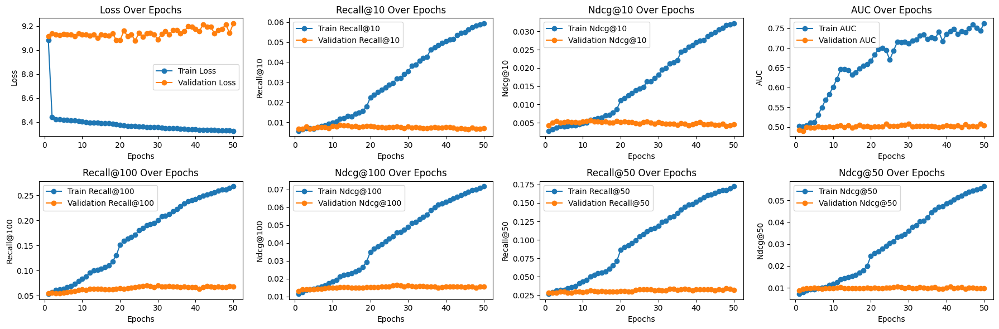

In [ ]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

Plot for model v9


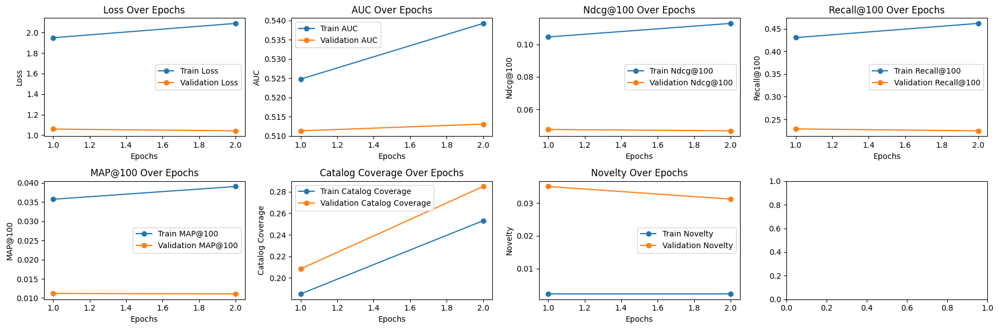

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


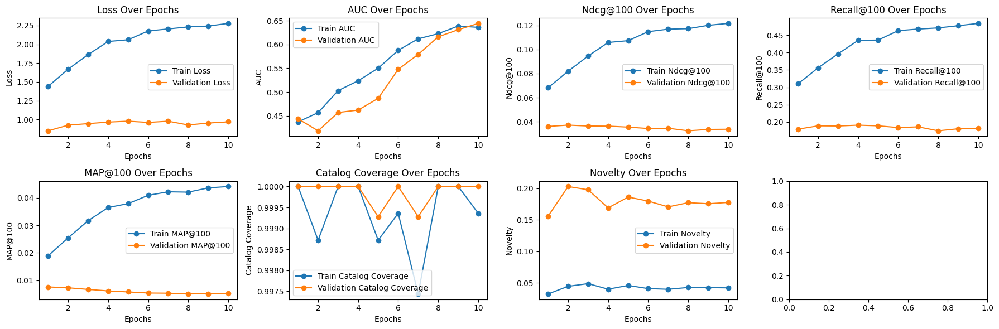

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


### model_v10

In [ ]:
VERSION = 'v10'

_tower_dim = {
    'user':[128, 128],
    'item':[512, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 4 # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = True # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [ ]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=25, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=25, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

[INFO] hacked the logq correction to match item cardinality


#### model

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [ ]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 36s 627ms/step - loss: 7.7570 - auc: 0.5085 - recall_at_100: 0.0619 - mrr_at_100: 0.0043 - ndcg_at_100: 0.0139 - map_at_100: 0.0043 - precision_at_100: 6.1872e-04 - recall_at_50: 0.0326 - mrr_at_50: 0.0039 - ndcg_at_50: 0.0092 - map_at_50: 0.0039 - precision_at_50: 6.5114e-04 - recall_at_10: 0.0075 - mrr_at_10: 0.0029 - ndcg_at_10: 0.0040 - map_at_10: 0.0029 - precision_at_10: 7.5251e-04 - regularization_loss: 0.0000e+00 - loss_batch: 7.6737 - val_loss: 8.0024 - val_auc: 0.5478 - val_recall_at_100: 0.0759 - val_mrr_at_100: 0.0063 - val_ndcg_at_100: 0.0178 - val_map_at_100: 0.0063 - val_precision_at_100: 7.5899e-04 - val_recall_at_50: 0.0395 - val_mrr_at_50: 0.0058 - val_ndcg_at_50: 0.0119 - val_map_at_50: 0.0058 - val_precision_at_50: 7.9042e-04 - val_recall_at_10: 0.0082 - val_mrr_at_10: 0.0045 - val_ndcg_at_10: 0.0053 - val_map_at_10: 0.0045 - val_precision_at_10: 8.2252e-04 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 7.

69/69 [==============================] - 8s 20ms/step - loss: 2.5961 - auc: 0.5238 - recall_at_100: 0.5709 - mrr_at_100: 0.0458 - ndcg_at_100: 0.1378 - map_at_100: 0.0458 - precision_at_100: 0.0057 - recall_at_10: 0.1044 - mrr_at_10: 0.0315 - ndcg_at_10: 0.0482 - map_at_10: 0.0315 - precision_at_10: 0.0104 - regularization_loss: 0.0000e+00 - loss_batch: 2.6125
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.596132516860962, 'auc': 0.5238280296325684, 'recall_at_100': 0.5771345496177673, 'mrr_at_100': 0.0471796840429306, 'ndcg_at_100': 0.14002719521522522, 'map_at_100': 0.0471796840429306, 'precision_at_100': 0.00577134545892477, 'recall_at_10': 0.10596564412117004, 'mrr_at_10': 0.032745301723480225, 'ndcg_at_10': 0.049524981528520584, 'map_at_10': 0.032745301723480225, 'precision_at_10': 0.010596564039587975, 'regularization_loss': 0.0, 'loss_batch': 3.3894407749176025, 'coverage': 0.8782831518257527, 'novelty': 0.0046393553116436505}
Candidate set rows: 1387


15/15 [==============================] - 5s 25ms/step - loss: 1.0673 - auc: 0.5342 - recall_at_100: 0.2192 - mrr_at_100: 0.0083 - ndcg_at_100: 0.0429 - map_at_100: 0.0083 - precision_at_100: 0.0022 - recall_at_10: 0.0147 - mrr_at_10: 0.0033 - ndcg_at_10: 0.0059 - map_at_10: 0.0033 - precision_at_10: 0.0015 - regularization_loss: 0.0000e+00 - loss_batch: 1.0715
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 1.0672738552093506, 'auc': 0.5341693162918091, 'recall_at_100': 0.21733315289020538, 'mrr_at_100': 0.008706647902727127, 'ndcg_at_100': 0.0429840125143528, 'map_at_100': 0.008706647902727127, 'precision_at_100': 0.002173331566154957, 'recall_at_10': 0.015046141110360622, 'mrr_at_10': 0.0037532823625952005, 'ndcg_at_10': 0.006309220101684332, 'map_at_10': 0.0037532823625952005, 'precision_at_10': 0.0015046141343191266, 'regularization_loss': 0.0, 'loss_batch': 1.1153556108474731, 'coverage': 0.8911319394376351, 'novelty': 0.04357670979667283}
35/35 [==============

69/69 [==============================] - 6s 21ms/step - loss: 2.6572 - auc: 0.5290 - recall_at_100: 0.5899 - mrr_at_100: 0.0475 - ndcg_at_100: 0.1426 - map_at_100: 0.0475 - precision_at_100: 0.0059 - recall_at_10: 0.1075 - mrr_at_10: 0.0326 - ndcg_at_10: 0.0497 - map_at_10: 0.0326 - precision_at_10: 0.0107 - regularization_loss: 0.0000e+00 - loss_batch: 2.6735
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.6572012901306152, 'auc': 0.5289895534515381, 'recall_at_100': 0.5918492078781128, 'mrr_at_100': 0.04868999868631363, 'ndcg_at_100': 0.14400939643383026, 'map_at_100': 0.04868999868631363, 'precision_at_100': 0.005918491631746292, 'recall_at_10': 0.10945557057857513, 'mrr_at_10': 0.03376121073961258, 'ndcg_at_10': 0.05110403895378113, 'map_at_10': 0.03376121073961258, 'precision_at_10': 0.010945558547973633, 'regularization_loss': 0.0, 'loss_batch': 3.4456028938293457, 'coverage': 0.931454196028187, 'novelty': 0.005903195112179487}
Candidate set rows: 1387


15/15 [==============================] - 6s 24ms/step - loss: 1.0319 - auc: 0.5255 - recall_at_100: 0.2055 - mrr_at_100: 0.0072 - ndcg_at_100: 0.0395 - map_at_100: 0.0072 - precision_at_100: 0.0021 - recall_at_10: 0.0115 - mrr_at_10: 0.0025 - ndcg_at_10: 0.0045 - map_at_10: 0.0025 - precision_at_10: 0.0011 - regularization_loss: 0.0000e+00 - loss_batch: 1.0255
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 1.0318986177444458, 'auc': 0.5255224108695984, 'recall_at_100': 0.20817172527313232, 'mrr_at_100': 0.0074548604898154736, 'ndcg_at_100': 0.04029380530118942, 'map_at_100': 0.0074548604898154736, 'precision_at_100': 0.0020817171316593885, 'recall_at_10': 0.012103784829378128, 'mrr_at_10': 0.0027157356962561607, 'ndcg_at_10': 0.004843749105930328, 'map_at_10': 0.0027157356962561607, 'precision_at_10': 0.0012103784829378128, 'regularization_loss': 0.0, 'loss_batch': 0.9582186937332153, 'coverage': 0.9300648882480173, 'novelty': 0.051546955285886084}
35/35 [=========

#### analysis

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

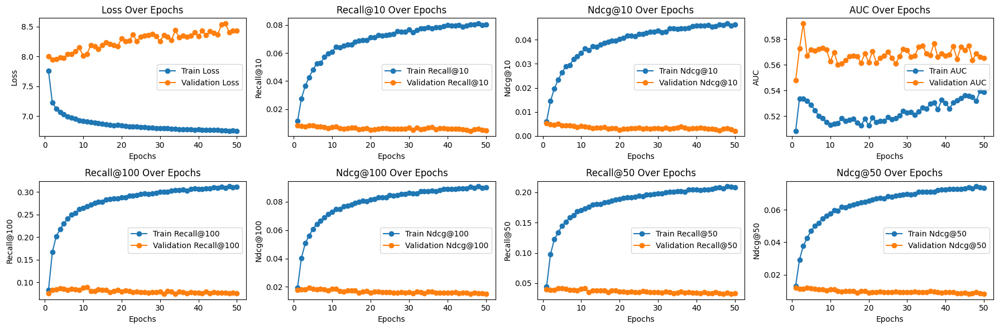

In [ ]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

Plot for model v10


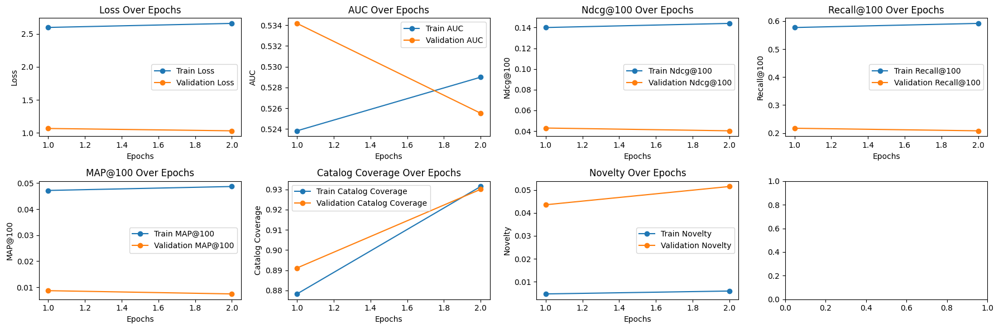

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


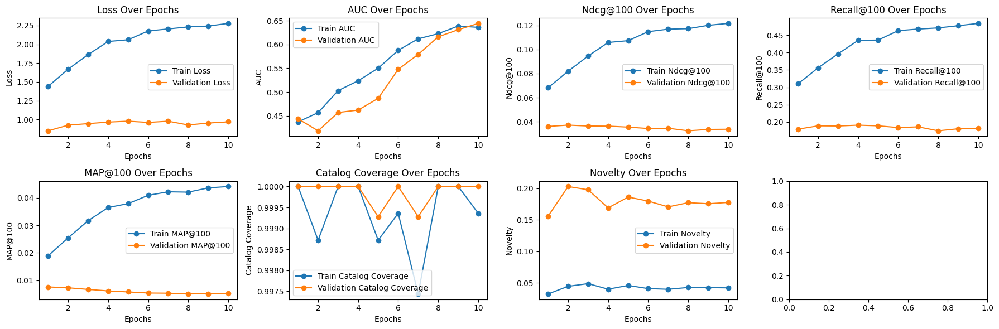

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


### model_v11

In [ ]:
VERSION = 'v11'

_tower_dim = {
    'user':[128, 128],
    'item':[512, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 4 # @param
_validation_freq = 1 # @param
# _loss = 'categorical_crossentropy' # @param
_loss = 'bpr-max' # @param

_logq_sampling_correction = True # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [ ]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=25, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=25, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

[INFO] hacked the logq correction to match item cardinality


#### model

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [ ]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 36s 609ms/step - loss: 9.0111 - auc: 0.5003 - recall_at_100: 0.0507 - mrr_at_100: 0.0036 - ndcg_at_100: 0.0114 - map_at_100: 0.0036 - precision_at_100: 5.0684e-04 - recall_at_50: 0.0262 - mrr_at_50: 0.0033 - ndcg_at_50: 0.0075 - map_at_50: 0.0033 - precision_at_50: 5.2374e-04 - recall_at_10: 0.0059 - mrr_at_10: 0.0025 - ndcg_at_10: 0.0032 - map_at_10: 0.0025 - precision_at_10: 5.8562e-04 - regularization_loss: 0.0000e+00 - loss_batch: 8.9265 - val_loss: 8.9683 - val_auc: 0.4855 - val_recall_at_100: 0.0560 - val_mrr_at_100: 0.0060 - val_ndcg_at_100: 0.0142 - val_map_at_100: 0.0060 - val_precision_at_100: 5.6039e-04 - val_recall_at_50: 0.0284 - val_mrr_at_50: 0.0056 - val_ndcg_at_50: 0.0097 - val_map_at_50: 0.0056 - val_precision_at_50: 5.6707e-04 - val_recall_at_10: 0.0069 - val_mrr_at_10: 0.0047 - val_ndcg_at_10: 0.0052 - val_map_at_10: 0.0047 - val_precision_at_10: 6.8878e-04 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 8.

69/69 [==============================] - 8s 32ms/step - loss: 2.1350 - auc: 0.5477 - recall_at_100: 0.4701 - mrr_at_100: 0.0399 - ndcg_at_100: 0.1153 - map_at_100: 0.0399 - precision_at_100: 0.0047 - recall_at_10: 0.0881 - mrr_at_10: 0.0283 - ndcg_at_10: 0.0420 - map_at_10: 0.0283 - precision_at_10: 0.0088 - regularization_loss: 0.0000e+00 - loss_batch: 2.1456
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.135047435760498, 'auc': 0.5476733446121216, 'recall_at_100': 0.47326287627220154, 'mrr_at_100': 0.04023982211947441, 'ndcg_at_100': 0.11612475663423538, 'map_at_100': 0.04023982211947441, 'precision_at_100': 0.00473262881860137, 'recall_at_10': 0.08865844458341599, 'mrr_at_10': 0.028493298217654228, 'ndcg_at_10': 0.04231632128357887, 'map_at_10': 0.028493298217654228, 'precision_at_10': 0.008865844458341599, 'regularization_loss': 0.0, 'loss_batch': 2.644977569580078, 'coverage': 0.28315182575272263, 'novelty': 0.0022247807069281983}
Candidate set rows: 1387


15/15 [==============================] - 3s 24ms/step - loss: 1.0310 - auc: 0.5038 - recall_at_100: 0.2274 - mrr_at_100: 0.0105 - ndcg_at_100: 0.0467 - map_at_100: 0.0105 - precision_at_100: 0.0023 - recall_at_10: 0.0184 - mrr_at_10: 0.0049 - ndcg_at_10: 0.0079 - map_at_10: 0.0049 - precision_at_10: 0.0018 - regularization_loss: 0.0000e+00 - loss_batch: 0.9804
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 1.031038522720337, 'auc': 0.5038081407546997, 'recall_at_100': 0.2220141738653183, 'mrr_at_100': 0.010176127776503563, 'ndcg_at_100': 0.04551050439476967, 'map_at_100': 0.010176127776503563, 'precision_at_100': 0.0022201414685696363, 'recall_at_10': 0.017854753881692886, 'mrr_at_10': 0.004717695992439985, 'ndcg_at_10': 0.007694920990616083, 'map_at_10': 0.004717695992439985, 'precision_at_10': 0.001785475411452353, 'regularization_loss': 0.0, 'loss_batch': 0.4508283734321594, 'coverage': 0.3186733958183129, 'novelty': 0.03156379702771456}
35/35 [=================

69/69 [==============================] - 6s 23ms/step - loss: 2.2262 - auc: 0.5453 - recall_at_100: 0.4915 - mrr_at_100: 0.0410 - ndcg_at_100: 0.1198 - map_at_100: 0.0410 - precision_at_100: 0.0049 - recall_at_10: 0.0904 - mrr_at_10: 0.0288 - ndcg_at_10: 0.0430 - map_at_10: 0.0288 - precision_at_10: 0.0090 - regularization_loss: 0.0000e+00 - loss_batch: 2.2381
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.2262070178985596, 'auc': 0.5452719926834106, 'recall_at_100': 0.493404746055603, 'mrr_at_100': 0.041752658784389496, 'ndcg_at_100': 0.1208329126238823, 'map_at_100': 0.041752658784389496, 'precision_at_100': 0.004934047814458609, 'recall_at_10': 0.09174951910972595, 'mrr_at_10': 0.029545404016971588, 'ndcg_at_10': 0.043832000344991684, 'map_at_10': 0.029545404016971588, 'precision_at_10': 0.00917495135217905, 'regularization_loss': 0.0, 'loss_batch': 2.804330348968506, 'coverage': 0.31326073030108903, 'novelty': 0.0022434326660925254}
Candidate set rows: 1387


15/15 [==============================] - 3s 24ms/step - loss: 1.0159 - auc: 0.4989 - recall_at_100: 0.2168 - mrr_at_100: 0.0093 - ndcg_at_100: 0.0438 - map_at_100: 0.0093 - precision_at_100: 0.0022 - recall_at_10: 0.0175 - mrr_at_10: 0.0042 - ndcg_at_10: 0.0072 - map_at_10: 0.0042 - precision_at_10: 0.0018 - regularization_loss: 0.0000e+00 - loss_batch: 0.9701
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 1.0158828496932983, 'auc': 0.49892884492874146, 'recall_at_100': 0.2178012579679489, 'mrr_at_100': 0.009433066472411156, 'ndcg_at_100': 0.04403485357761383, 'map_at_100': 0.009433066472411156, 'precision_at_100': 0.002178012626245618, 'recall_at_10': 0.017052292823791504, 'mrr_at_10': 0.004205781500786543, 'ndcg_at_10': 0.007125213276594877, 'map_at_10': 0.004205781500786543, 'precision_at_10': 0.0017052293987944722, 'regularization_loss': 0.0, 'loss_batch': 0.49092191457748413, 'coverage': 0.35255948089401584, 'novelty': 0.03251051506584844}
35/35 [=============

#### analysis

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

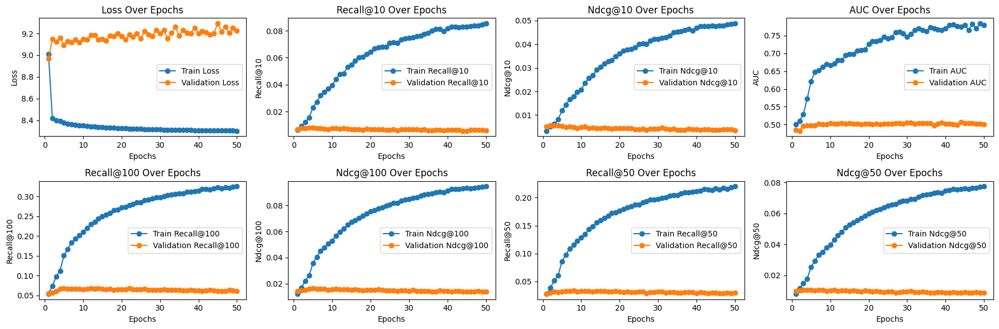

In [ ]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

Plot for model v11


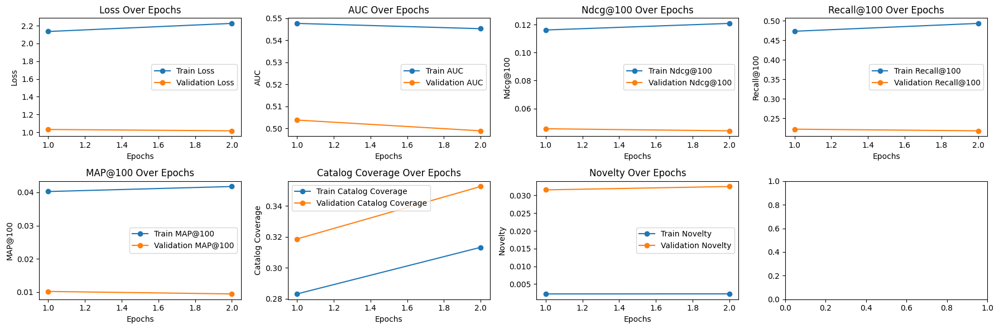

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


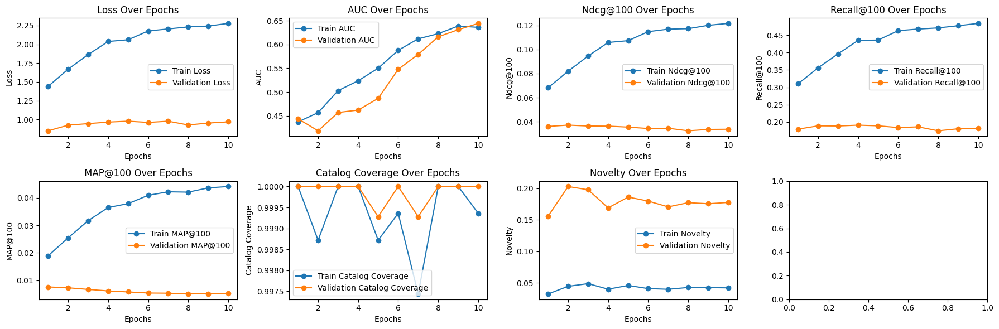

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


### model_v100

In [ ]:
VERSION = 'v100'

_tower_dim = {
    'user':[128, 128],
    'item':[512, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 2 # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [ ]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [ ]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 61s 1s/step - loss: 7.5468 - auc: 0.5267 - recall_at_100: 0.0682 - mrr_at_100: 0.0052 - ndcg_at_100: 0.0157 - map_at_100: 0.0052 - precision_at_100: 6.8231e-04 - recall_at_50: 0.0362 - mrr_at_50: 0.0047 - ndcg_at_50: 0.0106 - map_at_50: 0.0047 - precision_at_50: 7.2455e-04 - recall_at_10: 0.0092 - mrr_at_10: 0.0037 - ndcg_at_10: 0.0049 - map_at_10: 0.0037 - precision_at_10: 9.2399e-04 - regularization_loss: 0.0000e+00 - loss_batch: 7.4783 - val_loss: 7.4266 - val_auc: 0.5474 - val_recall_at_100: 0.1155 - val_mrr_at_100: 0.0081 - val_ndcg_at_100: 0.0261 - val_map_at_100: 0.0081 - val_precision_at_100: 0.0012 - val_recall_at_50: 0.0615 - val_mrr_at_50: 0.0074 - val_ndcg_at_50: 0.0174 - val_map_at_50: 0.0074 - val_precision_at_50: 0.0012 - val_recall_at_10: 0.0140 - val_mrr_at_10: 0.0056 - val_ndcg_at_10: 0.0075 - val_map_at_10: 0.0056 - val_precision_at_10: 0.0014 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.2624
Epoch 2/50

69/69 [==============================] - 6s 24ms/step - loss: 1.5134 - auc: 0.5879 - recall_at_100: 0.3297 - mrr_at_100: 0.0226 - ndcg_at_100: 0.0752 - map_at_100: 0.0226 - precision_at_100: 0.0033 - recall_at_10: 0.0486 - mrr_at_10: 0.0147 - ndcg_at_10: 0.0225 - map_at_10: 0.0147 - precision_at_10: 0.0049 - regularization_loss: 0.0000e+00 - loss_batch: 1.5231
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.5133696794509888, 'auc': 0.5879124402999878, 'recall_at_100': 0.32793936133384705, 'mrr_at_100': 0.022766361013054848, 'ndcg_at_100': 0.0750674158334732, 'map_at_100': 0.022766361013054848, 'precision_at_100': 0.003279394004493952, 'recall_at_10': 0.04854562506079674, 'mrr_at_10': 0.014875572174787521, 'ndcg_at_10': 0.02259650081396103, 'map_at_10': 0.014875572174787521, 'precision_at_10': 0.004854562226682901, 'regularization_loss': 0.0, 'loss_batch': 1.9849891662597656, 'coverage': 0.9993593850096092, 'novelty': 0.030143204193837102}
Candidate set rows: 1387


15/15 [==============================] - 5s 34ms/step - loss: 0.9464 - auc: 0.6021 - recall_at_100: 0.1923 - mrr_at_100: 0.0086 - ndcg_at_100: 0.0390 - map_at_100: 0.0086 - precision_at_100: 0.0019 - recall_at_10: 0.0173 - mrr_at_10: 0.0042 - ndcg_at_10: 0.0072 - map_at_10: 0.0042 - precision_at_10: 0.0017 - regularization_loss: 0.0000e+00 - loss_batch: 0.9959
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.946355402469635, 'auc': 0.60207200050354, 'recall_at_100': 0.19860906898975372, 'mrr_at_100': 0.009000197984278202, 'ndcg_at_100': 0.04041510075330734, 'map_at_100': 0.009000197984278202, 'precision_at_100': 0.001986090559512377, 'recall_at_10': 0.017787883058190346, 'mrr_at_10': 0.004471118561923504, 'ndcg_at_10': 0.0074825952760875225, 'map_at_10': 0.004471118561923504, 'precision_at_10': 0.0017787881661206484, 'regularization_loss': 0.0, 'loss_batch': 1.5141017436981201, 'coverage': 0.9848594087959625, 'novelty': 0.14447678872376282}
35/35 [=================

69/69 [==============================] - 6s 27ms/step - loss: 1.7147 - auc: 0.5425 - recall_at_100: 0.3669 - mrr_at_100: 0.0280 - ndcg_at_100: 0.0865 - map_at_100: 0.0280 - precision_at_100: 0.0037 - recall_at_10: 0.0609 - mrr_at_10: 0.0192 - ndcg_at_10: 0.0287 - map_at_10: 0.0192 - precision_at_10: 0.0061 - regularization_loss: 0.0000e+00 - loss_batch: 1.7254
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.7146912813186646, 'auc': 0.5425147414207458, 'recall_at_100': 0.3693626821041107, 'mrr_at_100': 0.02864406257867813, 'ndcg_at_100': 0.08738398551940918, 'map_at_100': 0.02864406257867813, 'precision_at_100': 0.0036936262622475624, 'recall_at_10': 0.06095267832279205, 'mrr_at_10': 0.01982223615050316, 'ndcg_at_10': 0.0292622409760952, 'map_at_10': 0.01982223615050316, 'precision_at_10': 0.006095267366617918, 'regularization_loss': 0.0, 'loss_batch': 2.232564926147461, 'coverage': 0.9993593850096092, 'novelty': 0.03525233644859813}
Candidate set rows: 1387


15/15 [==============================] - 5s 35ms/step - loss: 0.9286 - auc: 0.5499 - recall_at_100: 0.1852 - mrr_at_100: 0.0067 - ndcg_at_100: 0.0359 - map_at_100: 0.0067 - precision_at_100: 0.0019 - recall_at_10: 0.0110 - mrr_at_10: 0.0024 - ndcg_at_10: 0.0044 - map_at_10: 0.0024 - precision_at_10: 0.0011 - regularization_loss: 0.0000e+00 - loss_batch: 0.9783
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9285807609558105, 'auc': 0.5499138236045837, 'recall_at_100': 0.18891265988349915, 'mrr_at_100': 0.006929292343556881, 'ndcg_at_100': 0.036706335842609406, 'map_at_100': 0.006929292343556881, 'precision_at_100': 0.0018891263753175735, 'recall_at_10': 0.010498863644897938, 'mrr_at_10': 0.002549033844843507, 'ndcg_at_10': 0.004352074582129717, 'map_at_10': 0.002549033844843507, 'precision_at_10': 0.0010498863412067294, 'regularization_loss': 0.0, 'loss_batch': 1.4985766410827637, 'coverage': 0.9798125450612833, 'novelty': 0.16391447940205112}
35/35 [=============

69/69 [==============================] - 8s 25ms/step - loss: 1.9062 - auc: 0.5220 - recall_at_100: 0.4029 - mrr_at_100: 0.0317 - ndcg_at_100: 0.0960 - map_at_100: 0.0317 - precision_at_100: 0.0040 - recall_at_10: 0.0673 - mrr_at_10: 0.0219 - ndcg_at_10: 0.0323 - map_at_10: 0.0219 - precision_at_10: 0.0067 - regularization_loss: 0.0000e+00 - loss_batch: 1.9183
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9062477350234985, 'auc': 0.5220192670822144, 'recall_at_100': 0.4072391092777252, 'mrr_at_100': 0.03285052999854088, 'ndcg_at_100': 0.0977744460105896, 'map_at_100': 0.03285052999854088, 'precision_at_100': 0.0040723904967308044, 'recall_at_10': 0.07046807557344437, 'mrr_at_10': 0.022999534383416176, 'ndcg_at_10': 0.03390846773982048, 'map_at_10': 0.022999534383416176, 'precision_at_10': 0.007046807091683149, 'regularization_loss': 0.0, 'loss_batch': 2.490760326385498, 'coverage': 0.9993593850096092, 'novelty': 0.039304768256085365}
Candidate set rows: 1387


15/15 [==============================] - 4s 24ms/step - loss: 0.9621 - auc: 0.5298 - recall_at_100: 0.1855 - mrr_at_100: 0.0063 - ndcg_at_100: 0.0355 - map_at_100: 0.0063 - precision_at_100: 0.0019 - recall_at_10: 0.0110 - mrr_at_10: 0.0022 - ndcg_at_10: 0.0041 - map_at_10: 0.0022 - precision_at_10: 0.0011 - regularization_loss: 0.0000e+00 - loss_batch: 1.0130
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9620679616928101, 'auc': 0.5298426151275635, 'recall_at_100': 0.1919887661933899, 'mrr_at_100': 0.006586284842342138, 'ndcg_at_100': 0.036867473274469376, 'map_at_100': 0.006586284842342138, 'precision_at_100': 0.0019198877271264791, 'recall_at_10': 0.010900093242526054, 'mrr_at_10': 0.0022492522839456797, 'ndcg_at_10': 0.004194329492747784, 'map_at_10': 0.0022492522839456797, 'precision_at_10': 0.0010900094639509916, 'regularization_loss': 0.0, 'loss_batch': 1.5453588962554932, 'coverage': 0.9790915645277577, 'novelty': 0.17580164056674125}
35/35 [============

69/69 [==============================] - 6s 21ms/step - loss: 2.0325 - auc: 0.5223 - recall_at_100: 0.4367 - mrr_at_100: 0.0345 - ndcg_at_100: 0.1043 - map_at_100: 0.0345 - precision_at_100: 0.0044 - recall_at_10: 0.0763 - mrr_at_10: 0.0239 - ndcg_at_10: 0.0359 - map_at_10: 0.0239 - precision_at_10: 0.0076 - regularization_loss: 0.0000e+00 - loss_batch: 2.0442
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.0324995517730713, 'auc': 0.5223275423049927, 'recall_at_100': 0.4324093461036682, 'mrr_at_100': 0.03551892936229706, 'ndcg_at_100': 0.10447586327791214, 'map_at_100': 0.03551892936229706, 'precision_at_100': 0.004324093461036682, 'recall_at_10': 0.07696361839771271, 'mrr_at_10': 0.025075729936361313, 'ndcg_at_10': 0.03699760511517525, 'map_at_10': 0.025075729936361313, 'precision_at_10': 0.007696361746639013, 'regularization_loss': 0.0, 'loss_batch': 2.5987024307250977, 'coverage': 0.9987187700192185, 'novelty': 0.03878104951472281}
Candidate set rows: 1387


15/15 [==============================] - 4s 35ms/step - loss: 0.9950 - auc: 0.5188 - recall_at_100: 0.1918 - mrr_at_100: 0.0062 - ndcg_at_100: 0.0363 - map_at_100: 0.0062 - precision_at_100: 0.0019 - recall_at_10: 0.0092 - mrr_at_10: 0.0019 - ndcg_at_10: 0.0035 - map_at_10: 0.0019 - precision_at_10: 9.1976e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0425
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9950061440467834, 'auc': 0.5188065767288208, 'recall_at_100': 0.1953992247581482, 'mrr_at_100': 0.006540342234075069, 'ndcg_at_100': 0.03732062503695488, 'map_at_100': 0.006540342234075069, 'precision_at_100': 0.0019539922941476107, 'recall_at_10': 0.010231376625597477, 'mrr_at_10': 0.002096721203997731, 'ndcg_at_10': 0.003925951197743416, 'map_at_10': 0.002096721203997731, 'precision_at_10': 0.0010231377091258764, 'regularization_loss': 0.0, 'loss_batch': 1.5393248796463013, 'coverage': 0.9834174477289113, 'novelty': 0.17108127721335267}
35/35 [===========

69/69 [==============================] - 5s 20ms/step - loss: 2.0620 - auc: 0.5196 - recall_at_100: 0.4401 - mrr_at_100: 0.0373 - ndcg_at_100: 0.1076 - map_at_100: 0.0373 - precision_at_100: 0.0044 - recall_at_10: 0.0820 - mrr_at_10: 0.0266 - ndcg_at_10: 0.0393 - map_at_10: 0.0266 - precision_at_10: 0.0082 - regularization_loss: 0.0000e+00 - loss_batch: 2.0746
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.061952590942383, 'auc': 0.519604504108429, 'recall_at_100': 0.4409845769405365, 'mrr_at_100': 0.037444401532411575, 'ndcg_at_100': 0.10789398103952408, 'map_at_100': 0.037444401532411575, 'precision_at_100': 0.00440984545275569, 'recall_at_10': 0.08234807848930359, 'mrr_at_10': 0.02672131545841694, 'ndcg_at_10': 0.03949163109064102, 'map_at_10': 0.02672131545841694, 'precision_at_10': 0.008234808221459389, 'regularization_loss': 0.0, 'loss_batch': 2.677056312561035, 'coverage': 0.9987187700192185, 'novelty': 0.039131878164163005}
Candidate set rows: 1387


15/15 [==============================] - 5s 34ms/step - loss: 1.0139 - auc: 0.5391 - recall_at_100: 0.1984 - mrr_at_100: 0.0067 - ndcg_at_100: 0.0378 - map_at_100: 0.0067 - precision_at_100: 0.0020 - recall_at_10: 0.0099 - mrr_at_10: 0.0023 - ndcg_at_10: 0.0040 - map_at_10: 0.0023 - precision_at_10: 9.9140e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0620
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 1.0139201879501343, 'auc': 0.5390734672546387, 'recall_at_100': 0.1986759454011917, 'mrr_at_100': 0.006886919029057026, 'ndcg_at_100': 0.03806702420115471, 'map_at_100': 0.006886919029057026, 'precision_at_100': 0.001986759016290307, 'recall_at_10': 0.010365120135247707, 'mrr_at_10': 0.0024377668742090464, 'ndcg_at_10': 0.004214214626699686, 'map_at_10': 0.0024377668742090464, 'precision_at_10': 0.001036511966958642, 'regularization_loss': 0.0, 'loss_batch': 1.5646578073501587, 'coverage': 0.9826964671953857, 'novelty': 0.16572934973637962}
35/35 [===========

#### analysis

In [ ]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v100


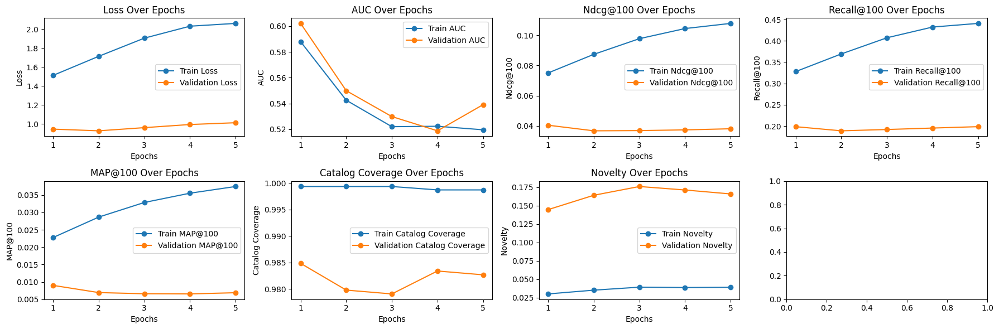

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


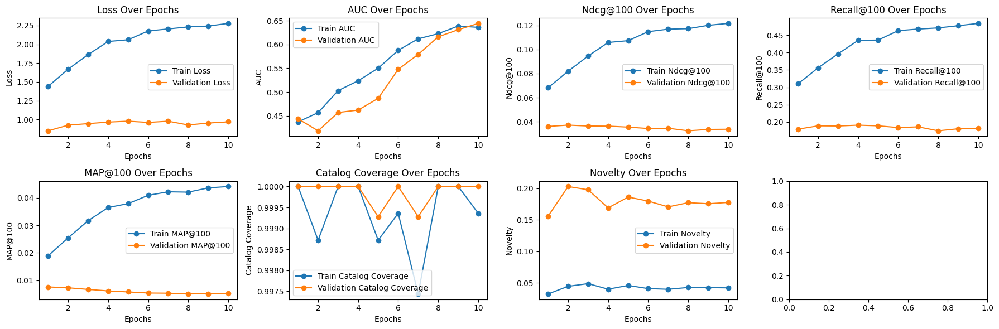

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


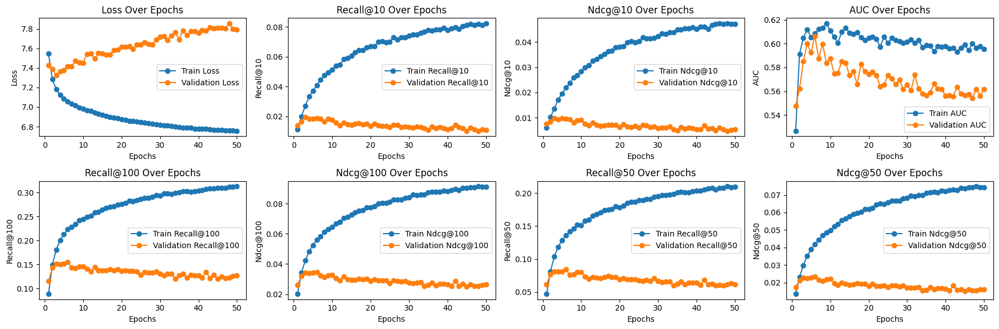

In [ ]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v101

In [37]:
VERSION = 'v101'

_tower_dim = {
    'user':[128, 128],
    'item':[512, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [38]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [39]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [40]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [41]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 49s 831ms/step - loss: 7.5375 - auc: 0.5292 - recall_at_100: 0.0720 - mrr_at_100: 0.0055 - ndcg_at_100: 0.0166 - map_at_100: 0.0055 - precision_at_100: 7.1954e-04 - recall_at_50: 0.0374 - mrr_at_50: 0.0050 - ndcg_at_50: 0.0110 - map_at_50: 0.0050 - precision_at_50: 7.4714e-04 - recall_at_10: 0.0090 - mrr_at_10: 0.0039 - ndcg_at_10: 0.0051 - map_at_10: 0.0039 - precision_at_10: 9.0137e-04 - regularization_loss: 0.0000e+00 - loss_batch: 7.4707 - val_loss: 7.4404 - val_auc: 0.5626 - val_recall_at_100: 0.1178 - val_mrr_at_100: 0.0087 - val_ndcg_at_100: 0.0270 - val_map_at_100: 0.0087 - val_precision_at_100: 0.0012 - val_recall_at_50: 0.0635 - val_mrr_at_50: 0.0080 - val_ndcg_at_50: 0.0183 - val_map_at_50: 0.0080 - val_precision_at_50: 0.0013 - val_recall_at_10: 0.0158 - val_mrr_at_10: 0.0061 - val_ndcg_at_10: 0.0083 - val_map_at_10: 0.0061 - val_precision_at_10: 0.0016 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.3395
Epoch 2

69/69 [==============================] - 6s 20ms/step - loss: 1.4703 - auc: 0.5694 - recall_at_100: 0.3175 - mrr_at_100: 0.0205 - ndcg_at_100: 0.0711 - map_at_100: 0.0205 - precision_at_100: 0.0032 - recall_at_10: 0.0431 - mrr_at_10: 0.0129 - ndcg_at_10: 0.0198 - map_at_10: 0.0129 - precision_at_10: 0.0043 - regularization_loss: 0.0000e+00 - loss_batch: 1.4817
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.4703431129455566, 'auc': 0.5693928003311157, 'recall_at_100': 0.3176262676715851, 'mrr_at_100': 0.021119775250554085, 'ndcg_at_100': 0.07170010358095169, 'map_at_100': 0.021119775250554085, 'precision_at_100': 0.003176263067871332, 'recall_at_10': 0.04428648576140404, 'mrr_at_10': 0.013526827096939087, 'ndcg_at_10': 0.02056555077433586, 'map_at_10': 0.013526827096939087, 'precision_at_10': 0.0044286479242146015, 'regularization_loss': 0.0, 'loss_batch': 2.0222485065460205, 'coverage': 0.9993593850096092, 'novelty': 0.034231160156817195}
Candidate set rows: 1387


15/15 [==============================] - 4s 26ms/step - loss: 0.9124 - auc: 0.5680 - recall_at_100: 0.1855 - mrr_at_100: 0.0071 - ndcg_at_100: 0.0364 - map_at_100: 0.0071 - precision_at_100: 0.0019 - recall_at_10: 0.0133 - mrr_at_10: 0.0029 - ndcg_at_10: 0.0052 - map_at_10: 0.0029 - precision_at_10: 0.0013 - regularization_loss: 0.0000e+00 - loss_batch: 0.9643
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9123920202255249, 'auc': 0.5679523944854736, 'recall_at_100': 0.19085194170475006, 'mrr_at_100': 0.008026876486837864, 'ndcg_at_100': 0.03825372830033302, 'map_at_100': 0.008026876486837864, 'precision_at_100': 0.0019085195381194353, 'recall_at_10': 0.01604921743273735, 'mrr_at_10': 0.0036719751078635454, 'ndcg_at_10': 0.006459998898208141, 'map_at_10': 0.0036719751078635454, 'precision_at_10': 0.0016049217665567994, 'regularization_loss': 0.0, 'loss_batch': 1.5067373514175415, 'coverage': 0.9826964671953857, 'novelty': 0.16872427983539096}
35/35 [=============

69/69 [==============================] - 6s 20ms/step - loss: 1.7356 - auc: 0.5362 - recall_at_100: 0.3727 - mrr_at_100: 0.0277 - ndcg_at_100: 0.0871 - map_at_100: 0.0277 - precision_at_100: 0.0037 - recall_at_10: 0.0582 - mrr_at_10: 0.0187 - ndcg_at_10: 0.0277 - map_at_10: 0.0187 - precision_at_10: 0.0058 - regularization_loss: 0.0000e+00 - loss_batch: 1.7477
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.7355668544769287, 'auc': 0.5362306833267212, 'recall_at_100': 0.3725534975528717, 'mrr_at_100': 0.02826755680143833, 'ndcg_at_100': 0.08765245974063873, 'map_at_100': 0.02826755680143833, 'precision_at_100': 0.0037255340721458197, 'recall_at_10': 0.059599440544843674, 'mrr_at_10': 0.01919380947947502, 'ndcg_at_10': 0.028458988294005394, 'map_at_10': 0.01919380947947502, 'precision_at_10': 0.0059599438682198524, 'regularization_loss': 0.0, 'loss_batch': 2.3224074840545654, 'coverage': 0.9980781550288277, 'novelty': 0.03715670436187399}
Candidate set rows: 1387


15/15 [==============================] - 3s 22ms/step - loss: 0.9560 - auc: 0.5404 - recall_at_100: 0.1870 - mrr_at_100: 0.0068 - ndcg_at_100: 0.0363 - map_at_100: 0.0068 - precision_at_100: 0.0019 - recall_at_10: 0.0116 - mrr_at_10: 0.0026 - ndcg_at_10: 0.0046 - map_at_10: 0.0026 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 1.0078
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9560229778289795, 'auc': 0.5403984785079956, 'recall_at_100': 0.19386117160320282, 'mrr_at_100': 0.0071244616992771626, 'ndcg_at_100': 0.03767286241054535, 'map_at_100': 0.0071244616992771626, 'precision_at_100': 0.0019386117346584797, 'recall_at_10': 0.011635682545602322, 'mrr_at_10': 0.002703714417293668, 'ndcg_at_10': 0.004717518109828234, 'map_at_10': 0.002703714417293668, 'precision_at_10': 0.0011635683476924896, 'regularization_loss': 0.0, 'loss_batch': 1.5489310026168823, 'coverage': 0.9798125450612833, 'novelty': 0.160456014973626}
35/35 [==============

69/69 [==============================] - 5s 21ms/step - loss: 1.8607 - auc: 0.5525 - recall_at_100: 0.3959 - mrr_at_100: 0.0312 - ndcg_at_100: 0.0944 - map_at_100: 0.0312 - precision_at_100: 0.0040 - recall_at_10: 0.0676 - mrr_at_10: 0.0217 - ndcg_at_10: 0.0322 - map_at_10: 0.0217 - precision_at_10: 0.0068 - regularization_loss: 0.0000e+00 - loss_batch: 1.8708
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.860711693763733, 'auc': 0.5524959564208984, 'recall_at_100': 0.39745306968688965, 'mrr_at_100': 0.032049667090177536, 'ndcg_at_100': 0.09544405341148376, 'map_at_100': 0.032049667090177536, 'precision_at_100': 0.003974529914557934, 'recall_at_10': 0.06941397488117218, 'mrr_at_10': 0.02243984118103981, 'ndcg_at_10': 0.03321703150868416, 'map_at_10': 0.02243984118103981, 'precision_at_10': 0.0069413986057043076, 'regularization_loss': 0.0, 'loss_batch': 2.351632595062256, 'coverage': 1.0, 'novelty': 0.041833022801880934}
Candidate set rows: 1387


15/15 [==============================] - 3s 23ms/step - loss: 0.9413 - auc: 0.5685 - recall_at_100: 0.1845 - mrr_at_100: 0.0064 - ndcg_at_100: 0.0353 - map_at_100: 0.0064 - precision_at_100: 0.0018 - recall_at_10: 0.0099 - mrr_at_10: 0.0023 - ndcg_at_10: 0.0040 - map_at_10: 0.0023 - precision_at_10: 9.9240e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9866
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9412782788276672, 'auc': 0.5684686899185181, 'recall_at_100': 0.18617092072963715, 'mrr_at_100': 0.006473972927778959, 'ndcg_at_100': 0.035719871520996094, 'map_at_100': 0.006473972927778959, 'precision_at_100': 0.0018617091700434685, 'recall_at_10': 0.009830146096646786, 'mrr_at_10': 0.0023114534560590982, 'ndcg_at_10': 0.004004230722784996, 'map_at_10': 0.0023114534560590982, 'precision_at_10': 0.0009830145863816142, 'regularization_loss': 0.0, 'loss_batch': 1.460471510887146, 'coverage': 0.9819754866618601, 'novelty': 0.18541093197011405}
35/35 [========

69/69 [==============================] - 5s 21ms/step - loss: 1.9594 - auc: 0.5449 - recall_at_100: 0.4157 - mrr_at_100: 0.0337 - ndcg_at_100: 0.1000 - map_at_100: 0.0337 - precision_at_100: 0.0042 - recall_at_10: 0.0719 - mrr_at_10: 0.0236 - ndcg_at_10: 0.0347 - map_at_10: 0.0236 - precision_at_10: 0.0072 - regularization_loss: 0.0000e+00 - loss_batch: 1.9735
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9593639373779297, 'auc': 0.5449042320251465, 'recall_at_100': 0.41745248436927795, 'mrr_at_100': 0.03433886915445328, 'ndcg_at_100': 0.10083109885454178, 'map_at_100': 0.03433886915445328, 'precision_at_100': 0.004174525383859873, 'recall_at_10': 0.07297512888908386, 'mrr_at_10': 0.024206221103668213, 'ndcg_at_10': 0.035420022904872894, 'map_at_10': 0.024206221103668213, 'precision_at_10': 0.007297512609511614, 'regularization_loss': 0.0, 'loss_batch': 2.643035650253296, 'coverage': 1.0, 'novelty': 0.04233635628984466}
Candidate set rows: 1387


15/15 [==============================] - 3s 22ms/step - loss: 0.9194 - auc: 0.5387 - recall_at_100: 0.1741 - mrr_at_100: 0.0061 - ndcg_at_100: 0.0334 - map_at_100: 0.0061 - precision_at_100: 0.0017 - recall_at_10: 0.0087 - mrr_at_10: 0.0021 - ndcg_at_10: 0.0036 - map_at_10: 0.0021 - precision_at_10: 8.6641e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9792
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9193503260612488, 'auc': 0.538744330406189, 'recall_at_100': 0.18055370450019836, 'mrr_at_100': 0.006314294412732124, 'ndcg_at_100': 0.03468441590666771, 'map_at_100': 0.006314294412732124, 'precision_at_100': 0.0018055371474474669, 'recall_at_10': 0.009228300303220749, 'mrr_at_10': 0.0022517202887684107, 'ndcg_at_10': 0.003833155147731304, 'map_at_10': 0.0022517202887684107, 'precision_at_10': 0.0009228300768882036, 'regularization_loss': 0.0, 'loss_batch': 1.605508804321289, 'coverage': 0.9790915645277577, 'novelty': 0.185119748723989}
35/35 [============

69/69 [==============================] - 7s 30ms/step - loss: 2.0199 - auc: 0.5563 - recall_at_100: 0.4228 - mrr_at_100: 0.0345 - ndcg_at_100: 0.1021 - map_at_100: 0.0345 - precision_at_100: 0.0042 - recall_at_10: 0.0761 - mrr_at_10: 0.0242 - ndcg_at_10: 0.0361 - map_at_10: 0.0242 - precision_at_10: 0.0076 - regularization_loss: 0.0000e+00 - loss_batch: 2.0355
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.019850015640259, 'auc': 0.5563143491744995, 'recall_at_100': 0.42709609866142273, 'mrr_at_100': 0.03577888756990433, 'ndcg_at_100': 0.10389859974384308, 'map_at_100': 0.03577888756990433, 'precision_at_100': 0.0042709605768322945, 'recall_at_10': 0.0779464989900589, 'mrr_at_10': 0.025451134890317917, 'ndcg_at_10': 0.03750050440430641, 'map_at_10': 0.025451134890317917, 'precision_at_10': 0.007794650737196207, 'regularization_loss': 0.0, 'loss_batch': 2.7807958126068115, 'coverage': 1.0, 'novelty': 0.04224721114645401}
Candidate set rows: 1387


15/15 [==============================] - 5s 34ms/step - loss: 0.9432 - auc: 0.5613 - recall_at_100: 0.1758 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0334 - map_at_100: 0.0058 - precision_at_100: 0.0018 - recall_at_10: 0.0084 - mrr_at_10: 0.0018 - ndcg_at_10: 0.0033 - map_at_10: 0.0018 - precision_at_10: 8.3862e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9901
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9432443380355835, 'auc': 0.5613106489181519, 'recall_at_100': 0.1831616908311844, 'mrr_at_100': 0.006240739952772856, 'ndcg_at_100': 0.035066962242126465, 'map_at_100': 0.006240739952772856, 'precision_at_100': 0.0018316167406737804, 'recall_at_10': 0.009094556793570518, 'mrr_at_10': 0.0020499902311712503, 'ndcg_at_10': 0.0036435318179428577, 'map_at_10': 0.0020499902311712503, 'precision_at_10': 0.0009094557026401162, 'regularization_loss': 0.0, 'loss_batch': 1.4796607494354248, 'coverage': 0.9776496034607065, 'novelty': 0.18117195004803072}
35/35 [=======

#### analysis

In [42]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v101


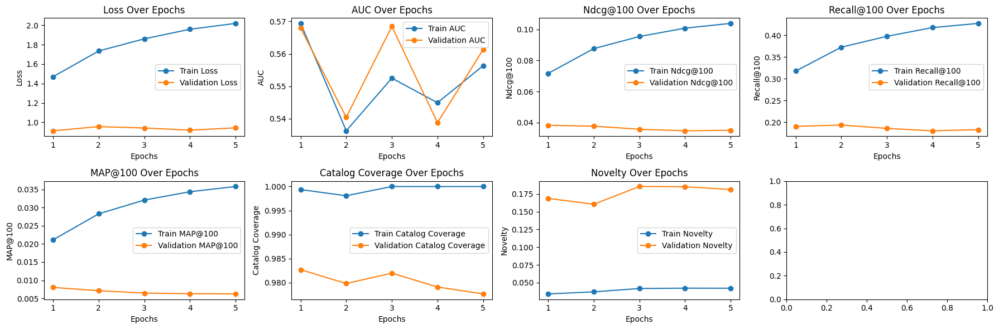

In [43]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


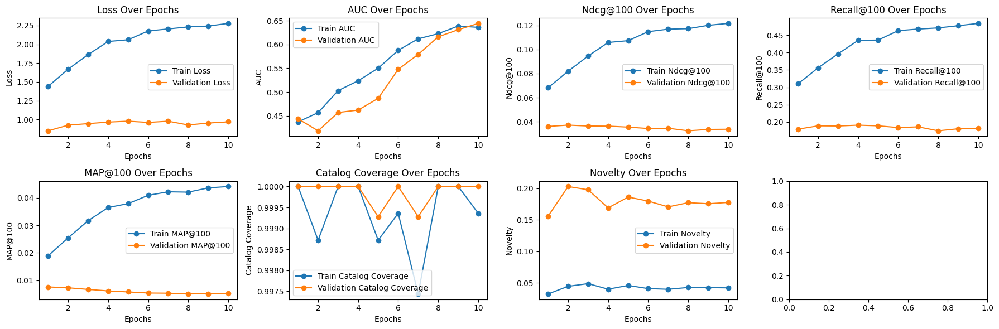

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


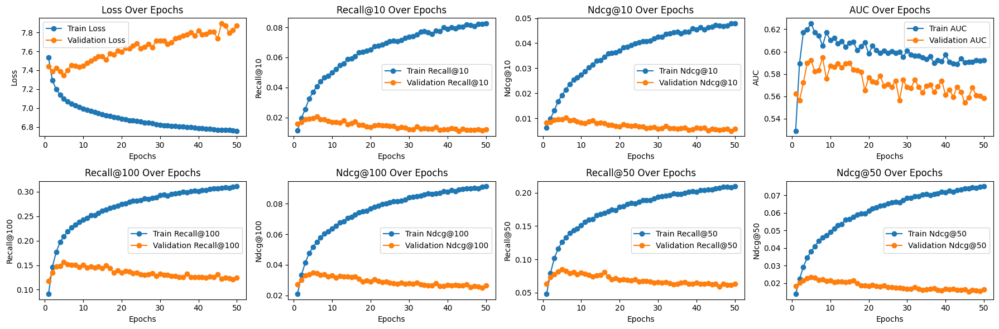

In [44]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v102

In [45]:
VERSION = 'v102'

_tower_dim = {
    'user':[128, 128],
    'item':[256, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [46]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [47]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [48]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [49]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 38s 642ms/step - loss: 7.3097 - auc: 0.5851 - recall_at_100: 0.1114 - mrr_at_100: 0.0089 - ndcg_at_100: 0.0263 - map_at_100: 0.0089 - precision_at_100: 0.0011 - recall_at_50: 0.0636 - mrr_at_50: 0.0082 - ndcg_at_50: 0.0186 - map_at_50: 0.0082 - precision_at_50: 0.0013 - recall_at_10: 0.0174 - mrr_at_10: 0.0063 - ndcg_at_10: 0.0089 - map_at_10: 0.0063 - precision_at_10: 0.0017 - regularization_loss: 0.0000e+00 - loss_batch: 7.2381 - val_loss: 7.4029 - val_auc: 0.5744 - val_recall_at_100: 0.1433 - val_mrr_at_100: 0.0106 - val_ndcg_at_100: 0.0330 - val_map_at_100: 0.0106 - val_precision_at_100: 0.0014 - val_recall_at_50: 0.0807 - val_mrr_at_50: 0.0097 - val_ndcg_at_50: 0.0229 - val_map_at_50: 0.0097 - val_precision_at_50: 0.0016 - val_recall_at_10: 0.0197 - val_mrr_at_10: 0.0073 - val_ndcg_at_10: 0.0101 - val_map_at_10: 0.0073 - val_precision_at_10: 0.0020 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.4339
Epoch 2/50
35/35 [=

69/69 [==============================] - 7s 34ms/step - loss: 1.8679 - auc: 0.5815 - recall_at_100: 0.4002 - mrr_at_100: 0.0317 - ndcg_at_100: 0.0955 - map_at_100: 0.0317 - precision_at_100: 0.0040 - recall_at_10: 0.0673 - mrr_at_10: 0.0220 - ndcg_at_10: 0.0324 - map_at_10: 0.0220 - precision_at_10: 0.0067 - regularization_loss: 0.0000e+00 - loss_batch: 1.8813
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.8679054975509644, 'auc': 0.5815495252609253, 'recall_at_100': 0.4004729092121124, 'mrr_at_100': 0.032116591930389404, 'ndcg_at_100': 0.0959295779466629, 'map_at_100': 0.032116591930389404, 'precision_at_100': 0.00400472991168499, 'recall_at_10': 0.06861627846956253, 'mrr_at_10': 0.02242085710167885, 'ndcg_at_10': 0.03303214907646179, 'map_at_10': 0.02242085710167885, 'precision_at_10': 0.006861627101898193, 'regularization_loss': 0.0, 'loss_batch': 2.5196070671081543, 'coverage': 1.0, 'novelty': 0.03318903318903319}
Candidate set rows: 1387


15/15 [==============================] - 5s 38ms/step - loss: 0.9555 - auc: 0.5974 - recall_at_100: 0.1889 - mrr_at_100: 0.0065 - ndcg_at_100: 0.0363 - map_at_100: 0.0065 - precision_at_100: 0.0019 - recall_at_10: 0.0096 - mrr_at_10: 0.0021 - ndcg_at_10: 0.0038 - map_at_10: 0.0021 - precision_at_10: 9.6024e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9961
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9555376172065735, 'auc': 0.5973795652389526, 'recall_at_100': 0.1913200467824936, 'mrr_at_100': 0.006945569533854723, 'ndcg_at_100': 0.0370880626142025, 'map_at_100': 0.006945569533854723, 'precision_at_100': 0.0019132003653794527, 'recall_at_10': 0.010431991890072823, 'mrr_at_10': 0.002516181906685233, 'ndcg_at_10': 0.004309284035116434, 'map_at_10': 0.002516181906685233, 'precision_at_10': 0.0010431992122903466, 'regularization_loss': 0.0, 'loss_batch': 1.4205803871154785, 'coverage': 0.9762076423936553, 'novelty': 0.16286701208981003}
35/35 [============

69/69 [==============================] - 7s 36ms/step - loss: 2.0426 - auc: 0.5681 - recall_at_100: 0.4323 - mrr_at_100: 0.0358 - ndcg_at_100: 0.1049 - map_at_100: 0.0358 - precision_at_100: 0.0043 - recall_at_10: 0.0786 - mrr_at_10: 0.0253 - ndcg_at_10: 0.0375 - map_at_10: 0.0253 - precision_at_10: 0.0079 - regularization_loss: 0.0000e+00 - loss_batch: 2.0577
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.0425729751586914, 'auc': 0.5680607557296753, 'recall_at_100': 0.4355858862400055, 'mrr_at_100': 0.036803022027015686, 'ndcg_at_100': 0.10641548037528992, 'map_at_100': 0.036803022027015686, 'precision_at_100': 0.004355859011411667, 'recall_at_10': 0.08004045486450195, 'mrr_at_10': 0.026112467050552368, 'ndcg_at_10': 0.03850463405251503, 'map_at_10': 0.026112467050552368, 'precision_at_10': 0.00800404418259859, 'regularization_loss': 0.0, 'loss_batch': 2.774656057357788, 'coverage': 1.0, 'novelty': 0.04085965596429655}
Candidate set rows: 1387


15/15 [==============================] - 7s 40ms/step - loss: 0.9807 - auc: 0.5813 - recall_at_100: 0.1863 - mrr_at_100: 0.0063 - ndcg_at_100: 0.0355 - map_at_100: 0.0063 - precision_at_100: 0.0019 - recall_at_10: 0.0091 - mrr_at_10: 0.0021 - ndcg_at_10: 0.0037 - map_at_10: 0.0021 - precision_at_10: 9.1194e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0315
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9806822538375854, 'auc': 0.581344485282898, 'recall_at_100': 0.19105255603790283, 'mrr_at_100': 0.00635823979973793, 'ndcg_at_100': 0.036299679428339005, 'map_at_100': 0.00635823979973793, 'precision_at_100': 0.0019105254905298352, 'recall_at_10': 0.00949578732252121, 'mrr_at_10': 0.002165928017348051, 'ndcg_at_10': 0.003811472561210394, 'map_at_10': 0.002165928017348051, 'precision_at_10': 0.0009495787089690566, 'regularization_loss': 0.0, 'loss_batch': 1.5624513626098633, 'coverage': 0.9783705839942322, 'novelty': 0.16428571428571428}
35/35 [=============

69/69 [==============================] - 9s 34ms/step - loss: 2.1946 - auc: 0.5674 - recall_at_100: 0.4648 - mrr_at_100: 0.0401 - ndcg_at_100: 0.1143 - map_at_100: 0.0401 - precision_at_100: 0.0046 - recall_at_10: 0.0886 - mrr_at_10: 0.0288 - ndcg_at_10: 0.0426 - map_at_10: 0.0288 - precision_at_10: 0.0089 - regularization_loss: 0.0000e+00 - loss_batch: 2.2089
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.194594144821167, 'auc': 0.5674188733100891, 'recall_at_100': 0.464559406042099, 'mrr_at_100': 0.04047982767224312, 'ndcg_at_100': 0.1147196814417839, 'map_at_100': 0.04047982767224312, 'precision_at_100': 0.0046455939300358295, 'recall_at_10': 0.08972679078578949, 'mrr_at_10': 0.029218362644314766, 'ndcg_at_10': 0.04312765970826149, 'map_at_10': 0.029218362644314766, 'precision_at_10': 0.008972679264843464, 'regularization_loss': 0.0, 'loss_batch': 2.8881447315216064, 'coverage': 1.0, 'novelty': 0.035971771886324624}
Candidate set rows: 1387


15/15 [==============================] - 3s 26ms/step - loss: 0.9289 - auc: 0.5903 - recall_at_100: 0.1785 - mrr_at_100: 0.0057 - ndcg_at_100: 0.0335 - map_at_100: 0.0057 - precision_at_100: 0.0018 - recall_at_10: 0.0067 - mrr_at_10: 0.0018 - ndcg_at_10: 0.0029 - map_at_10: 0.0018 - precision_at_10: 6.6629e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9779
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9288752675056458, 'auc': 0.590347170829773, 'recall_at_100': 0.1776113361120224, 'mrr_at_100': 0.0055660344660282135, 'ndcg_at_100': 0.03337147459387779, 'map_at_100': 0.0055660344660282135, 'precision_at_100': 0.0017761134076863527, 'recall_at_10': 0.00708840461447835, 'mrr_at_10': 0.0016153507167473435, 'ndcg_at_10': 0.002840988337993622, 'map_at_10': 0.0016153507167473435, 'precision_at_10': 0.0007088406127877533, 'regularization_loss': 0.0, 'loss_batch': 1.4908230304718018, 'coverage': 0.9754866618601298, 'novelty': 0.16391447940205112}
35/35 [=========

69/69 [==============================] - 9s 31ms/step - loss: 2.1701 - auc: 0.5746 - recall_at_100: 0.4544 - mrr_at_100: 0.0397 - ndcg_at_100: 0.1124 - map_at_100: 0.0397 - precision_at_100: 0.0045 - recall_at_10: 0.0882 - mrr_at_10: 0.0286 - ndcg_at_10: 0.0423 - map_at_10: 0.0286 - precision_at_10: 0.0088 - regularization_loss: 0.0000e+00 - loss_batch: 2.1865
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.1701197624206543, 'auc': 0.5745851993560791, 'recall_at_100': 0.45738014578819275, 'mrr_at_100': 0.0406225211918354, 'ndcg_at_100': 0.11368905007839203, 'map_at_100': 0.0406225211918354, 'precision_at_100': 0.004573800601065159, 'recall_at_10': 0.08985499292612076, 'mrr_at_10': 0.02949700877070427, 'ndcg_at_10': 0.04336967691779137, 'map_at_10': 0.02949700877070427, 'precision_at_10': 0.008985500782728195, 'regularization_loss': 0.0, 'loss_batch': 2.9652352333068848, 'coverage': 1.0, 'novelty': 0.04033361847733105}
Candidate set rows: 1387


15/15 [==============================] - 5s 24ms/step - loss: 0.9484 - auc: 0.5851 - recall_at_100: 0.1814 - mrr_at_100: 0.0052 - ndcg_at_100: 0.0336 - map_at_100: 0.0052 - precision_at_100: 0.0018 - recall_at_10: 0.0069 - mrr_at_10: 0.0012 - ndcg_at_10: 0.0025 - map_at_10: 0.0012 - precision_at_10: 6.8913e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9911
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9483875632286072, 'auc': 0.5850861072540283, 'recall_at_100': 0.17995184659957886, 'mrr_at_100': 0.005407110322266817, 'ndcg_at_100': 0.03361308202147484, 'map_at_100': 0.005407110322266817, 'precision_at_100': 0.0017995184753090143, 'recall_at_10': 0.007289019878953695, 'mrr_at_10': 0.0014076768420636654, 'ndcg_at_10': 0.002720918972045183, 'map_at_10': 0.0014076768420636654, 'precision_at_10': 0.0007289019995369017, 'regularization_loss': 0.0, 'loss_batch': 1.4379291534423828, 'coverage': 0.9783705839942322, 'novelty': 0.17098821396192204}
35/35 [========

69/69 [==============================] - 7s 20ms/step - loss: 2.3211 - auc: 0.5618 - recall_at_100: 0.4897 - mrr_at_100: 0.0423 - ndcg_at_100: 0.1209 - map_at_100: 0.0423 - precision_at_100: 0.0049 - recall_at_10: 0.0968 - mrr_at_10: 0.0303 - ndcg_at_10: 0.0456 - map_at_10: 0.0303 - precision_at_10: 0.0097 - regularization_loss: 0.0000e+00 - loss_batch: 2.3351
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.32108998298645, 'auc': 0.5618468523025513, 'recall_at_100': 0.4912395775318146, 'mrr_at_100': 0.043569788336753845, 'ndcg_at_100': 0.12226299196481705, 'map_at_100': 0.043569788336753845, 'precision_at_100': 0.004912395961582661, 'recall_at_10': 0.0983305349946022, 'mrr_at_10': 0.031565263867378235, 'ndcg_at_10': 0.04690036177635193, 'map_at_10': 0.031565263867378235, 'precision_at_10': 0.00983305275440216, 'regularization_loss': 0.0, 'loss_batch': 3.0003163814544678, 'coverage': 1.0, 'novelty': 0.0368834826143075}
Candidate set rows: 1387


15/15 [==============================] - 4s 23ms/step - loss: 0.9531 - auc: 0.5754 - recall_at_100: 0.1752 - mrr_at_100: 0.0052 - ndcg_at_100: 0.0326 - map_at_100: 0.0052 - precision_at_100: 0.0018 - recall_at_10: 0.0060 - mrr_at_10: 0.0013 - ndcg_at_10: 0.0023 - map_at_10: 0.0013 - precision_at_10: 6.0401e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9951
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.953123927116394, 'auc': 0.5754286050796509, 'recall_at_100': 0.17914938926696777, 'mrr_at_100': 0.005233404226601124, 'ndcg_at_100': 0.03328527882695198, 'map_at_100': 0.005233404226601124, 'precision_at_100': 0.0017914940835908055, 'recall_at_10': 0.006219071801751852, 'mrr_at_10': 0.0012190559646114707, 'ndcg_at_10': 0.002333403332158923, 'map_at_10': 0.0012190559646114707, 'precision_at_10': 0.0006219072383828461, 'regularization_loss': 0.0, 'loss_batch': 1.433815598487854, 'coverage': 0.976928622927181, 'novelty': 0.1585673448797713}
35/35 [============

#### analysis

In [50]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v102


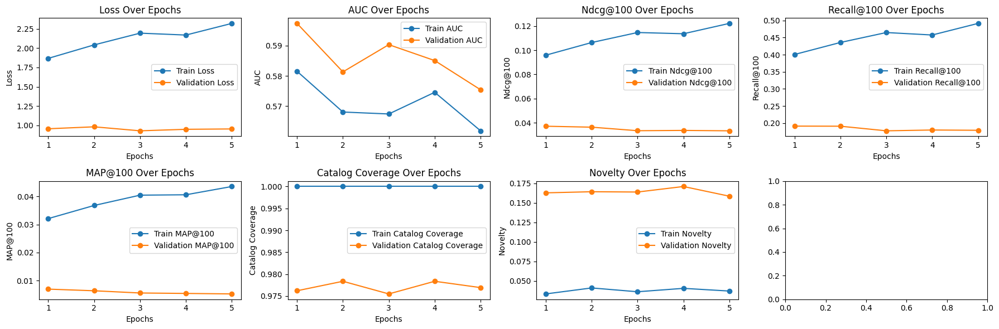

In [51]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


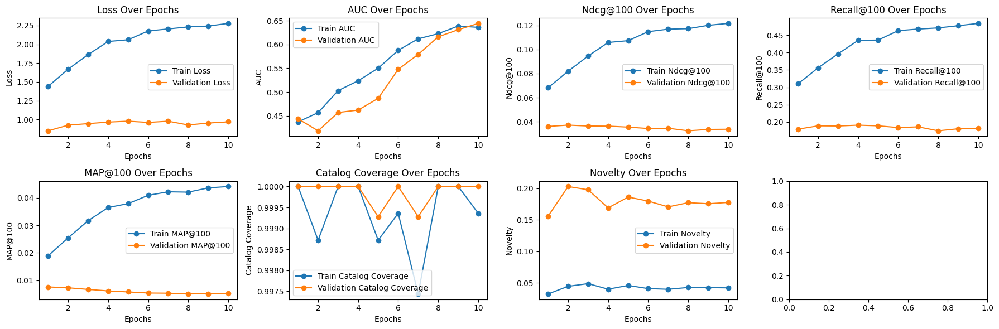

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


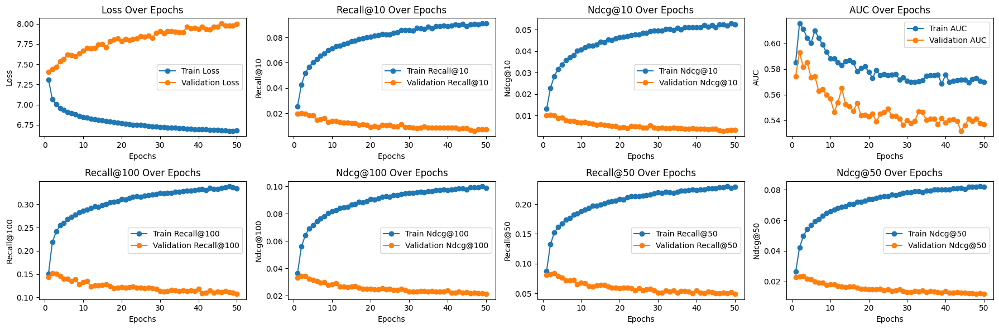

In [52]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v103

In [53]:
VERSION = 'v103'

_tower_dim = {
    'user':[128, 128],
    'item':[256, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 0.5 # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [54]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [55]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [56]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [57]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 39s 728ms/step - loss: 7.3091 - auc: 0.5983 - recall_at_100: 0.1124 - mrr_at_100: 0.0086 - ndcg_at_100: 0.0262 - map_at_100: 0.0086 - precision_at_100: 0.0011 - recall_at_50: 0.0634 - mrr_at_50: 0.0079 - ndcg_at_50: 0.0183 - map_at_50: 0.0079 - precision_at_50: 0.0013 - recall_at_10: 0.0164 - mrr_at_10: 0.0060 - ndcg_at_10: 0.0084 - map_at_10: 0.0060 - precision_at_10: 0.0016 - regularization_loss: 0.0000e+00 - loss_batch: 7.2382 - val_loss: 7.3922 - val_auc: 0.5888 - val_recall_at_100: 0.1415 - val_mrr_at_100: 0.0098 - val_ndcg_at_100: 0.0319 - val_map_at_100: 0.0098 - val_precision_at_100: 0.0014 - val_recall_at_50: 0.0754 - val_mrr_at_50: 0.0088 - val_ndcg_at_50: 0.0213 - val_map_at_50: 0.0088 - val_precision_at_50: 0.0015 - val_recall_at_10: 0.0184 - val_mrr_at_10: 0.0065 - val_ndcg_at_10: 0.0092 - val_map_at_10: 0.0065 - val_precision_at_10: 0.0018 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.3897
Epoch 2/50
35/35 [=

69/69 [==============================] - 7s 21ms/step - loss: 1.9375 - auc: 0.5843 - recall_at_100: 0.4096 - mrr_at_100: 0.0324 - ndcg_at_100: 0.0977 - map_at_100: 0.0324 - precision_at_100: 0.0041 - recall_at_10: 0.0701 - mrr_at_10: 0.0225 - ndcg_at_10: 0.0334 - map_at_10: 0.0225 - precision_at_10: 0.0070 - regularization_loss: 0.0000e+00 - loss_batch: 1.9552
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9374879598617554, 'auc': 0.584293782711029, 'recall_at_100': 0.414005309343338, 'mrr_at_100': 0.03319527953863144, 'ndcg_at_100': 0.09920945763587952, 'map_at_100': 0.03319527953863144, 'precision_at_100': 0.004140052478760481, 'recall_at_10': 0.07156491279602051, 'mrr_at_10': 0.02318372204899788, 'ndcg_at_10': 0.03428797051310539, 'map_at_10': 0.02318372204899788, 'precision_at_10': 0.007156492676585913, 'regularization_loss': 0.0, 'loss_batch': 2.795647144317627, 'coverage': 1.0, 'novelty': 0.03605429172242401}
Candidate set rows: 1387


15/15 [==============================] - 4s 23ms/step - loss: 0.9722 - auc: 0.6012 - recall_at_100: 0.1918 - mrr_at_100: 0.0064 - ndcg_at_100: 0.0366 - map_at_100: 0.0064 - precision_at_100: 0.0019 - recall_at_10: 0.0102 - mrr_at_10: 0.0021 - ndcg_at_10: 0.0040 - map_at_10: 0.0021 - precision_at_10: 0.0010 - regularization_loss: 0.0000e+00 - loss_batch: 1.0193
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9721723198890686, 'auc': 0.6011922359466553, 'recall_at_100': 0.19439615309238434, 'mrr_at_100': 0.0067580388858914375, 'ndcg_at_100': 0.03739437460899353, 'map_at_100': 0.0067580388858914375, 'precision_at_100': 0.0019439614843577147, 'recall_at_10': 0.011167580261826515, 'mrr_at_10': 0.0023744511418044567, 'ndcg_at_10': 0.0043596005998551846, 'map_at_10': 0.0023744511418044567, 'precision_at_10': 0.0011167580960318446, 'regularization_loss': 0.0, 'loss_batch': 1.5121163129806519, 'coverage': 0.9733237202595529, 'novelty': 0.16111395865368186}
35/35 [=========

69/69 [==============================] - 8s 25ms/step - loss: 2.0622 - auc: 0.5683 - recall_at_100: 0.4346 - mrr_at_100: 0.0371 - ndcg_at_100: 0.1063 - map_at_100: 0.0371 - precision_at_100: 0.0043 - recall_at_10: 0.0800 - mrr_at_10: 0.0265 - ndcg_at_10: 0.0388 - map_at_10: 0.0265 - precision_at_10: 0.0080 - regularization_loss: 0.0000e+00 - loss_batch: 2.0781
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.062246322631836, 'auc': 0.5682950019836426, 'recall_at_100': 0.4354434311389923, 'mrr_at_100': 0.03686884790658951, 'ndcg_at_100': 0.10632174462080002, 'map_at_100': 0.03686884790658951, 'precision_at_100': 0.0043544345535337925, 'recall_at_10': 0.08035383373498917, 'mrr_at_10': 0.02633395791053772, 'ndcg_at_10': 0.038750097155570984, 'map_at_10': 0.02633395791053772, 'precision_at_10': 0.008035382255911827, 'regularization_loss': 0.0, 'loss_batch': 2.830841302871704, 'coverage': 1.0, 'novelty': 0.04205690839354206}
Candidate set rows: 1387


15/15 [==============================] - 4s 25ms/step - loss: 0.9500 - auc: 0.5816 - recall_at_100: 0.1787 - mrr_at_100: 0.0056 - ndcg_at_100: 0.0335 - map_at_100: 0.0056 - precision_at_100: 0.0018 - recall_at_10: 0.0069 - mrr_at_10: 0.0017 - ndcg_at_10: 0.0029 - map_at_10: 0.0017 - precision_at_10: 6.9069e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9994
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9500099420547485, 'auc': 0.5816042423248291, 'recall_at_100': 0.18282733857631683, 'mrr_at_100': 0.006160033401101828, 'ndcg_at_100': 0.03475901484489441, 'map_at_100': 0.006160033401101828, 'precision_at_100': 0.0018282734090462327, 'recall_at_10': 0.008358967490494251, 'mrr_at_10': 0.002100568963214755, 'ndcg_at_10': 0.0035225411411374807, 'map_at_10': 0.002100568963214755, 'precision_at_10': 0.0008358967606909573, 'regularization_loss': 0.0, 'loss_batch': 1.5157456398010254, 'coverage': 0.9740447007930786, 'novelty': 0.17521367521367523}
35/35 [=========

69/69 [==============================] - 7s 33ms/step - loss: 2.1966 - auc: 0.5600 - recall_at_100: 0.4579 - mrr_at_100: 0.0398 - ndcg_at_100: 0.1130 - map_at_100: 0.0398 - precision_at_100: 0.0046 - recall_at_10: 0.0883 - mrr_at_10: 0.0287 - ndcg_at_10: 0.0424 - map_at_10: 0.0287 - precision_at_10: 0.0088 - regularization_loss: 0.0000e+00 - loss_batch: 2.2120
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.196620464324951, 'auc': 0.5600436925888062, 'recall_at_100': 0.46200963854789734, 'mrr_at_100': 0.040232401341199875, 'ndcg_at_100': 0.11411598324775696, 'map_at_100': 0.040232401341199875, 'precision_at_100': 0.00462009571492672, 'recall_at_10': 0.08947038650512695, 'mrr_at_10': 0.028987500816583633, 'ndcg_at_10': 0.04288727417588234, 'map_at_10': 0.028987500816583633, 'precision_at_10': 0.008947040885686874, 'regularization_loss': 0.0, 'loss_batch': 2.940385580062866, 'coverage': 1.0, 'novelty': 0.038261786902539965}
Candidate set rows: 1387


15/15 [==============================] - 5s 36ms/step - loss: 0.9648 - auc: 0.5759 - recall_at_100: 0.1755 - mrr_at_100: 0.0054 - ndcg_at_100: 0.0329 - map_at_100: 0.0054 - precision_at_100: 0.0018 - recall_at_10: 0.0077 - mrr_at_10: 0.0015 - ndcg_at_10: 0.0029 - map_at_10: 0.0015 - precision_at_10: 7.6808e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0163
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9647768139839172, 'auc': 0.5758935809135437, 'recall_at_100': 0.18269360065460205, 'mrr_at_100': 0.005834244657307863, 'ndcg_at_100': 0.0345158614218235, 'map_at_100': 0.005834244657307863, 'precision_at_100': 0.001826935913413763, 'recall_at_10': 0.008425839245319366, 'mrr_at_10': 0.001761858118698001, 'ndcg_at_10': 0.0032569507602602243, 'map_at_10': 0.001761858118698001, 'precision_at_10': 0.000842583947815001, 'regularization_loss': 0.0, 'loss_batch': 1.5553568601608276, 'coverage': 0.9747656813266041, 'novelty': 0.1659626891939458}
35/35 [=============

69/69 [==============================] - 7s 21ms/step - loss: 2.2422 - auc: 0.5525 - recall_at_100: 0.4703 - mrr_at_100: 0.0410 - ndcg_at_100: 0.1160 - map_at_100: 0.0410 - precision_at_100: 0.0047 - recall_at_10: 0.0896 - mrr_at_10: 0.0297 - ndcg_at_10: 0.0435 - map_at_10: 0.0297 - precision_at_10: 0.0090 - regularization_loss: 0.0000e+00 - loss_batch: 2.2587
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.242210865020752, 'auc': 0.5525000691413879, 'recall_at_100': 0.47242245078086853, 'mrr_at_100': 0.04132545739412308, 'ndcg_at_100': 0.1167573481798172, 'map_at_100': 0.04132545739412308, 'precision_at_100': 0.004724225495010614, 'recall_at_10': 0.09069541841745377, 'mrr_at_10': 0.029848404228687286, 'ndcg_at_10': 0.04384844750165939, 'map_at_10': 0.029848404228687286, 'precision_at_10': 0.009069542400538921, 'regularization_loss': 0.0, 'loss_batch': 3.0438625812530518, 'coverage': 1.0, 'novelty': 0.04044779960538732}
Candidate set rows: 1387


15/15 [==============================] - 3s 25ms/step - loss: 0.9412 - auc: 0.5729 - recall_at_100: 0.1779 - mrr_at_100: 0.0056 - ndcg_at_100: 0.0334 - map_at_100: 0.0056 - precision_at_100: 0.0018 - recall_at_10: 0.0067 - mrr_at_10: 0.0017 - ndcg_at_10: 0.0028 - map_at_10: 0.0017 - precision_at_10: 6.7331e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9978
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.941186785697937, 'auc': 0.5728707313537598, 'recall_at_100': 0.179015651345253, 'mrr_at_100': 0.005622494965791702, 'ndcg_at_100': 0.03367047384381294, 'map_at_100': 0.005622494965791702, 'precision_at_100': 0.0017901563551276922, 'recall_at_10': 0.006954661104828119, 'mrr_at_10': 0.0016139174113050103, 'ndcg_at_10': 0.002829443197697401, 'map_at_10': 0.0016139174113050103, 'precision_at_10': 0.0006954661221243441, 'regularization_loss': 0.0, 'loss_batch': 1.5899733304977417, 'coverage': 0.9747656813266041, 'novelty': 0.16779359430604981}
35/35 [===========

69/69 [==============================] - 7s 21ms/step - loss: 2.3105 - auc: 0.5573 - recall_at_100: 0.4834 - mrr_at_100: 0.0426 - ndcg_at_100: 0.1202 - map_at_100: 0.0426 - precision_at_100: 0.0048 - recall_at_10: 0.0972 - mrr_at_10: 0.0307 - ndcg_at_10: 0.0459 - map_at_10: 0.0307 - precision_at_10: 0.0097 - regularization_loss: 0.0000e+00 - loss_batch: 2.3259
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.310469627380371, 'auc': 0.5572629570960999, 'recall_at_100': 0.48871827125549316, 'mrr_at_100': 0.04374875873327255, 'ndcg_at_100': 0.12210504710674286, 'map_at_100': 0.04374875873327255, 'precision_at_100': 0.0048871831968426704, 'recall_at_10': 0.0990854948759079, 'mrr_at_10': 0.03176948428153992, 'ndcg_at_10': 0.04722817987203598, 'map_at_10': 0.03176948428153992, 'precision_at_10': 0.009908550418913364, 'regularization_loss': 0.0, 'loss_batch': 3.058591604232788, 'coverage': 1.0, 'novelty': 0.03631392483056069}
Candidate set rows: 1387


15/15 [==============================] - 3s 24ms/step - loss: 0.9623 - auc: 0.5703 - recall_at_100: 0.1799 - mrr_at_100: 0.0049 - ndcg_at_100: 0.0330 - map_at_100: 0.0049 - precision_at_100: 0.0018 - recall_at_10: 0.0045 - mrr_at_10: 9.0308e-04 - ndcg_at_10: 0.0017 - map_at_10: 9.0308e-04 - precision_at_10: 4.4814e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0016
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9623132944107056, 'auc': 0.5703179836273193, 'recall_at_100': 0.18008559942245483, 'mrr_at_100': 0.00512306671589613, 'ndcg_at_100': 0.03329659625887871, 'map_at_100': 0.00512306671589613, 'precision_at_100': 0.0018008558545261621, 'recall_at_10': 0.005215995945036411, 'mrr_at_10': 0.001052513369359076, 'ndcg_at_10': 0.001982001820579171, 'map_at_10': 0.001052513369359076, 'precision_at_10': 0.0005215996061451733, 'regularization_loss': 0.0, 'loss_batch': 1.4124833345413208, 'coverage': 0.9754866618601298, 'novelty': 0.15724528931132234}
35/35 [====

#### analysis

In [58]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v103


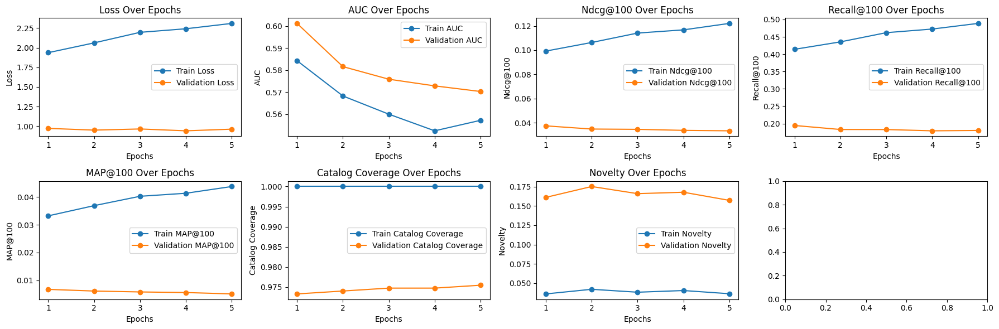

In [59]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


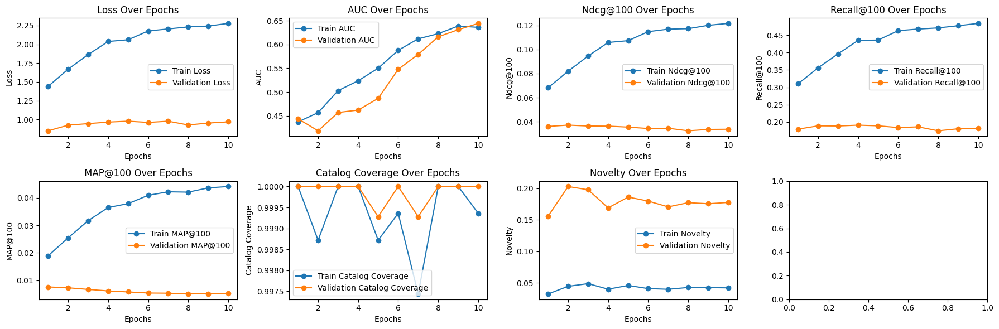

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


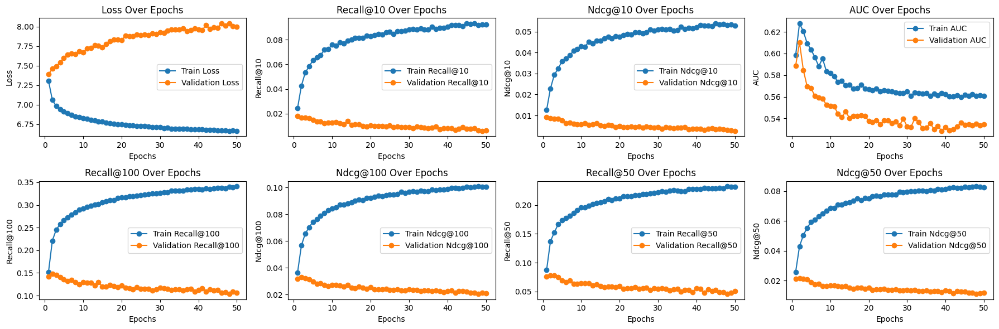

In [60]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v104

In [61]:
VERSION = 'v104'

_tower_dim = {
    'user':[128, 256],
    'item':[256, 256],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [62]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [63]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [64]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [65]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 39s 629ms/step - loss: 7.3722 - auc: 0.5860 - recall_at_100: 0.0977 - mrr_at_100: 0.0072 - ndcg_at_100: 0.0224 - map_at_100: 0.0072 - precision_at_100: 9.7686e-04 - recall_at_50: 0.0533 - mrr_at_50: 0.0066 - ndcg_at_50: 0.0153 - map_at_50: 0.0066 - precision_at_50: 0.0011 - recall_at_10: 0.0129 - mrr_at_10: 0.0050 - ndcg_at_10: 0.0068 - map_at_10: 0.0050 - precision_at_10: 0.0013 - regularization_loss: 0.0000e+00 - loss_batch: 7.2998 - val_loss: 7.4304 - val_auc: 0.6210 - val_recall_at_100: 0.1377 - val_mrr_at_100: 0.0104 - val_ndcg_at_100: 0.0317 - val_map_at_100: 0.0104 - val_precision_at_100: 0.0014 - val_recall_at_50: 0.0723 - val_mrr_at_50: 0.0095 - val_ndcg_at_50: 0.0212 - val_map_at_50: 0.0095 - val_precision_at_50: 0.0014 - val_recall_at_10: 0.0178 - val_mrr_at_10: 0.0073 - val_ndcg_at_10: 0.0097 - val_map_at_10: 0.0073 - val_precision_at_10: 0.0018 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.4862
Epoch 2/50
35/3

69/69 [==============================] - 6s 24ms/step - loss: 1.7606 - auc: 0.5719 - recall_at_100: 0.3746 - mrr_at_100: 0.0286 - ndcg_at_100: 0.0883 - map_at_100: 0.0286 - precision_at_100: 0.0037 - recall_at_10: 0.0601 - mrr_at_10: 0.0196 - ndcg_at_10: 0.0289 - map_at_10: 0.0196 - precision_at_10: 0.0060 - regularization_loss: 0.0000e+00 - loss_batch: 1.7715
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.7605583667755127, 'auc': 0.5719037055969238, 'recall_at_100': 0.3753027021884918, 'mrr_at_100': 0.028392542153596878, 'ndcg_at_100': 0.08815999329090118, 'map_at_100': 0.028392542153596878, 'precision_at_100': 0.0037530269473791122, 'recall_at_10': 0.06001253426074982, 'mrr_at_10': 0.019356148317456245, 'ndcg_at_10': 0.028693312779068947, 'map_at_10': 0.019356148317456245, 'precision_at_10': 0.006001254078000784, 'regularization_loss': 0.0, 'loss_batch': 2.291182279586792, 'coverage': 1.0, 'novelty': 0.04192974655402401}
Candidate set rows: 1387


15/15 [==============================] - 5s 39ms/step - loss: 0.9804 - auc: 0.5543 - recall_at_100: 0.1970 - mrr_at_100: 0.0074 - ndcg_at_100: 0.0385 - map_at_100: 0.0074 - precision_at_100: 0.0020 - recall_at_10: 0.0118 - mrr_at_10: 0.0028 - ndcg_at_10: 0.0049 - map_at_10: 0.0028 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 1.0265
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9804352521896362, 'auc': 0.5542563796043396, 'recall_at_100': 0.1988096833229065, 'mrr_at_100': 0.007673907559365034, 'ndcg_at_100': 0.03910084068775177, 'map_at_100': 0.007673907559365034, 'precision_at_100': 0.0019880966283380985, 'recall_at_10': 0.01290624588727951, 'mrr_at_10': 0.00303029827773571, 'ndcg_at_10': 0.00526200607419014, 'map_at_10': 0.00303029827773571, 'precision_at_10': 0.0012906244955956936, 'regularization_loss': 0.0, 'loss_batch': 1.5083404779434204, 'coverage': 0.9754866618601298, 'novelty': 0.1651777894552461}
35/35 [====================

69/69 [==============================] - 9s 34ms/step - loss: 2.0099 - auc: 0.5536 - recall_at_100: 0.4235 - mrr_at_100: 0.0334 - ndcg_at_100: 0.1010 - map_at_100: 0.0334 - precision_at_100: 0.0042 - recall_at_10: 0.0717 - mrr_at_10: 0.0230 - ndcg_at_10: 0.0342 - map_at_10: 0.0230 - precision_at_10: 0.0072 - regularization_loss: 0.0000e+00 - loss_batch: 2.0241
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.009885311126709, 'auc': 0.5535879135131836, 'recall_at_100': 0.4268966615200043, 'mrr_at_100': 0.034222424030303955, 'ndcg_at_100': 0.10229401290416718, 'map_at_100': 0.034222424030303955, 'precision_at_100': 0.004268966615200043, 'recall_at_10': 0.0734594464302063, 'mrr_at_10': 0.023882731795310974, 'ndcg_at_10': 0.035268910229206085, 'map_at_10': 0.023882731795310974, 'precision_at_10': 0.00734594464302063, 'regularization_loss': 0.0, 'loss_batch': 2.6978960037231445, 'coverage': 1.0, 'novelty': 0.039876522327469556}
Candidate set rows: 1387


15/15 [==============================] - 5s 38ms/step - loss: 0.9514 - auc: 0.5601 - recall_at_100: 0.1818 - mrr_at_100: 0.0064 - ndcg_at_100: 0.0350 - map_at_100: 0.0064 - precision_at_100: 0.0018 - recall_at_10: 0.0106 - mrr_at_10: 0.0023 - ndcg_at_10: 0.0042 - map_at_10: 0.0023 - precision_at_10: 0.0011 - regularization_loss: 0.0000e+00 - loss_batch: 0.9963
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9514253735542297, 'auc': 0.5601257085800171, 'recall_at_100': 0.18750835955142975, 'mrr_at_100': 0.006400287616997957, 'ndcg_at_100': 0.03594326600432396, 'map_at_100': 0.006400287616997957, 'precision_at_100': 0.0018750835442915559, 'recall_at_10': 0.01096696499735117, 'mrr_at_10': 0.0022208583541214466, 'ndcg_at_10': 0.004181549418717623, 'map_at_10': 0.0022208583541214466, 'precision_at_10': 0.0010966965928673744, 'regularization_loss': 0.0, 'loss_batch': 1.465980052947998, 'coverage': 0.9747656813266041, 'novelty': 0.17167303841252504}
35/35 [==============

69/69 [==============================] - 9s 34ms/step - loss: 2.1265 - auc: 0.5610 - recall_at_100: 0.4418 - mrr_at_100: 0.0356 - ndcg_at_100: 0.1062 - map_at_100: 0.0356 - precision_at_100: 0.0044 - recall_at_10: 0.0773 - mrr_at_10: 0.0247 - ndcg_at_10: 0.0368 - map_at_10: 0.0247 - precision_at_10: 0.0077 - regularization_loss: 0.0000e+00 - loss_batch: 2.1413
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.126514196395874, 'auc': 0.5610038042068481, 'recall_at_100': 0.44940313696861267, 'mrr_at_100': 0.03696335107088089, 'ndcg_at_100': 0.10875506699085236, 'map_at_100': 0.03696335107088089, 'precision_at_100': 0.004494032356888056, 'recall_at_10': 0.0804535448551178, 'mrr_at_10': 0.026002107188105583, 'ndcg_at_10': 0.03851183131337166, 'map_at_10': 0.026002107188105583, 'precision_at_10': 0.008045353926718235, 'regularization_loss': 0.0, 'loss_batch': 2.844609498977661, 'coverage': 1.0, 'novelty': 0.040866738894907904}
Candidate set rows: 1387


15/15 [==============================] - 5s 38ms/step - loss: 0.9707 - auc: 0.5659 - recall_at_100: 0.1842 - mrr_at_100: 0.0065 - ndcg_at_100: 0.0354 - map_at_100: 0.0065 - precision_at_100: 0.0018 - recall_at_10: 0.0097 - mrr_at_10: 0.0024 - ndcg_at_10: 0.0040 - map_at_10: 0.0024 - precision_at_10: 9.6671e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0108
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9707258343696594, 'auc': 0.5659298896789551, 'recall_at_100': 0.18757523596286774, 'mrr_at_100': 0.006514688953757286, 'ndcg_at_100': 0.03593214601278305, 'map_at_100': 0.006514688953757286, 'precision_at_100': 0.0018757522339001298, 'recall_at_10': 0.010030761361122131, 'mrr_at_10': 0.0023461102973669767, 'ndcg_at_10': 0.0040842220187187195, 'map_at_10': 0.0023461102973669767, 'precision_at_10': 0.0010030762059614062, 'regularization_loss': 0.0, 'loss_batch': 1.4295330047607422, 'coverage': 0.9740447007930786, 'novelty': 0.17866616142478212}
35/35 [=======

69/69 [==============================] - 7s 21ms/step - loss: 2.1629 - auc: 0.5603 - recall_at_100: 0.4539 - mrr_at_100: 0.0377 - ndcg_at_100: 0.1101 - map_at_100: 0.0377 - precision_at_100: 0.0045 - recall_at_10: 0.0816 - mrr_at_10: 0.0266 - ndcg_at_10: 0.0392 - map_at_10: 0.0266 - precision_at_10: 0.0082 - regularization_loss: 0.0000e+00 - loss_batch: 2.1772
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.1629085540771484, 'auc': 0.5603415369987488, 'recall_at_100': 0.4524657428264618, 'mrr_at_100': 0.03832748904824257, 'ndcg_at_100': 0.1105610579252243, 'map_at_100': 0.03832748904824257, 'precision_at_100': 0.004524657502770424, 'recall_at_10': 0.08294635266065598, 'mrr_at_10': 0.027258291840553284, 'ndcg_at_10': 0.040052630007267, 'map_at_10': 0.027258291840553284, 'precision_at_10': 0.008294636383652687, 'regularization_loss': 0.0, 'loss_batch': 2.857943058013916, 'coverage': 1.0, 'novelty': 0.04324497844629918}
Candidate set rows: 1387


15/15 [==============================] - 3s 24ms/step - loss: 0.9327 - auc: 0.5697 - recall_at_100: 0.1691 - mrr_at_100: 0.0052 - ndcg_at_100: 0.0316 - map_at_100: 0.0052 - precision_at_100: 0.0017 - recall_at_10: 0.0062 - mrr_at_10: 0.0014 - ndcg_at_10: 0.0025 - map_at_10: 0.0014 - precision_at_10: 6.2038e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9854
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9327405095100403, 'auc': 0.569685697555542, 'recall_at_100': 0.176273912191391, 'mrr_at_100': 0.00542046083137393, 'ndcg_at_100': 0.033059973269701004, 'map_at_100': 0.00542046083137393, 'precision_at_100': 0.0017627390334382653, 'recall_at_10': 0.006954661104828119, 'mrr_at_10': 0.0014579896815121174, 'ndcg_at_10': 0.0026892644818872213, 'map_at_10': 0.0014579896815121174, 'precision_at_10': 0.0006954660639166832, 'regularization_loss': 0.0, 'loss_batch': 1.536022663116455, 'coverage': 0.9711607786589762, 'novelty': 0.18541093197011405}
35/35 [============

69/69 [==============================] - 6s 21ms/step - loss: 2.2183 - auc: 0.5621 - recall_at_100: 0.4625 - mrr_at_100: 0.0383 - ndcg_at_100: 0.1122 - map_at_100: 0.0383 - precision_at_100: 0.0046 - recall_at_10: 0.0837 - mrr_at_10: 0.0271 - ndcg_at_10: 0.0401 - map_at_10: 0.0271 - precision_at_10: 0.0084 - regularization_loss: 0.0000e+00 - loss_batch: 2.2360
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.218313694000244, 'auc': 0.562097430229187, 'recall_at_100': 0.46376171708106995, 'mrr_at_100': 0.039016835391521454, 'ndcg_at_100': 0.11311771720647812, 'map_at_100': 0.039016835391521454, 'precision_at_100': 0.004637617152184248, 'recall_at_10': 0.08609441667795181, 'mrr_at_10': 0.027768900617957115, 'ndcg_at_10': 0.041166964918375015, 'map_at_10': 0.027768900617957115, 'precision_at_10': 0.008609442971646786, 'regularization_loss': 0.0, 'loss_batch': 3.0740041732788086, 'coverage': 1.0, 'novelty': 0.0444329265419592}
Candidate set rows: 1387


15/15 [==============================] - 3s 24ms/step - loss: 0.9568 - auc: 0.5839 - recall_at_100: 0.1778 - mrr_at_100: 0.0056 - ndcg_at_100: 0.0334 - map_at_100: 0.0056 - precision_at_100: 0.0018 - recall_at_10: 0.0078 - mrr_at_10: 0.0017 - ndcg_at_10: 0.0030 - map_at_10: 0.0017 - precision_at_10: 7.7765e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0027
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9568061828613281, 'auc': 0.5839434266090393, 'recall_at_100': 0.181690514087677, 'mrr_at_100': 0.005832949187606573, 'ndcg_at_100': 0.03431591019034386, 'map_at_100': 0.005832949187606573, 'precision_at_100': 0.001816905103623867, 'recall_at_10': 0.008358967490494251, 'mrr_at_10': 0.0018162577180191875, 'ndcg_at_10': 0.003280730452388525, 'map_at_10': 0.0018162577180191875, 'precision_at_10': 0.0008358968771062791, 'regularization_loss': 0.0, 'loss_batch': 1.482835054397583, 'coverage': 0.9740447007930786, 'novelty': 0.18145083702135847}
35/35 [============

#### analysis

In [66]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v104


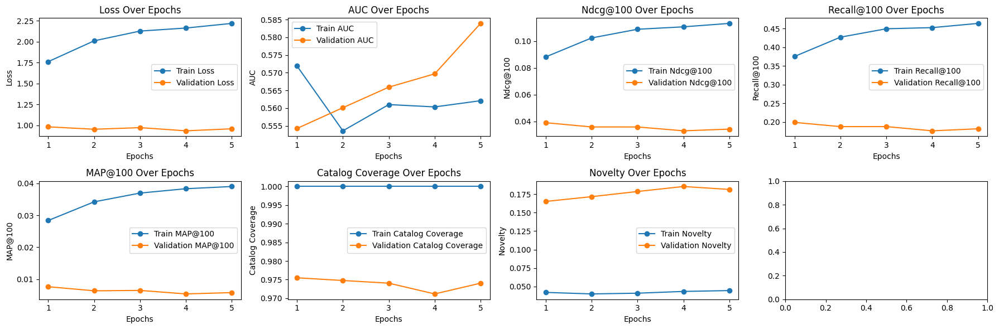

In [67]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


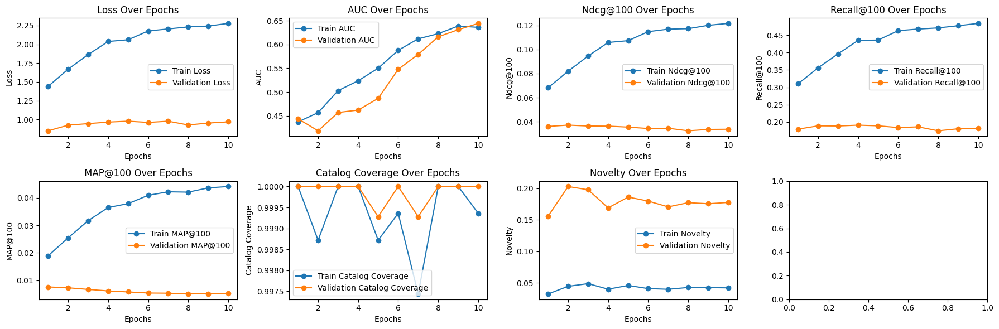

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


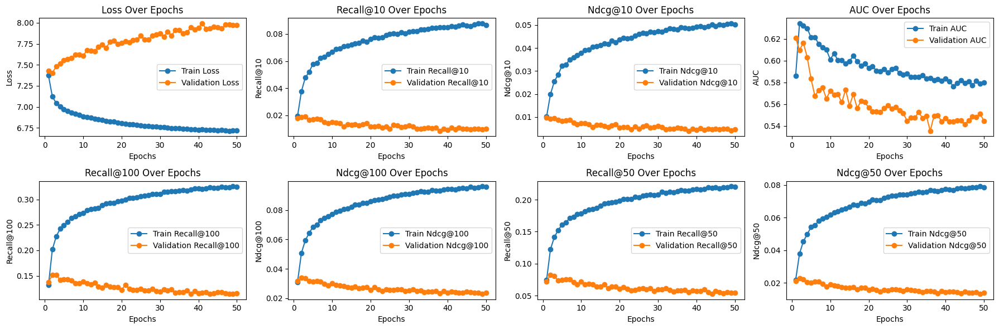

In [68]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v105

In [73]:
VERSION = 'v105'

_tower_dim = {
    'user':[128, 256],
    'item':[256, 256],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 2 # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [74]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

RuntimeError: ignored

In [ ]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [75]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [76]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 35s 563ms/step - loss: 7.4498 - auc: 0.5752 - recall_at_100: 0.0903 - mrr_at_100: 0.0065 - ndcg_at_100: 0.0206 - map_at_100: 0.0065 - precision_at_100: 9.0254e-04 - recall_at_50: 0.0486 - mrr_at_50: 0.0059 - ndcg_at_50: 0.0138 - map_at_50: 0.0059 - precision_at_50: 9.7173e-04 - recall_at_10: 0.0120 - mrr_at_10: 0.0044 - ndcg_at_10: 0.0061 - map_at_10: 0.0044 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 7.3752 - val_loss: 7.3997 - val_auc: 0.6452 - val_recall_at_100: 0.1507 - val_mrr_at_100: 0.0101 - val_ndcg_at_100: 0.0337 - val_map_at_100: 0.0101 - val_precision_at_100: 0.0015 - val_recall_at_50: 0.0819 - val_mrr_at_50: 0.0092 - val_ndcg_at_50: 0.0227 - val_map_at_50: 0.0092 - val_precision_at_50: 0.0016 - val_recall_at_10: 0.0182 - val_mrr_at_10: 0.0066 - val_ndcg_at_10: 0.0093 - val_map_at_10: 0.0066 - val_precision_at_10: 0.0018 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.4150
Epoch 2/50


69/69 [==============================] - 6s 23ms/step - loss: 1.7209 - auc: 0.6217 - recall_at_100: 0.3590 - mrr_at_100: 0.0249 - ndcg_at_100: 0.0820 - map_at_100: 0.0249 - precision_at_100: 0.0036 - recall_at_10: 0.0517 - mrr_at_10: 0.0163 - ndcg_at_10: 0.0244 - map_at_10: 0.0163 - precision_at_10: 0.0052 - regularization_loss: 0.0000e+00 - loss_batch: 1.7321
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.7209111452102661, 'auc': 0.6217010021209717, 'recall_at_100': 0.36202672123908997, 'mrr_at_100': 0.024837011471390724, 'ndcg_at_100': 0.08240357786417007, 'map_at_100': 0.024837011471390724, 'precision_at_100': 0.0036202669143676758, 'recall_at_10': 0.05119512230157852, 'mrr_at_10': 0.01618066430091858, 'ndcg_at_10': 0.02421019971370697, 'map_at_10': 0.01618066430091858, 'precision_at_10': 0.00511951232329011, 'regularization_loss': 0.0, 'loss_batch': 2.2621264457702637, 'coverage': 1.0, 'novelty': 0.05088770168906157}
Candidate set rows: 1387


15/15 [==============================] - 5s 35ms/step - loss: 0.9316 - auc: 0.6243 - recall_at_100: 0.1815 - mrr_at_100: 0.0071 - ndcg_at_100: 0.0356 - map_at_100: 0.0071 - precision_at_100: 0.0018 - recall_at_10: 0.0124 - mrr_at_10: 0.0031 - ndcg_at_10: 0.0052 - map_at_10: 0.0031 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 0.9802
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9315940737724304, 'auc': 0.6242613196372986, 'recall_at_100': 0.1871071308851242, 'mrr_at_100': 0.007383379619568586, 'ndcg_at_100': 0.036835502833127975, 'map_at_100': 0.007383379619568586, 'precision_at_100': 0.0018710712902247906, 'recall_at_10': 0.013508091680705547, 'mrr_at_10': 0.0032043508253991604, 'ndcg_at_10': 0.0055342381820082664, 'map_at_10': 0.0032043508253991604, 'precision_at_10': 0.0013508092379197478, 'regularization_loss': 0.0, 'loss_batch': 1.4884157180786133, 'coverage': 0.976928622927181, 'novelty': 0.19170563122585893}
35/35 [============

69/69 [==============================] - 8s 21ms/step - loss: 1.8354 - auc: 0.5896 - recall_at_100: 0.3843 - mrr_at_100: 0.0290 - ndcg_at_100: 0.0902 - map_at_100: 0.0290 - precision_at_100: 0.0038 - recall_at_10: 0.0619 - mrr_at_10: 0.0198 - ndcg_at_10: 0.0294 - map_at_10: 0.0198 - precision_at_10: 0.0062 - regularization_loss: 0.0000e+00 - loss_batch: 1.8489
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.8354326486587524, 'auc': 0.5895702838897705, 'recall_at_100': 0.38595765829086304, 'mrr_at_100': 0.02960817702114582, 'ndcg_at_100': 0.09105100482702255, 'map_at_100': 0.02960817702114582, 'precision_at_100': 0.0038595760706812143, 'recall_at_10': 0.06330303847789764, 'mrr_at_10': 0.02035575360059738, 'ndcg_at_10': 0.0301972683519125, 'map_at_10': 0.02035575360059738, 'precision_at_10': 0.006330304313451052, 'regularization_loss': 0.0, 'loss_batch': 2.489929676055908, 'coverage': 1.0, 'novelty': 0.049715309995782365}
Candidate set rows: 1387


15/15 [==============================] - 3s 25ms/step - loss: 0.9733 - auc: 0.6058 - recall_at_100: 0.1896 - mrr_at_100: 0.0068 - ndcg_at_100: 0.0366 - map_at_100: 0.0068 - precision_at_100: 0.0019 - recall_at_10: 0.0119 - mrr_at_10: 0.0025 - ndcg_at_10: 0.0047 - map_at_10: 0.0025 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 1.0129
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.973317563533783, 'auc': 0.6057836413383484, 'recall_at_100': 0.19285809993743896, 'mrr_at_100': 0.006937302649021149, 'ndcg_at_100': 0.03735293447971344, 'map_at_100': 0.006937302649021149, 'precision_at_100': 0.0019285810412839055, 'recall_at_10': 0.011568810790777206, 'mrr_at_10': 0.0025502019561827183, 'ndcg_at_10': 0.004595252685248852, 'map_at_10': 0.0025502019561827183, 'precision_at_10': 0.001156881102360785, 'regularization_loss': 0.0, 'loss_batch': 1.4265061616897583, 'coverage': 0.9740447007930786, 'novelty': 0.19877740303541314}
35/35 [==============

69/69 [==============================] - 8s 33ms/step - loss: 1.9949 - auc: 0.6144 - recall_at_100: 0.4211 - mrr_at_100: 0.0347 - ndcg_at_100: 0.1019 - map_at_100: 0.0347 - precision_at_100: 0.0042 - recall_at_10: 0.0756 - mrr_at_10: 0.0245 - ndcg_at_10: 0.0362 - map_at_10: 0.0245 - precision_at_10: 0.0076 - regularization_loss: 0.0000e+00 - loss_batch: 2.0076
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9949125051498413, 'auc': 0.6143880486488342, 'recall_at_100': 0.42134127020835876, 'mrr_at_100': 0.034576863050460815, 'ndcg_at_100': 0.10181654989719391, 'map_at_100': 0.034576863050460815, 'precision_at_100': 0.004213412757962942, 'recall_at_10': 0.07533973455429077, 'mrr_at_10': 0.02438664250075817, 'ndcg_at_10': 0.03608737140893936, 'map_at_10': 0.02438664250075817, 'precision_at_10': 0.007533973548561335, 'regularization_loss': 0.0, 'loss_batch': 2.6091716289520264, 'coverage': 1.0, 'novelty': 0.040928819444444445}
Candidate set rows: 1387


15/15 [==============================] - 3s 23ms/step - loss: 0.9881 - auc: 0.6163 - recall_at_100: 0.1884 - mrr_at_100: 0.0060 - ndcg_at_100: 0.0355 - map_at_100: 0.0060 - precision_at_100: 0.0019 - recall_at_10: 0.0079 - mrr_at_10: 0.0017 - ndcg_at_10: 0.0031 - map_at_10: 0.0017 - precision_at_10: 7.9220e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0281
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9880643486976624, 'auc': 0.6163221597671509, 'recall_at_100': 0.1926574856042862, 'mrr_at_100': 0.006392583250999451, 'ndcg_at_100': 0.03667844086885452, 'map_at_100': 0.006392583250999451, 'precision_at_100': 0.0019265747396275401, 'recall_at_10': 0.008893941529095173, 'mrr_at_10': 0.0019859846215695143, 'ndcg_at_10': 0.003539982484653592, 'map_at_10': 0.0019859846215695143, 'precision_at_10': 0.0008893941412679851, 'regularization_loss': 0.0, 'loss_batch': 1.4467352628707886, 'coverage': 0.9740447007930786, 'novelty': 0.18194096083349412}
35/35 [=========

69/69 [==============================] - 6s 23ms/step - loss: 2.0339 - auc: 0.5966 - recall_at_100: 0.4253 - mrr_at_100: 0.0346 - ndcg_at_100: 0.1024 - map_at_100: 0.0346 - precision_at_100: 0.0043 - recall_at_10: 0.0749 - mrr_at_10: 0.0243 - ndcg_at_10: 0.0359 - map_at_10: 0.0243 - precision_at_10: 0.0075 - regularization_loss: 0.0000e+00 - loss_batch: 2.0480
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.0339391231536865, 'auc': 0.5965800285339355, 'recall_at_100': 0.42641234397888184, 'mrr_at_100': 0.03530166670680046, 'ndcg_at_100': 0.10328876972198486, 'map_at_100': 0.03530166670680046, 'precision_at_100': 0.004264123737812042, 'recall_at_10': 0.07575282454490662, 'mrr_at_10': 0.0249191764742136, 'ndcg_at_10': 0.03659331053495407, 'map_at_10': 0.0249191764742136, 'precision_at_10': 0.007575283292680979, 'regularization_loss': 0.0, 'loss_batch': 2.715135335922241, 'coverage': 1.0, 'novelty': 0.041666666666666664}
Candidate set rows: 1387


15/15 [==============================] - 5s 34ms/step - loss: 0.9605 - auc: 0.5967 - recall_at_100: 0.1772 - mrr_at_100: 0.0053 - ndcg_at_100: 0.0330 - map_at_100: 0.0053 - precision_at_100: 0.0018 - recall_at_10: 0.0059 - mrr_at_10: 0.0014 - ndcg_at_10: 0.0024 - map_at_10: 0.0014 - precision_at_10: 5.9207e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0175
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9604818820953369, 'auc': 0.596660315990448, 'recall_at_100': 0.1831616908311844, 'mrr_at_100': 0.005838505458086729, 'ndcg_at_100': 0.034540656954050064, 'map_at_100': 0.005838505458086729, 'precision_at_100': 0.0018316167406737804, 'recall_at_10': 0.007690249942243099, 'mrr_at_10': 0.0017302532214671373, 'ndcg_at_10': 0.003066424746066332, 'map_at_10': 0.0017302532214671373, 'precision_at_10': 0.000769025064073503, 'regularization_loss': 0.0, 'loss_batch': 1.6136372089385986, 'coverage': 0.9762076423936553, 'novelty': 0.18250435455777048}
35/35 [==========

69/69 [==============================] - 8s 21ms/step - loss: 2.1037 - auc: 0.5911 - recall_at_100: 0.4389 - mrr_at_100: 0.0372 - ndcg_at_100: 0.1073 - map_at_100: 0.0372 - precision_at_100: 0.0044 - recall_at_10: 0.0808 - mrr_at_10: 0.0265 - ndcg_at_10: 0.0389 - map_at_10: 0.0265 - precision_at_10: 0.0081 - regularization_loss: 0.0000e+00 - loss_batch: 2.1177
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.1037135124206543, 'auc': 0.5911085605621338, 'recall_at_100': 0.4410558044910431, 'mrr_at_100': 0.03758880868554115, 'ndcg_at_100': 0.10803515464067459, 'map_at_100': 0.03758880868554115, 'precision_at_100': 0.004410557448863983, 'recall_at_10': 0.08179254084825516, 'mrr_at_10': 0.026807934045791626, 'ndcg_at_10': 0.03945343196392059, 'map_at_10': 0.026807934045791626, 'precision_at_10': 0.008179252035915852, 'regularization_loss': 0.0, 'loss_batch': 2.78353214263916, 'coverage': 1.0, 'novelty': 0.04243160547156227}
Candidate set rows: 1387


15/15 [==============================] - 3s 26ms/step - loss: 0.9626 - auc: 0.5934 - recall_at_100: 0.1745 - mrr_at_100: 0.0053 - ndcg_at_100: 0.0326 - map_at_100: 0.0053 - precision_at_100: 0.0017 - recall_at_10: 0.0075 - mrr_at_10: 0.0015 - ndcg_at_10: 0.0028 - map_at_10: 0.0015 - precision_at_10: 7.4725e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0209
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9626365900039673, 'auc': 0.5933524370193481, 'recall_at_100': 0.18195800483226776, 'mrr_at_100': 0.0055588651448488235, 'ndcg_at_100': 0.034041039645671844, 'map_at_100': 0.0055588651448488235, 'precision_at_100': 0.0018195799784734845, 'recall_at_10': 0.00722214812412858, 'mrr_at_10': 0.0015386604936793447, 'ndcg_at_10': 0.002817959990352392, 'map_at_10': 0.0015386604936793447, 'precision_at_10': 0.000722214812412858, 'regularization_loss': 0.0, 'loss_batch': 1.6305820941925049, 'coverage': 0.9740447007930786, 'novelty': 0.18548387096774194}
35/35 [=======

#### analysis

In [77]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v105


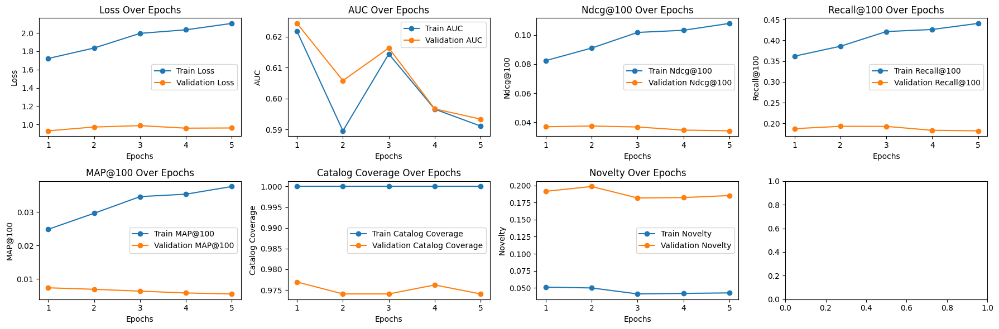

In [78]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


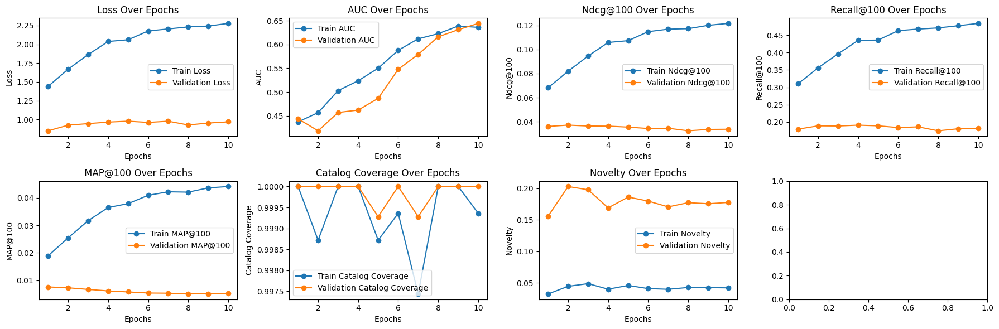

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


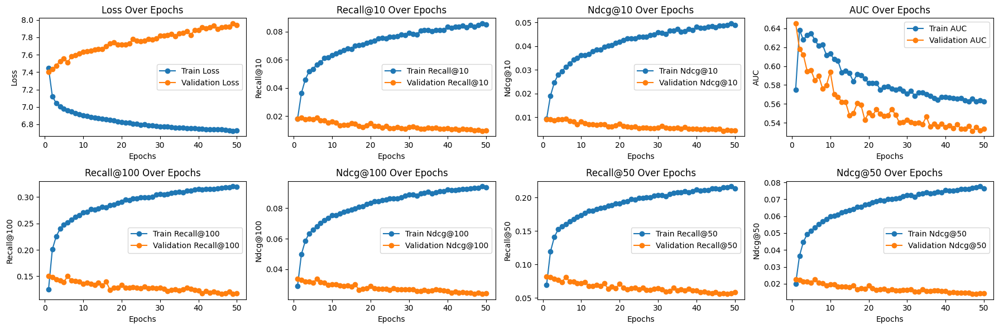

In [79]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v106

In [80]:
VERSION = 'v106'

_tower_dim = {
    'user':[128, 256],
    'item':[256, 256],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 4 # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [81]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [82]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [83]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [84]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 42s 802ms/step - loss: 7.3470 - auc: 0.5665 - recall_at_100: 0.1028 - mrr_at_100: 0.0080 - ndcg_at_100: 0.0240 - map_at_100: 0.0080 - precision_at_100: 0.0010 - recall_at_50: 0.0566 - mrr_at_50: 0.0074 - ndcg_at_50: 0.0166 - map_at_50: 0.0074 - precision_at_50: 0.0011 - recall_at_10: 0.0149 - mrr_at_10: 0.0057 - ndcg_at_10: 0.0078 - map_at_10: 0.0057 - precision_at_10: 0.0015 - regularization_loss: 0.0000e+00 - loss_batch: 7.2762 - val_loss: 7.4082 - val_auc: 0.5678 - val_recall_at_100: 0.1377 - val_mrr_at_100: 0.0092 - val_ndcg_at_100: 0.0306 - val_map_at_100: 0.0092 - val_precision_at_100: 0.0014 - val_recall_at_50: 0.0731 - val_mrr_at_50: 0.0083 - val_ndcg_at_50: 0.0202 - val_map_at_50: 0.0083 - val_precision_at_50: 0.0015 - val_recall_at_10: 0.0155 - val_mrr_at_10: 0.0060 - val_ndcg_at_10: 0.0081 - val_map_at_10: 0.0060 - val_precision_at_10: 0.0016 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.3254
Epoch 2/50
35/35 [=

69/69 [==============================] - 6s 21ms/step - loss: 1.8187 - auc: 0.6102 - recall_at_100: 0.3805 - mrr_at_100: 0.0283 - ndcg_at_100: 0.0890 - map_at_100: 0.0283 - precision_at_100: 0.0038 - recall_at_10: 0.0601 - mrr_at_10: 0.0191 - ndcg_at_10: 0.0285 - map_at_10: 0.0191 - precision_at_10: 0.0060 - regularization_loss: 0.0000e+00 - loss_batch: 1.8333
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.8186922073364258, 'auc': 0.6101510524749756, 'recall_at_100': 0.385159969329834, 'mrr_at_100': 0.029319219291210175, 'ndcg_at_100': 0.09062509983778, 'map_at_100': 0.029319219291210175, 'precision_at_100': 0.003851599059998989, 'recall_at_10': 0.06177886575460434, 'mrr_at_10': 0.020042644813656807, 'ndcg_at_10': 0.029622038826346397, 'map_at_10': 0.020042644813656807, 'precision_at_10': 0.006177884992212057, 'regularization_loss': 0.0, 'loss_batch': 2.5290632247924805, 'coverage': 1.0, 'novelty': 0.04007820136852395}
Candidate set rows: 1387


15/15 [==============================] - 3s 23ms/step - loss: 0.9108 - auc: 0.6141 - recall_at_100: 0.1791 - mrr_at_100: 0.0068 - ndcg_at_100: 0.0350 - map_at_100: 0.0068 - precision_at_100: 0.0018 - recall_at_10: 0.0120 - mrr_at_10: 0.0028 - ndcg_at_10: 0.0049 - map_at_10: 0.0028 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 0.9692
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9107769727706909, 'auc': 0.6141488552093506, 'recall_at_100': 0.18276046216487885, 'mrr_at_100': 0.007282789796590805, 'ndcg_at_100': 0.03606491535902023, 'map_at_100': 0.007282789796590805, 'precision_at_100': 0.001827604603022337, 'recall_at_10': 0.011970041319727898, 'mrr_at_10': 0.0031089787371456623, 'ndcg_at_10': 0.005121584981679916, 'map_at_10': 0.0031089787371456623, 'precision_at_10': 0.0011970042251050472, 'regularization_loss': 0.0, 'loss_batch': 1.579677939414978, 'coverage': 0.9718817591925017, 'novelty': 0.17372881355932204}
35/35 [==============

69/69 [==============================] - 8s 32ms/step - loss: 2.0181 - auc: 0.5770 - recall_at_100: 0.4259 - mrr_at_100: 0.0351 - ndcg_at_100: 0.1029 - map_at_100: 0.0351 - precision_at_100: 0.0043 - recall_at_10: 0.0752 - mrr_at_10: 0.0248 - ndcg_at_10: 0.0364 - map_at_10: 0.0248 - precision_at_10: 0.0075 - regularization_loss: 0.0000e+00 - loss_batch: 2.0281
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.018057346343994, 'auc': 0.5770261883735657, 'recall_at_100': 0.42511609196662903, 'mrr_at_100': 0.035222992300987244, 'ndcg_at_100': 0.10287593305110931, 'map_at_100': 0.035222992300987244, 'precision_at_100': 0.004251161124557257, 'recall_at_10': 0.07552491128444672, 'mrr_at_10': 0.025009140372276306, 'ndcg_at_10': 0.036621224135160446, 'map_at_10': 0.025009140372276306, 'precision_at_10': 0.0075524915009737015, 'regularization_loss': 0.0, 'loss_batch': 2.504378318786621, 'coverage': 1.0, 'novelty': 0.03706615306002122}
Candidate set rows: 1387


15/15 [==============================] - 3s 24ms/step - loss: 0.9602 - auc: 0.5992 - recall_at_100: 0.1872 - mrr_at_100: 0.0061 - ndcg_at_100: 0.0356 - map_at_100: 0.0061 - precision_at_100: 0.0019 - recall_at_10: 0.0091 - mrr_at_10: 0.0018 - ndcg_at_10: 0.0035 - map_at_10: 0.0018 - precision_at_10: 9.1283e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9967
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.960218608379364, 'auc': 0.5991771817207336, 'recall_at_100': 0.18697337806224823, 'mrr_at_100': 0.006497381255030632, 'ndcg_at_100': 0.03593028709292412, 'map_at_100': 0.006497381255030632, 'precision_at_100': 0.0018697339110076427, 'recall_at_10': 0.009428915567696095, 'mrr_at_10': 0.0022067143581807613, 'ndcg_at_10': 0.0038303707260638475, 'map_at_10': 0.0022067143581807613, 'precision_at_10': 0.0009428916382603347, 'regularization_loss': 0.0, 'loss_batch': 1.3781297206878662, 'coverage': 0.9733237202595529, 'novelty': 0.17392106233862042}
35/35 [========

69/69 [==============================] - 5s 21ms/step - loss: 2.1595 - auc: 0.5794 - recall_at_100: 0.4516 - mrr_at_100: 0.0367 - ndcg_at_100: 0.1088 - map_at_100: 0.0367 - precision_at_100: 0.0045 - recall_at_10: 0.0810 - mrr_at_10: 0.0257 - ndcg_at_10: 0.0384 - map_at_10: 0.0257 - precision_at_10: 0.0081 - regularization_loss: 0.0000e+00 - loss_batch: 2.1730
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.159522294998169, 'auc': 0.5794380903244019, 'recall_at_100': 0.45464515686035156, 'mrr_at_100': 0.03756841644644737, 'ndcg_at_100': 0.11016800999641418, 'map_at_100': 0.03756841644644737, 'precision_at_100': 0.004546451382339001, 'recall_at_10': 0.08186376094818115, 'mrr_at_10': 0.026500996202230453, 'ndcg_at_10': 0.03921262174844742, 'map_at_10': 0.026500996202230453, 'precision_at_10': 0.00818637665361166, 'regularization_loss': 0.0, 'loss_batch': 2.8119380474090576, 'coverage': 1.0, 'novelty': 0.04393607603783255}
Candidate set rows: 1387


15/15 [==============================] - 5s 34ms/step - loss: 0.9542 - auc: 0.6108 - recall_at_100: 0.1798 - mrr_at_100: 0.0062 - ndcg_at_100: 0.0345 - map_at_100: 0.0062 - precision_at_100: 0.0018 - recall_at_10: 0.0103 - mrr_at_10: 0.0023 - ndcg_at_10: 0.0041 - map_at_10: 0.0023 - precision_at_10: 0.0010 - regularization_loss: 0.0000e+00 - loss_batch: 0.9980
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9542128443717957, 'auc': 0.6107667088508606, 'recall_at_100': 0.18342918157577515, 'mrr_at_100': 0.006165267899632454, 'ndcg_at_100': 0.034956227988004684, 'map_at_100': 0.006165267899632454, 'precision_at_100': 0.0018342918483540416, 'recall_at_10': 0.009094556793570518, 'mrr_at_10': 0.0020772432908415794, 'ndcg_at_10': 0.0036582443863153458, 'map_at_10': 0.0020772432908415794, 'precision_at_10': 0.000909455819055438, 'regularization_loss': 0.0, 'loss_batch': 1.4559224843978882, 'coverage': 0.9747656813266041, 'novelty': 0.18006492266564827}
35/35 [===========

69/69 [==============================] - 8s 26ms/step - loss: 2.1783 - auc: 0.5692 - recall_at_100: 0.4565 - mrr_at_100: 0.0381 - ndcg_at_100: 0.1113 - map_at_100: 0.0381 - precision_at_100: 0.0046 - recall_at_10: 0.0867 - mrr_at_10: 0.0269 - ndcg_at_10: 0.0406 - map_at_10: 0.0269 - precision_at_10: 0.0087 - regularization_loss: 0.0000e+00 - loss_batch: 2.1927
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.1782751083374023, 'auc': 0.5691728591918945, 'recall_at_100': 0.4596307873725891, 'mrr_at_100': 0.039531197398900986, 'ndcg_at_100': 0.11307156085968018, 'map_at_100': 0.039531197398900986, 'precision_at_100': 0.004596307408064604, 'recall_at_10': 0.08827383816242218, 'mrr_at_10': 0.028336266055703163, 'ndcg_at_10': 0.04210340604186058, 'map_at_10': 0.028336266055703163, 'precision_at_10': 0.008827382698655128, 'regularization_loss': 0.0, 'loss_batch': 2.8780643939971924, 'coverage': 1.0, 'novelty': 0.04250236625050706}
Candidate set rows: 1387


15/15 [==============================] - 4s 24ms/step - loss: 0.9738 - auc: 0.5878 - recall_at_100: 0.1824 - mrr_at_100: 0.0056 - ndcg_at_100: 0.0342 - map_at_100: 0.0056 - precision_at_100: 0.0018 - recall_at_10: 0.0072 - mrr_at_10: 0.0015 - ndcg_at_10: 0.0028 - map_at_10: 0.0015 - precision_at_10: 7.2475e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0115
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9738087058067322, 'auc': 0.5878011584281921, 'recall_at_100': 0.18610405921936035, 'mrr_at_100': 0.005914291832596064, 'ndcg_at_100': 0.03521168231964111, 'map_at_100': 0.005914291832596064, 'precision_at_100': 0.0018610403640195727, 'recall_at_10': 0.008760198019444942, 'mrr_at_10': 0.001708440249785781, 'ndcg_at_10': 0.0032900474034249783, 'map_at_10': 0.001708440249785781, 'precision_at_10': 0.0008760198252275586, 'regularization_loss': 0.0, 'loss_batch': 1.405122995376587, 'coverage': 0.9740447007930786, 'novelty': 0.17385693215339232}
35/35 [==========

69/69 [==============================] - 6s 21ms/step - loss: 2.2316 - auc: 0.5678 - recall_at_100: 0.4700 - mrr_at_100: 0.0406 - ndcg_at_100: 0.1159 - map_at_100: 0.0406 - precision_at_100: 0.0047 - recall_at_10: 0.0907 - mrr_at_10: 0.0290 - ndcg_at_10: 0.0432 - map_at_10: 0.0290 - precision_at_10: 0.0091 - regularization_loss: 0.0000e+00 - loss_batch: 2.2465
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.231581687927246, 'auc': 0.5678446888923645, 'recall_at_100': 0.4710976779460907, 'mrr_at_100': 0.04084420204162598, 'ndcg_at_100': 0.11624612659215927, 'map_at_100': 0.04084420204162598, 'precision_at_100': 0.0047109778970479965, 'recall_at_10': 0.0909518226981163, 'mrr_at_10': 0.02931300364434719, 'ndcg_at_10': 0.043465353548526764, 'map_at_10': 0.02931300364434719, 'precision_at_10': 0.00909518264234066, 'regularization_loss': 0.0, 'loss_batch': 2.9539074897766113, 'coverage': 1.0, 'novelty': 0.04072378649162204}
Candidate set rows: 1387


15/15 [==============================] - 4s 35ms/step - loss: 1.0018 - auc: 0.5907 - recall_at_100: 0.1875 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0352 - map_at_100: 0.0058 - precision_at_100: 0.0019 - recall_at_10: 0.0067 - mrr_at_10: 0.0015 - ndcg_at_10: 0.0027 - map_at_10: 0.0015 - precision_at_10: 6.7217e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0380
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 1.001846194267273, 'auc': 0.5906871557235718, 'recall_at_100': 0.1905844658613205, 'mrr_at_100': 0.0060463277623057365, 'ndcg_at_100': 0.03597237169742584, 'map_at_100': 0.0060463277623057365, 'precision_at_100': 0.0019058444304391742, 'recall_at_10': 0.007890865206718445, 'mrr_at_10': 0.0017658383585512638, 'ndcg_at_10': 0.003153308993205428, 'map_at_10': 0.0017658383585512638, 'precision_at_10': 0.0007890865672379732, 'regularization_loss': 0.0, 'loss_batch': 1.416375756263733, 'coverage': 0.9718817591925017, 'novelty': 0.1747267000185288}
35/35 [==========

#### analysis

In [85]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v106


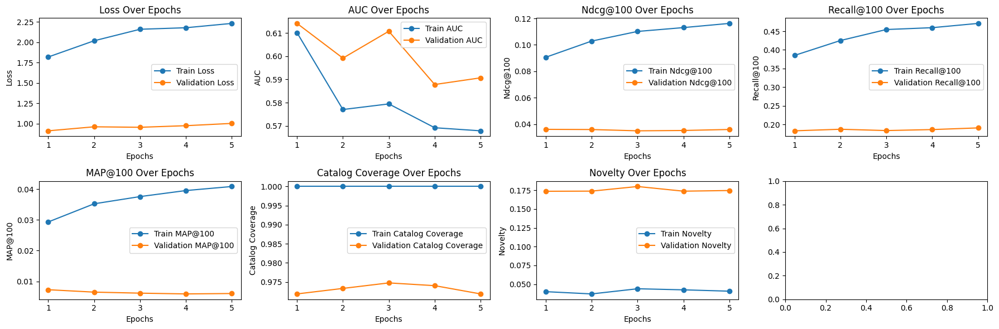

In [86]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


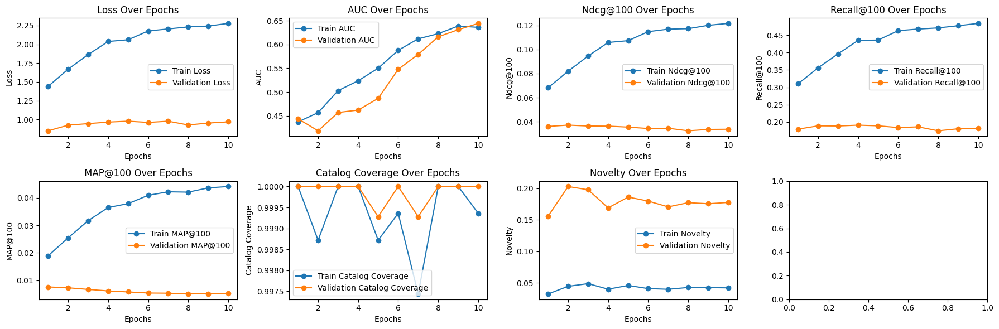

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


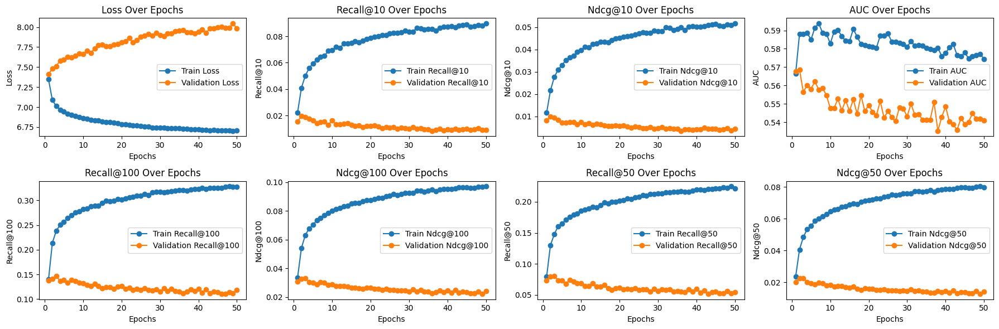

In [87]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v107

In [88]:
VERSION = 'v107'

_tower_dim = {
    'user':[256, 256],
    'item':[256, 256],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 4 # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [89]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [90]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [91]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [92]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 48s 941ms/step - loss: 7.3575 - auc: 0.6018 - recall_at_100: 0.1028 - mrr_at_100: 0.0077 - ndcg_at_100: 0.0238 - map_at_100: 0.0077 - precision_at_100: 0.0010 - recall_at_50: 0.0577 - mrr_at_50: 0.0071 - ndcg_at_50: 0.0166 - map_at_50: 0.0071 - precision_at_50: 0.0012 - recall_at_10: 0.0146 - mrr_at_10: 0.0054 - ndcg_at_10: 0.0075 - map_at_10: 0.0054 - precision_at_10: 0.0015 - regularization_loss: 0.0000e+00 - loss_batch: 7.2844 - val_loss: 7.4159 - val_auc: 0.6478 - val_recall_at_100: 0.1482 - val_mrr_at_100: 0.0102 - val_ndcg_at_100: 0.0333 - val_map_at_100: 0.0102 - val_precision_at_100: 0.0015 - val_recall_at_50: 0.0788 - val_mrr_at_50: 0.0092 - val_ndcg_at_50: 0.0221 - val_map_at_50: 0.0092 - val_precision_at_50: 0.0016 - val_recall_at_10: 0.0169 - val_mrr_at_10: 0.0067 - val_ndcg_at_10: 0.0090 - val_map_at_10: 0.0067 - val_precision_at_10: 0.0017 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.4698
Epoch 2/50
35/35 [=

69/69 [==============================] - 7s 25ms/step - loss: 1.9306 - auc: 0.5480 - recall_at_100: 0.4053 - mrr_at_100: 0.0317 - ndcg_at_100: 0.0962 - map_at_100: 0.0317 - precision_at_100: 0.0041 - recall_at_10: 0.0686 - mrr_at_10: 0.0220 - ndcg_at_10: 0.0327 - map_at_10: 0.0220 - precision_at_10: 0.0069 - regularization_loss: 0.0000e+00 - loss_batch: 1.9436
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9305946826934814, 'auc': 0.5479639172554016, 'recall_at_100': 0.40725335478782654, 'mrr_at_100': 0.0317697674036026, 'ndcg_at_100': 0.09664570540189743, 'map_at_100': 0.0317697674036026, 'precision_at_100': 0.004072532989084721, 'recall_at_10': 0.06840261071920395, 'mrr_at_10': 0.022009611129760742, 'ndcg_at_10': 0.03266080468893051, 'map_at_10': 0.022009611129760742, 'precision_at_10': 0.006840262562036514, 'regularization_loss': 0.0, 'loss_batch': 2.560892343521118, 'coverage': 1.0, 'novelty': 0.040998217468805706}
Candidate set rows: 1387


15/15 [==============================] - 5s 36ms/step - loss: 0.9368 - auc: 0.5480 - recall_at_100: 0.1792 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0340 - map_at_100: 0.0058 - precision_at_100: 0.0018 - recall_at_10: 0.0093 - mrr_at_10: 0.0018 - ndcg_at_10: 0.0035 - map_at_10: 0.0018 - precision_at_10: 9.2511e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9812
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9367775917053223, 'auc': 0.5480456352233887, 'recall_at_100': 0.18490035831928253, 'mrr_at_100': 0.00619478477165103, 'ndcg_at_100': 0.03530193120241165, 'map_at_100': 0.00619478477165103, 'precision_at_100': 0.0018490036018192768, 'recall_at_10': 0.010097633115947247, 'mrr_at_10': 0.002048291964456439, 'ndcg_at_10': 0.003844487713649869, 'map_at_10': 0.002048291964456439, 'precision_at_10': 0.001009763334877789, 'regularization_loss': 0.0, 'loss_batch': 1.4456461668014526, 'coverage': 0.9726027397260274, 'novelty': 0.1823631792690002}
35/35 [==============

69/69 [==============================] - 5s 21ms/step - loss: 2.1461 - auc: 0.5410 - recall_at_100: 0.4491 - mrr_at_100: 0.0369 - ndcg_at_100: 0.1088 - map_at_100: 0.0369 - precision_at_100: 0.0045 - recall_at_10: 0.0819 - mrr_at_10: 0.0259 - ndcg_at_10: 0.0388 - map_at_10: 0.0259 - precision_at_10: 0.0082 - regularization_loss: 0.0000e+00 - loss_batch: 2.1609
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.1461308002471924, 'auc': 0.5410433411598206, 'recall_at_100': 0.4525512158870697, 'mrr_at_100': 0.03770039975643158, 'ndcg_at_100': 0.10999850928783417, 'map_at_100': 0.03770039975643158, 'precision_at_100': 0.004525512456893921, 'recall_at_10': 0.0828893780708313, 'mrr_at_10': 0.026699461042881012, 'ndcg_at_10': 0.03959659859538078, 'map_at_10': 0.026699461042881012, 'precision_at_10': 0.00828893855214119, 'regularization_loss': 0.0, 'loss_batch': 2.860731363296509, 'coverage': 1.0, 'novelty': 0.03623578235474946}
Candidate set rows: 1387


15/15 [==============================] - 4s 37ms/step - loss: 0.9972 - auc: 0.5491 - recall_at_100: 0.1869 - mrr_at_100: 0.0061 - ndcg_at_100: 0.0354 - map_at_100: 0.0061 - precision_at_100: 0.0019 - recall_at_10: 0.0078 - mrr_at_10: 0.0019 - ndcg_at_10: 0.0032 - map_at_10: 0.0019 - precision_at_10: 7.8003e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0309
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9972342848777771, 'auc': 0.5490928292274475, 'recall_at_100': 0.1940617859363556, 'mrr_at_100': 0.006626204587519169, 'ndcg_at_100': 0.03707510605454445, 'map_at_100': 0.006626204587519169, 'precision_at_100': 0.0019406178034842014, 'recall_at_10': 0.00936204381287098, 'mrr_at_10': 0.002252038801088929, 'ndcg_at_10': 0.0038668415509164333, 'map_at_10': 0.002252038801088929, 'precision_at_10': 0.0009362043347209692, 'regularization_loss': 0.0, 'loss_batch': 1.3825037479400635, 'coverage': 0.9726027397260274, 'novelty': 0.15716666666666668}
35/35 [===========

69/69 [==============================] - 6s 20ms/step - loss: 2.2692 - auc: 0.5488 - recall_at_100: 0.4719 - mrr_at_100: 0.0389 - ndcg_at_100: 0.1145 - map_at_100: 0.0389 - precision_at_100: 0.0047 - recall_at_10: 0.0860 - mrr_at_10: 0.0274 - ndcg_at_10: 0.0409 - map_at_10: 0.0274 - precision_at_10: 0.0086 - regularization_loss: 0.0000e+00 - loss_batch: 2.2856
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.269225597381592, 'auc': 0.5487617254257202, 'recall_at_100': 0.4752001464366913, 'mrr_at_100': 0.039882954210042953, 'ndcg_at_100': 0.11586269736289978, 'map_at_100': 0.039882954210042953, 'precision_at_100': 0.004752000793814659, 'recall_at_10': 0.08720549196004868, 'mrr_at_10': 0.028262125328183174, 'ndcg_at_10': 0.041808824986219406, 'map_at_10': 0.028262125328183174, 'precision_at_10': 0.008720549754798412, 'regularization_loss': 0.0, 'loss_batch': 3.0627706050872803, 'coverage': 1.0, 'novelty': 0.03756223859788887}
Candidate set rows: 1387


15/15 [==============================] - 5s 24ms/step - loss: 0.9582 - auc: 0.5469 - recall_at_100: 0.1773 - mrr_at_100: 0.0054 - ndcg_at_100: 0.0331 - map_at_100: 0.0054 - precision_at_100: 0.0018 - recall_at_10: 0.0082 - mrr_at_10: 0.0016 - ndcg_at_10: 0.0031 - map_at_10: 0.0016 - precision_at_10: 8.1830e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9941
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9582093358039856, 'auc': 0.5468599796295166, 'recall_at_100': 0.18062056601047516, 'mrr_at_100': 0.005531826987862587, 'ndcg_at_100': 0.033768199384212494, 'map_at_100': 0.005531826987862587, 'precision_at_100': 0.001806205720640719, 'recall_at_10': 0.008559582754969597, 'mrr_at_10': 0.001665928983129561, 'ndcg_at_10': 0.003202918916940689, 'map_at_10': 0.001665928983129561, 'precision_at_10': 0.0008559582056477666, 'regularization_loss': 0.0, 'loss_batch': 1.3698397874832153, 'coverage': 0.9754866618601298, 'novelty': 0.16474493361285814}
35/35 [==========

69/69 [==============================] - 5s 21ms/step - loss: 2.2676 - auc: 0.5241 - recall_at_100: 0.4714 - mrr_at_100: 0.0398 - ndcg_at_100: 0.1153 - map_at_100: 0.0398 - precision_at_100: 0.0047 - recall_at_10: 0.0872 - mrr_at_10: 0.0281 - ndcg_at_10: 0.0417 - map_at_10: 0.0281 - precision_at_10: 0.0087 - regularization_loss: 0.0000e+00 - loss_batch: 2.2844
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.2675905227661133, 'auc': 0.5240845680236816, 'recall_at_100': 0.4733056128025055, 'mrr_at_100': 0.04044929891824722, 'ndcg_at_100': 0.11616934835910797, 'map_at_100': 0.04044929891824722, 'precision_at_100': 0.004733055364340544, 'recall_at_10': 0.08850175142288208, 'mrr_at_10': 0.028805969282984734, 'ndcg_at_10': 0.04252830147743225, 'map_at_10': 0.028805969282984734, 'precision_at_10': 0.008850174956023693, 'regularization_loss': 0.0, 'loss_batch': 3.0847582817077637, 'coverage': 1.0, 'novelty': 0.04017381672559963}
Candidate set rows: 1387


15/15 [==============================] - 4s 33ms/step - loss: 0.9406 - auc: 0.5082 - recall_at_100: 0.1712 - mrr_at_100: 0.0052 - ndcg_at_100: 0.0319 - map_at_100: 0.0052 - precision_at_100: 0.0017 - recall_at_10: 0.0062 - mrr_at_10: 0.0014 - ndcg_at_10: 0.0024 - map_at_10: 0.0014 - precision_at_10: 6.2053e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9853
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.940649151802063, 'auc': 0.5081996917724609, 'recall_at_100': 0.17587268352508545, 'mrr_at_100': 0.005492089781910181, 'ndcg_at_100': 0.03297252953052521, 'map_at_100': 0.005492089781910181, 'precision_at_100': 0.0017587266629561782, 'recall_at_10': 0.007355891168117523, 'mrr_at_10': 0.001646318705752492, 'ndcg_at_10': 0.002921120263636112, 'map_at_10': 0.001646318705752492, 'precision_at_10': 0.0007355891284532845, 'regularization_loss': 0.0, 'loss_batch': 1.4516630172729492, 'coverage': 0.9747656813266041, 'novelty': 0.17009379509379507}
35/35 [===========

69/69 [==============================] - 8s 31ms/step - loss: 2.3248 - auc: 0.5296 - recall_at_100: 0.4860 - mrr_at_100: 0.0412 - ndcg_at_100: 0.1191 - map_at_100: 0.0412 - precision_at_100: 0.0049 - recall_at_10: 0.0920 - mrr_at_10: 0.0292 - ndcg_at_10: 0.0436 - map_at_10: 0.0292 - precision_at_10: 0.0092 - regularization_loss: 0.0000e+00 - loss_batch: 2.3398
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.324758768081665, 'auc': 0.5296257138252258, 'recall_at_100': 0.4856129586696625, 'mrr_at_100': 0.04185697063803673, 'ndcg_at_100': 0.11969403922557831, 'map_at_100': 0.04185697063803673, 'precision_at_100': 0.004856129642575979, 'recall_at_10': 0.09355858713388443, 'mrr_at_10': 0.029888475313782692, 'ndcg_at_10': 0.0445096530020237, 'map_at_10': 0.029888475313782692, 'precision_at_10': 0.009355860762298107, 'regularization_loss': 0.0, 'loss_batch': 3.0521292686462402, 'coverage': 1.0, 'novelty': 0.039681871738764515}
Candidate set rows: 1387


15/15 [==============================] - 5s 34ms/step - loss: 0.9374 - auc: 0.5193 - recall_at_100: 0.1750 - mrr_at_100: 0.0050 - ndcg_at_100: 0.0323 - map_at_100: 0.0050 - precision_at_100: 0.0017 - recall_at_10: 0.0069 - mrr_at_10: 0.0013 - ndcg_at_10: 0.0026 - map_at_10: 0.0013 - precision_at_10: 6.8980e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9808
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9373899102210999, 'auc': 0.5192545652389526, 'recall_at_100': 0.17400026321411133, 'mrr_at_100': 0.005119600333273411, 'ndcg_at_100': 0.03227821737527847, 'map_at_100': 0.005119600333273411, 'precision_at_100': 0.0017400026554241776, 'recall_at_10': 0.006486558821052313, 'mrr_at_10': 0.0013368246145546436, 'ndcg_at_10': 0.002489697653800249, 'map_at_10': 0.0013368246145546436, 'precision_at_10': 0.0006486558704636991, 'regularization_loss': 0.0, 'loss_batch': 1.4346753358840942, 'coverage': 0.976928622927181, 'novelty': 0.17376082550211902}
35/35 [=========

#### analysis

In [93]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v107


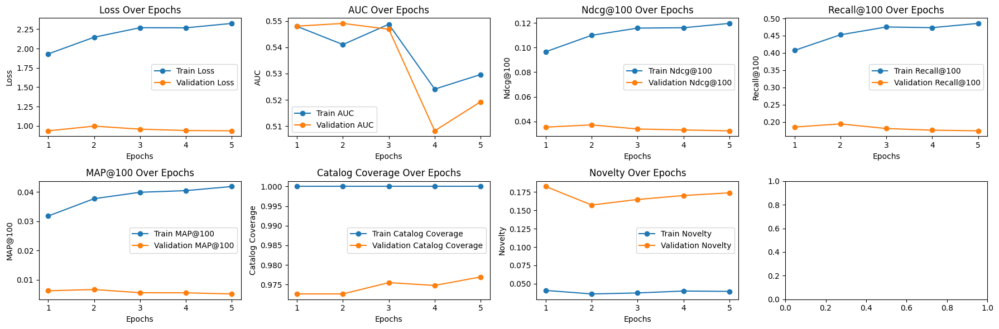

In [94]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


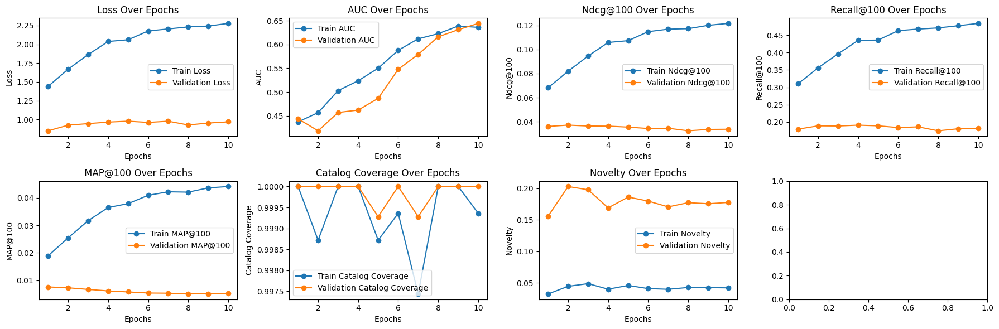

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


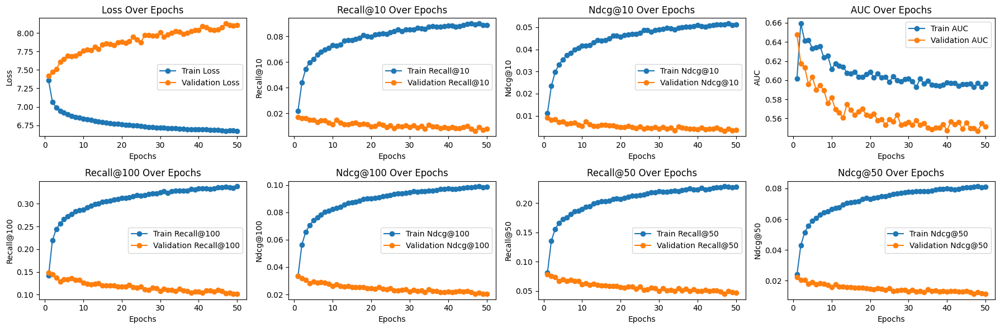

In [95]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v200

In [36]:
VERSION = 'v108'

_tower_dim = {
    'user':[128, 256],
    'item':[256, 256],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 2 # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [37]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [38]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [39]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [40]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 37s 526ms/step - loss: 7.5183 - auc: 0.5488 - recall_at_100: 0.0705 - mrr_at_100: 0.0049 - ndcg_at_100: 0.0158 - map_at_100: 0.0049 - precision_at_100: 7.0460e-04 - recall_at_50: 0.0361 - mrr_at_50: 0.0044 - ndcg_at_50: 0.0103 - map_at_50: 0.0044 - precision_at_50: 7.2197e-04 - recall_at_10: 0.0082 - mrr_at_10: 0.0033 - ndcg_at_10: 0.0044 - map_at_10: 0.0033 - precision_at_10: 8.1776e-04 - regularization_loss: 0.0000e+00 - loss_batch: 7.4526 - val_loss: 7.4203 - val_auc: 0.5903 - val_recall_at_100: 0.1107 - val_mrr_at_100: 0.0077 - val_ndcg_at_100: 0.0250 - val_map_at_100: 0.0077 - val_precision_at_100: 0.0011 - val_recall_at_50: 0.0603 - val_mrr_at_50: 0.0070 - val_ndcg_at_50: 0.0169 - val_map_at_50: 0.0070 - val_precision_at_50: 0.0012 - val_recall_at_10: 0.0137 - val_mrr_at_10: 0.0051 - val_ndcg_at_10: 0.0071 - val_map_at_10: 0.0051 - val_precision_at_10: 0.0014 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.2405
Epoch 2

69/69 [==============================] - 5s 20ms/step - loss: 1.4186 - auc: 0.5624 - recall_at_100: 0.3046 - mrr_at_100: 0.0198 - ndcg_at_100: 0.0683 - map_at_100: 0.0198 - precision_at_100: 0.0030 - recall_at_10: 0.0408 - mrr_at_10: 0.0125 - ndcg_at_10: 0.0190 - map_at_10: 0.0125 - precision_at_10: 0.0041 - regularization_loss: 0.0000e+00 - loss_batch: 1.4314
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.418557047843933, 'auc': 0.5624016523361206, 'recall_at_100': 0.30627331137657166, 'mrr_at_100': 0.019404655322432518, 'ndcg_at_100': 0.0681585893034935, 'map_at_100': 0.019404655322432518, 'precision_at_100': 0.003062732517719269, 'recall_at_10': 0.04054015502333641, 'mrr_at_10': 0.012100736610591412, 'ndcg_at_10': 0.018600337207317352, 'map_at_10': 0.012100736610591412, 'precision_at_10': 0.004054015967994928, 'regularization_loss': 0.0, 'loss_batch': 2.0428783893585205, 'coverage': 0.9961563100576554, 'novelty': 0.033144704931285365}
Candidate set rows: 1387


15/15 [==============================] - 3s 22ms/step - loss: 0.8624 - auc: 0.5460 - recall_at_100: 0.1762 - mrr_at_100: 0.0076 - ndcg_at_100: 0.0355 - map_at_100: 0.0076 - precision_at_100: 0.0018 - recall_at_10: 0.0144 - mrr_at_10: 0.0036 - ndcg_at_10: 0.0061 - map_at_10: 0.0036 - precision_at_10: 0.0014 - regularization_loss: 0.0000e+00 - loss_batch: 0.9169
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.8624467253684998, 'auc': 0.5460000038146973, 'recall_at_100': 0.18148989975452423, 'mrr_at_100': 0.007864647544920444, 'ndcg_at_100': 0.03650147095322609, 'map_at_100': 0.007864647544920444, 'precision_at_100': 0.0018148991512134671, 'recall_at_10': 0.014377424493432045, 'mrr_at_10': 0.003718520049005747, 'ndcg_at_10': 0.00614030659198761, 'map_at_10': 0.003718520049005747, 'precision_at_10': 0.0014377422630786896, 'regularization_loss': 0.0, 'loss_batch': 1.4858778715133667, 'coverage': 0.9834174477289113, 'novelty': 0.15502219299687656}
35/35 [===============

69/69 [==============================] - 6s 20ms/step - loss: 1.6757 - auc: 0.5927 - recall_at_100: 0.3595 - mrr_at_100: 0.0261 - ndcg_at_100: 0.0835 - map_at_100: 0.0261 - precision_at_100: 0.0036 - recall_at_10: 0.0575 - mrr_at_10: 0.0175 - ndcg_at_10: 0.0266 - map_at_10: 0.0175 - precision_at_10: 0.0057 - regularization_loss: 0.0000e+00 - loss_batch: 1.6864
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.6757363080978394, 'auc': 0.5926595330238342, 'recall_at_100': 0.3611293137073517, 'mrr_at_100': 0.02654239349067211, 'ndcg_at_100': 0.08421371132135391, 'map_at_100': 0.02654239349067211, 'precision_at_100': 0.003611292690038681, 'recall_at_10': 0.05757670849561691, 'mrr_at_10': 0.017824389040470123, 'ndcg_at_10': 0.026943694800138474, 'map_at_10': 0.017824389040470123, 'precision_at_10': 0.005757671315222979, 'regularization_loss': 0.0, 'loss_batch': 2.1949644088745117, 'coverage': 0.9993593850096092, 'novelty': 0.03604051213453086}
Candidate set rows: 1387


15/15 [==============================] - 3s 22ms/step - loss: 0.9782 - auc: 0.5829 - recall_at_100: 0.1921 - mrr_at_100: 0.0073 - ndcg_at_100: 0.0376 - map_at_100: 0.0073 - precision_at_100: 0.0019 - recall_at_10: 0.0120 - mrr_at_10: 0.0028 - ndcg_at_10: 0.0049 - map_at_10: 0.0028 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 1.0302
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9781787395477295, 'auc': 0.5828624963760376, 'recall_at_100': 0.20101645588874817, 'mrr_at_100': 0.007846634835004807, 'ndcg_at_100': 0.039573512971401215, 'map_at_100': 0.007846634835004807, 'precision_at_100': 0.002010164549574256, 'recall_at_10': 0.012839374132454395, 'mrr_at_10': 0.003171498654410243, 'ndcg_at_10': 0.005369485821574926, 'map_at_10': 0.003171498654410243, 'precision_at_10': 0.0012839374830946326, 'regularization_loss': 0.0, 'loss_batch': 1.57393217086792, 'coverage': 0.9754866618601298, 'novelty': 0.1580623533355682}
35/35 [=================

69/69 [==============================] - 6s 20ms/step - loss: 1.8048 - auc: 0.6018 - recall_at_100: 0.3857 - mrr_at_100: 0.0291 - ndcg_at_100: 0.0906 - map_at_100: 0.0291 - precision_at_100: 0.0039 - recall_at_10: 0.0626 - mrr_at_10: 0.0198 - ndcg_at_10: 0.0296 - map_at_10: 0.0198 - precision_at_10: 0.0063 - regularization_loss: 0.0000e+00 - loss_batch: 1.8165
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.8048189878463745, 'auc': 0.6018266677856445, 'recall_at_100': 0.38487508893013, 'mrr_at_100': 0.029395446181297302, 'ndcg_at_100': 0.09071733057498932, 'map_at_100': 0.029395446181297302, 'precision_at_100': 0.0038487499114125967, 'recall_at_10': 0.062505342066288, 'mrr_at_10': 0.020107604563236237, 'ndcg_at_10': 0.02983276918530464, 'map_at_10': 0.020107604563236237, 'precision_at_10': 0.006250533740967512, 'regularization_loss': 0.0, 'loss_batch': 2.3724851608276367, 'coverage': 0.9993593850096092, 'novelty': 0.03923934753661784}
Candidate set rows: 1387


15/15 [==============================] - 4s 24ms/step - loss: 0.9544 - auc: 0.5931 - recall_at_100: 0.1873 - mrr_at_100: 0.0065 - ndcg_at_100: 0.0359 - map_at_100: 0.0065 - precision_at_100: 0.0019 - recall_at_10: 0.0106 - mrr_at_10: 0.0024 - ndcg_at_10: 0.0042 - map_at_10: 0.0024 - precision_at_10: 0.0011 - regularization_loss: 0.0000e+00 - loss_batch: 1.0030
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9543774724006653, 'auc': 0.5930537581443787, 'recall_at_100': 0.19111943244934082, 'mrr_at_100': 0.0068368022330105305, 'ndcg_at_100': 0.03687730431556702, 'map_at_100': 0.0068368022330105305, 'precision_at_100': 0.0019111941801384091, 'recall_at_10': 0.01083322148770094, 'mrr_at_10': 0.0025150941219180822, 'ndcg_at_10': 0.00439572986215353, 'map_at_10': 0.0025150941219180822, 'precision_at_10': 0.0010833221022039652, 'regularization_loss': 0.0, 'loss_batch': 1.5119962692260742, 'coverage': 0.9754866618601298, 'novelty': 0.16854334226988382}
35/35 [============

69/69 [==============================] - 7s 33ms/step - loss: 1.8671 - auc: 0.5789 - recall_at_100: 0.3965 - mrr_at_100: 0.0321 - ndcg_at_100: 0.0953 - map_at_100: 0.0321 - precision_at_100: 0.0040 - recall_at_10: 0.0690 - mrr_at_10: 0.0225 - ndcg_at_10: 0.0332 - map_at_10: 0.0225 - precision_at_10: 0.0069 - regularization_loss: 0.0000e+00 - loss_batch: 1.8783
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.8671164512634277, 'auc': 0.5789436101913452, 'recall_at_100': 0.398549884557724, 'mrr_at_100': 0.03203151002526283, 'ndcg_at_100': 0.09561485797166824, 'map_at_100': 0.03203151002526283, 'precision_at_100': 0.00398549810051918, 'recall_at_10': 0.06964188814163208, 'mrr_at_10': 0.022404903545975685, 'ndcg_at_10': 0.033242613077163696, 'map_at_10': 0.022404903545975685, 'precision_at_10': 0.006964188534766436, 'regularization_loss': 0.0, 'loss_batch': 2.411726951599121, 'coverage': 1.0, 'novelty': 0.04197640774538171}
Candidate set rows: 1387


15/15 [==============================] - 5s 35ms/step - loss: 0.9601 - auc: 0.5771 - recall_at_100: 0.1822 - mrr_at_100: 0.0059 - ndcg_at_100: 0.0345 - map_at_100: 0.0059 - precision_at_100: 0.0018 - recall_at_10: 0.0093 - mrr_at_10: 0.0019 - ndcg_at_10: 0.0035 - map_at_10: 0.0019 - precision_at_10: 9.3246e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0030
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9601083993911743, 'auc': 0.5770919919013977, 'recall_at_100': 0.19111943244934082, 'mrr_at_100': 0.006531554274260998, 'ndcg_at_100': 0.03661138936877251, 'map_at_100': 0.006531554274260998, 'precision_at_100': 0.001911194296553731, 'recall_at_10': 0.010565734468400478, 'mrr_at_10': 0.002226351061835885, 'ndcg_at_10': 0.00410159258171916, 'map_at_10': 0.002226351061835885, 'precision_at_10': 0.0010565734701231122, 'regularization_loss': 0.0, 'loss_batch': 1.4510602951049805, 'coverage': 0.9726027397260274, 'novelty': 0.18367744448772885}
35/35 [============

69/69 [==============================] - 6s 31ms/step - loss: 1.9426 - auc: 0.5639 - recall_at_100: 0.4138 - mrr_at_100: 0.0331 - ndcg_at_100: 0.0992 - map_at_100: 0.0331 - precision_at_100: 0.0041 - recall_at_10: 0.0734 - mrr_at_10: 0.0232 - ndcg_at_10: 0.0347 - map_at_10: 0.0232 - precision_at_10: 0.0073 - regularization_loss: 0.0000e+00 - loss_batch: 1.9552
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.942596435546875, 'auc': 0.5639327168464661, 'recall_at_100': 0.4141477346420288, 'mrr_at_100': 0.034013960510492325, 'ndcg_at_100': 0.10003151744604111, 'map_at_100': 0.034013960510492325, 'precision_at_100': 0.00414147786796093, 'recall_at_10': 0.07405772060155869, 'mrr_at_10': 0.024052882567048073, 'ndcg_at_10': 0.035535819828510284, 'map_at_10': 0.024052882567048073, 'precision_at_10': 0.007405772339552641, 'regularization_loss': 0.0, 'loss_batch': 2.5546534061431885, 'coverage': 1.0, 'novelty': 0.04003396306516663}
Candidate set rows: 1387


15/15 [==============================] - 3s 34ms/step - loss: 0.9582 - auc: 0.5697 - recall_at_100: 0.1857 - mrr_at_100: 0.0066 - ndcg_at_100: 0.0358 - map_at_100: 0.0066 - precision_at_100: 0.0019 - recall_at_10: 0.0104 - mrr_at_10: 0.0025 - ndcg_at_10: 0.0043 - map_at_10: 0.0025 - precision_at_10: 0.0010 - regularization_loss: 0.0000e+00 - loss_batch: 0.9968
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.958172619342804, 'auc': 0.5697130560874939, 'recall_at_100': 0.18964825570583344, 'mrr_at_100': 0.006599116139113903, 'ndcg_at_100': 0.03647632524371147, 'map_at_100': 0.006599116139113903, 'precision_at_100': 0.001896482426673174, 'recall_at_10': 0.010498863644897938, 'mrr_at_10': 0.0022981585934758186, 'ndcg_at_10': 0.004133777692914009, 'map_at_10': 0.0022981585934758186, 'precision_at_10': 0.0010498863412067294, 'regularization_loss': 0.0, 'loss_batch': 1.4002630710601807, 'coverage': 0.9718817591925017, 'novelty': 0.17547450688500185}
35/35 [==============

#### analysis

In [41]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v108


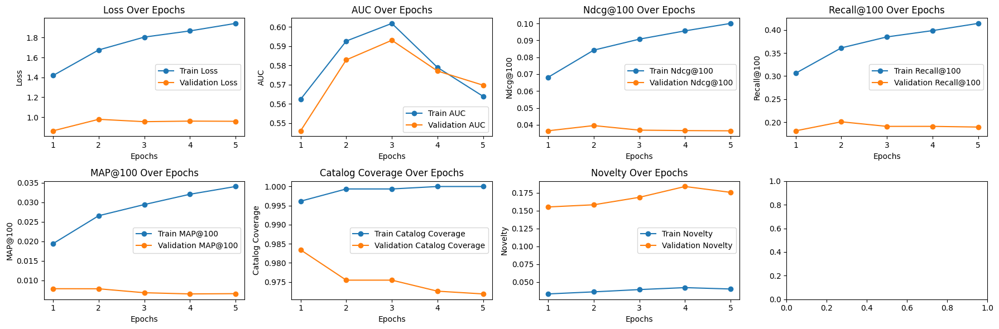

In [42]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


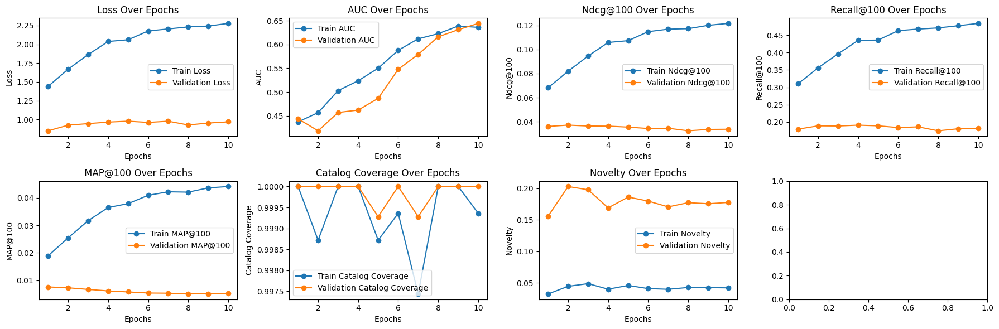

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


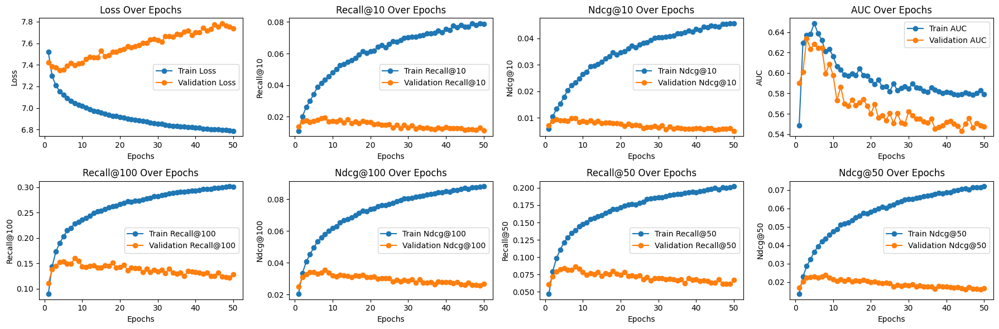

In [43]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v201

In [44]:
VERSION = 'v201'

_tower_dim = {
    'user':[128, 256],
    'item':[256, 256],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [45]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [46]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [47]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [48]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 33s 463ms/step - loss: 7.4236 - auc: 0.5550 - recall_at_100: 0.0866 - mrr_at_100: 0.0066 - ndcg_at_100: 0.0200 - map_at_100: 0.0066 - precision_at_100: 8.6617e-04 - recall_at_50: 0.0458 - mrr_at_50: 0.0060 - ndcg_at_50: 0.0134 - map_at_50: 0.0060 - precision_at_50: 9.1663e-04 - recall_at_10: 0.0118 - mrr_at_10: 0.0046 - ndcg_at_10: 0.0063 - map_at_10: 0.0046 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 7.3532 - val_loss: 7.3949 - val_auc: 0.5865 - val_recall_at_100: 0.1397 - val_mrr_at_100: 0.0099 - val_ndcg_at_100: 0.0316 - val_map_at_100: 0.0099 - val_precision_at_100: 0.0014 - val_recall_at_50: 0.0734 - val_mrr_at_50: 0.0090 - val_ndcg_at_50: 0.0209 - val_map_at_50: 0.0090 - val_precision_at_50: 0.0015 - val_recall_at_10: 0.0182 - val_mrr_at_10: 0.0069 - val_ndcg_at_10: 0.0094 - val_map_at_10: 0.0069 - val_precision_at_10: 0.0018 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.4553
Epoch 2/50


69/69 [==============================] - 6s 31ms/step - loss: 1.6833 - auc: 0.5945 - recall_at_100: 0.3550 - mrr_at_100: 0.0250 - ndcg_at_100: 0.0815 - map_at_100: 0.0250 - precision_at_100: 0.0036 - recall_at_10: 0.0518 - mrr_at_10: 0.0164 - ndcg_at_10: 0.0245 - map_at_10: 0.0164 - precision_at_10: 0.0052 - regularization_loss: 0.0000e+00 - loss_batch: 1.6926
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.6832797527313232, 'auc': 0.594485342502594, 'recall_at_100': 0.3603886067867279, 'mrr_at_100': 0.025883303955197334, 'ndcg_at_100': 0.08321888744831085, 'map_at_100': 0.025883303955197334, 'precision_at_100': 0.003603885881602764, 'recall_at_10': 0.05405828729271889, 'mrr_at_10': 0.017245573922991753, 'ndcg_at_10': 0.025693368166685104, 'map_at_10': 0.017245573922991753, 'precision_at_10': 0.005405828356742859, 'regularization_loss': 0.0, 'loss_batch': 2.135418653488159, 'coverage': 1.0, 'novelty': 0.03696444670926267}
Candidate set rows: 1387


15/15 [==============================] - 6s 31ms/step - loss: 0.9163 - auc: 0.5980 - recall_at_100: 0.1843 - mrr_at_100: 0.0079 - ndcg_at_100: 0.0368 - map_at_100: 0.0079 - precision_at_100: 0.0018 - recall_at_10: 0.0140 - mrr_at_10: 0.0037 - ndcg_at_10: 0.0060 - map_at_10: 0.0037 - precision_at_10: 0.0014 - regularization_loss: 0.0000e+00 - loss_batch: 0.9655
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9163040518760681, 'auc': 0.5980458855628967, 'recall_at_100': 0.18704025447368622, 'mrr_at_100': 0.007653333246707916, 'ndcg_at_100': 0.03701738640666008, 'map_at_100': 0.007653333246707916, 'precision_at_100': 0.0018704024842008948, 'recall_at_10': 0.01250501535832882, 'mrr_at_10': 0.003426141804084182, 'ndcg_at_10': 0.005484933033585548, 'map_at_10': 0.003426141804084182, 'precision_at_10': 0.0012505014892667532, 'regularization_loss': 0.0, 'loss_batch': 1.479451298713684, 'coverage': 0.9726027397260274, 'novelty': 0.16454370964927587}
35/35 [================

69/69 [==============================] - 5s 20ms/step - loss: 1.7837 - auc: 0.5547 - recall_at_100: 0.3772 - mrr_at_100: 0.0289 - ndcg_at_100: 0.0891 - map_at_100: 0.0289 - precision_at_100: 0.0038 - recall_at_10: 0.0628 - mrr_at_10: 0.0199 - ndcg_at_10: 0.0298 - map_at_10: 0.0199 - precision_at_10: 0.0063 - regularization_loss: 0.0000e+00 - loss_batch: 1.7954
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.783653974533081, 'auc': 0.5547440052032471, 'recall_at_100': 0.37876415252685547, 'mrr_at_100': 0.029355961829423904, 'ndcg_at_100': 0.08966098725795746, 'map_at_100': 0.029355961829423904, 'precision_at_100': 0.0037876416463404894, 'recall_at_10': 0.06253383308649063, 'mrr_at_10': 0.02025633119046688, 'ndcg_at_10': 0.029967021197080612, 'map_at_10': 0.02025633119046688, 'precision_at_10': 0.006253382656723261, 'regularization_loss': 0.0, 'loss_batch': 2.354343891143799, 'coverage': 1.0, 'novelty': 0.04506786465303001}
Candidate set rows: 1387


15/15 [==============================] - 3s 22ms/step - loss: 0.9187 - auc: 0.5499 - recall_at_100: 0.1827 - mrr_at_100: 0.0072 - ndcg_at_100: 0.0358 - map_at_100: 0.0072 - precision_at_100: 0.0018 - recall_at_10: 0.0124 - mrr_at_10: 0.0032 - ndcg_at_10: 0.0053 - map_at_10: 0.0032 - precision_at_10: 0.0012 - regularization_loss: 0.0000e+00 - loss_batch: 0.9726
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.918662965297699, 'auc': 0.5498551726341248, 'recall_at_100': 0.18349605798721313, 'mrr_at_100': 0.007552781607955694, 'ndcg_at_100': 0.036301326006650925, 'map_at_100': 0.007552781607955694, 'precision_at_100': 0.0018349604215472937, 'recall_at_10': 0.012973117642104626, 'mrr_at_10': 0.003523742314428091, 'ndcg_at_10': 0.005664417985826731, 'map_at_10': 0.003523742314428091, 'precision_at_10': 0.0012973117409273982, 'regularization_loss': 0.0, 'loss_batch': 1.537164330482483, 'coverage': 0.9711607786589762, 'novelty': 0.18493822318101588}
35/35 [===============

69/69 [==============================] - 5s 20ms/step - loss: 1.9739 - auc: 0.5296 - recall_at_100: 0.4174 - mrr_at_100: 0.0336 - ndcg_at_100: 0.1001 - map_at_100: 0.0336 - precision_at_100: 0.0042 - recall_at_10: 0.0731 - mrr_at_10: 0.0235 - ndcg_at_10: 0.0349 - map_at_10: 0.0235 - precision_at_10: 0.0073 - regularization_loss: 0.0000e+00 - loss_batch: 1.9882
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.973937749862671, 'auc': 0.5296303033828735, 'recall_at_100': 0.4199168086051941, 'mrr_at_100': 0.034468404948711395, 'ndcg_at_100': 0.10142289102077484, 'map_at_100': 0.034468404948711395, 'precision_at_100': 0.004199167713522911, 'recall_at_10': 0.07519728690385818, 'mrr_at_10': 0.02436750940978527, 'ndcg_at_10': 0.036029040813446045, 'map_at_10': 0.02436750940978527, 'precision_at_10': 0.007519728969782591, 'regularization_loss': 0.0, 'loss_batch': 2.6662986278533936, 'coverage': 1.0, 'novelty': 0.03864595713290439}
Candidate set rows: 1387


15/15 [==============================] - 3s 23ms/step - loss: 0.9504 - auc: 0.5338 - recall_at_100: 0.1834 - mrr_at_100: 0.0064 - ndcg_at_100: 0.0352 - map_at_100: 0.0064 - precision_at_100: 0.0018 - recall_at_10: 0.0099 - mrr_at_10: 0.0023 - ndcg_at_10: 0.0040 - map_at_10: 0.0023 - precision_at_10: 9.9033e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9901
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9504324793815613, 'auc': 0.5338054299354553, 'recall_at_100': 0.18690651655197144, 'mrr_at_100': 0.0066298143938183784, 'ndcg_at_100': 0.036007244139909744, 'map_at_100': 0.0066298143938183784, 'precision_at_100': 0.0018690648721531034, 'recall_at_10': 0.010097633115947247, 'mrr_at_10': 0.002412769477814436, 'ndcg_at_10': 0.004141709301620722, 'map_at_10': 0.002412769477814436, 'precision_at_10': 0.001009763334877789, 'regularization_loss': 0.0, 'loss_batch': 1.404357671737671, 'coverage': 0.9704397981254506, 'novelty': 0.1816255778120185}
35/35 [==========

69/69 [==============================] - 7s 21ms/step - loss: 2.0766 - auc: 0.5329 - recall_at_100: 0.4380 - mrr_at_100: 0.0356 - ndcg_at_100: 0.1055 - map_at_100: 0.0356 - precision_at_100: 0.0044 - recall_at_10: 0.0773 - mrr_at_10: 0.0249 - ndcg_at_10: 0.0369 - map_at_10: 0.0249 - precision_at_10: 0.0077 - regularization_loss: 0.0000e+00 - loss_batch: 2.0912
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.0765938758850098, 'auc': 0.5328536033630371, 'recall_at_100': 0.4373237192630768, 'mrr_at_100': 0.035749103873968124, 'ndcg_at_100': 0.10551205277442932, 'map_at_100': 0.035749103873968124, 'precision_at_100': 0.004373237956315279, 'recall_at_10': 0.07704908400774002, 'mrr_at_10': 0.025116823613643646, 'ndcg_at_10': 0.03703755885362625, 'map_at_10': 0.025116823613643646, 'precision_at_10': 0.007704907096922398, 'regularization_loss': 0.0, 'loss_batch': 2.7836244106292725, 'coverage': 1.0, 'novelty': 0.039981344865598234}
Candidate set rows: 1387


15/15 [==============================] - 4s 25ms/step - loss: 0.9636 - auc: 0.5310 - recall_at_100: 0.1829 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0344 - map_at_100: 0.0058 - precision_at_100: 0.0018 - recall_at_10: 0.0078 - mrr_at_10: 0.0017 - ndcg_at_10: 0.0031 - map_at_10: 0.0017 - precision_at_10: 7.7864e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0050
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.963645875453949, 'auc': 0.5309687852859497, 'recall_at_100': 0.18630467355251312, 'mrr_at_100': 0.006601986940950155, 'ndcg_at_100': 0.03580303490161896, 'map_at_100': 0.006601986940950155, 'precision_at_100': 0.0018630466656759381, 'recall_at_10': 0.010298248380422592, 'mrr_at_10': 0.0025041080079972744, 'ndcg_at_10': 0.004257811699062586, 'map_at_10': 0.0025041080079972744, 'precision_at_10': 0.0010298248380422592, 'regularization_loss': 0.0, 'loss_batch': 1.4376766681671143, 'coverage': 0.969718817591925, 'novelty': 0.18117195004803072}
35/35 [==========

69/69 [==============================] - 5s 20ms/step - loss: 2.1145 - auc: 0.5260 - recall_at_100: 0.4429 - mrr_at_100: 0.0376 - ndcg_at_100: 0.1083 - map_at_100: 0.0376 - precision_at_100: 0.0044 - recall_at_10: 0.0804 - mrr_at_10: 0.0267 - ndcg_at_10: 0.0390 - map_at_10: 0.0267 - precision_at_10: 0.0080 - regularization_loss: 0.0000e+00 - loss_batch: 2.1288
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.1144962310791016, 'auc': 0.5259513854980469, 'recall_at_100': 0.4482066035270691, 'mrr_at_100': 0.0379948727786541, 'ndcg_at_100': 0.1096593365073204, 'map_at_100': 0.0379948727786541, 'precision_at_100': 0.004482066724449396, 'recall_at_10': 0.08348765224218369, 'mrr_at_10': 0.02703055553138256, 'ndcg_at_10': 0.039997465908527374, 'map_at_10': 0.02703055553138256, 'precision_at_10': 0.008348765783011913, 'regularization_loss': 0.0, 'loss_batch': 2.8068933486938477, 'coverage': 1.0, 'novelty': 0.037941578820310615}
Candidate set rows: 1387


15/15 [==============================] - 5s 24ms/step - loss: 0.9700 - auc: 0.5340 - recall_at_100: 0.1796 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0339 - map_at_100: 0.0058 - precision_at_100: 0.0018 - recall_at_10: 0.0084 - mrr_at_10: 0.0018 - ndcg_at_10: 0.0033 - map_at_10: 0.0018 - precision_at_10: 8.3548e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0204
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9700125455856323, 'auc': 0.5339711904525757, 'recall_at_100': 0.1871740072965622, 'mrr_at_100': 0.00610377499833703, 'ndcg_at_100': 0.03547727316617966, 'map_at_100': 0.00610377499833703, 'precision_at_100': 0.0018717399798333645, 'recall_at_10': 0.008960813283920288, 'mrr_at_10': 0.0019318237900733948, 'ndcg_at_10': 0.0035067759454250336, 'map_at_10': 0.0019318237900733948, 'precision_at_10': 0.0008960812701843679, 'regularization_loss': 0.0, 'loss_batch': 1.5472369194030762, 'coverage': 0.9711607786589762, 'novelty': 0.17629463451112357}
35/35 [==========

#### analysis

In [49]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v201


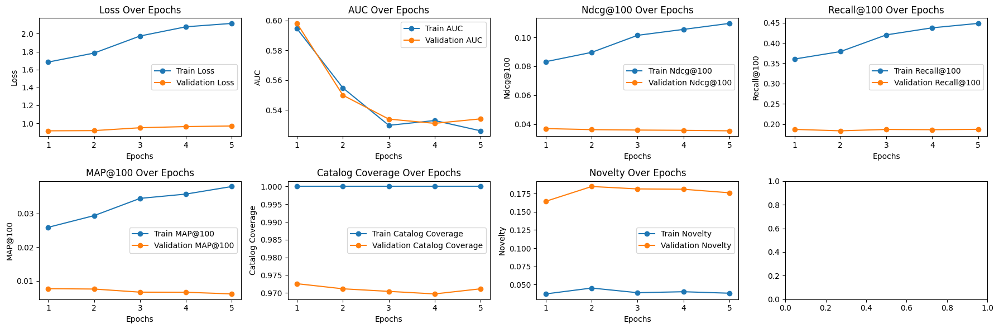

In [50]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


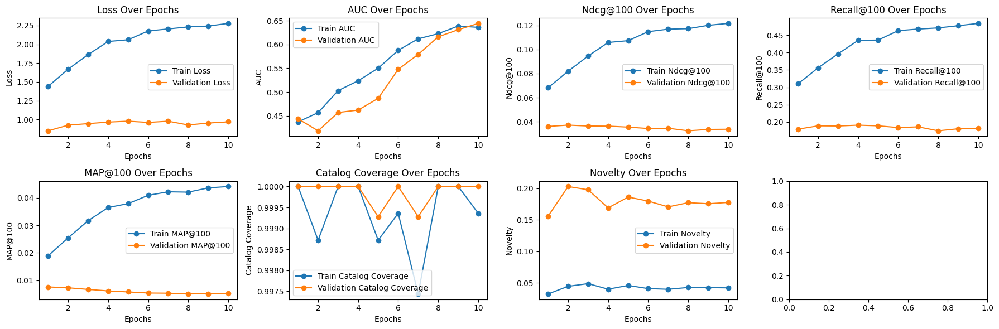

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


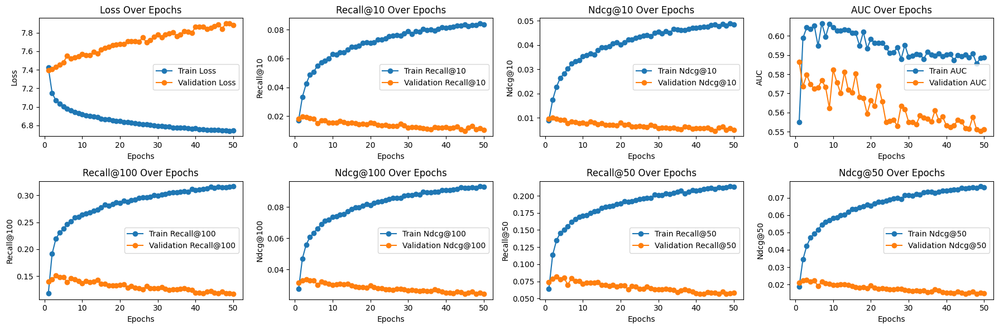

In [51]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v202

In [52]:
VERSION = 'v202'

_tower_dim = {
    'user':[128, 128],
    'item':[512, 128],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size * 2 # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [53]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [54]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [55]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [56]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 28s 452ms/step - loss: 7.3463 - auc: 0.5843 - recall_at_100: 0.1029 - mrr_at_100: 0.0075 - ndcg_at_100: 0.0236 - map_at_100: 0.0075 - precision_at_100: 0.0010 - recall_at_50: 0.0576 - mrr_at_50: 0.0069 - ndcg_at_50: 0.0163 - map_at_50: 0.0069 - precision_at_50: 0.0012 - recall_at_10: 0.0144 - mrr_at_10: 0.0051 - ndcg_at_10: 0.0072 - map_at_10: 0.0051 - precision_at_10: 0.0014 - regularization_loss: 0.0000e+00 - loss_batch: 7.2752 - val_loss: 7.3878 - val_auc: 0.5877 - val_recall_at_100: 0.1404 - val_mrr_at_100: 0.0097 - val_ndcg_at_100: 0.0317 - val_map_at_100: 0.0097 - val_precision_at_100: 0.0014 - val_recall_at_50: 0.0766 - val_mrr_at_50: 0.0088 - val_ndcg_at_50: 0.0214 - val_map_at_50: 0.0088 - val_precision_at_50: 0.0015 - val_recall_at_10: 0.0185 - val_mrr_at_10: 0.0065 - val_ndcg_at_10: 0.0092 - val_map_at_10: 0.0065 - val_precision_at_10: 0.0018 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.4350
Epoch 2/50
35/35 [=

69/69 [==============================] - 5s 28ms/step - loss: 1.7762 - auc: 0.5353 - recall_at_100: 0.3776 - mrr_at_100: 0.0286 - ndcg_at_100: 0.0890 - map_at_100: 0.0286 - precision_at_100: 0.0038 - recall_at_10: 0.0624 - mrr_at_10: 0.0194 - ndcg_at_10: 0.0293 - map_at_10: 0.0194 - precision_at_10: 0.0062 - regularization_loss: 0.0000e+00 - loss_batch: 1.7879
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.776230812072754, 'auc': 0.5352613925933838, 'recall_at_100': 0.3787214159965515, 'mrr_at_100': 0.029404154047369957, 'ndcg_at_100': 0.08979558199644089, 'map_at_100': 0.029404154047369957, 'precision_at_100': 0.00378721347078681, 'recall_at_10': 0.06361642479896545, 'mrr_at_10': 0.020284127444028854, 'ndcg_at_10': 0.03022303804755211, 'map_at_10': 0.020284127444028854, 'precision_at_10': 0.006361642852425575, 'regularization_loss': 0.0, 'loss_batch': 2.341982364654541, 'coverage': 1.0, 'novelty': 0.039350692705725256}
Candidate set rows: 1387


15/15 [==============================] - 3s 24ms/step - loss: 0.9212 - auc: 0.5423 - recall_at_100: 0.1806 - mrr_at_100: 0.0069 - ndcg_at_100: 0.0352 - map_at_100: 0.0069 - precision_at_100: 0.0018 - recall_at_10: 0.0098 - mrr_at_10: 0.0028 - ndcg_at_10: 0.0044 - map_at_10: 0.0028 - precision_at_10: 9.8258e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9785
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9212180972099304, 'auc': 0.5423406362533569, 'recall_at_100': 0.18396416306495667, 'mrr_at_100': 0.006868397351354361, 'ndcg_at_100': 0.03577318415045738, 'map_at_100': 0.006868397351354361, 'precision_at_100': 0.0018396415980532765, 'recall_at_10': 0.010699477978050709, 'mrr_at_10': 0.0027109324000775814, 'ndcg_at_10': 0.004524789750576019, 'map_at_10': 0.0027109324000775814, 'precision_at_10': 0.0010699478443711996, 'regularization_loss': 0.0, 'loss_batch': 1.5770082473754883, 'coverage': 0.9711607786589762, 'novelty': 0.17392106233862042}
35/35 [========

69/69 [==============================] - 5s 20ms/step - loss: 2.0087 - auc: 0.5480 - recall_at_100: 0.4286 - mrr_at_100: 0.0355 - ndcg_at_100: 0.1038 - map_at_100: 0.0355 - precision_at_100: 0.0043 - recall_at_10: 0.0764 - mrr_at_10: 0.0252 - ndcg_at_10: 0.0370 - map_at_10: 0.0252 - precision_at_10: 0.0076 - regularization_loss: 0.0000e+00 - loss_batch: 2.0202
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.008715867996216, 'auc': 0.5480082035064697, 'recall_at_100': 0.42824989557266235, 'mrr_at_100': 0.03539237007498741, 'ndcg_at_100': 0.10364773124456406, 'map_at_100': 0.03539237007498741, 'precision_at_100': 0.004282498732209206, 'recall_at_10': 0.07639383524656296, 'mrr_at_10': 0.025057896971702576, 'ndcg_at_10': 0.0368548221886158, 'map_at_10': 0.025057896971702576, 'precision_at_10': 0.007639383431524038, 'regularization_loss': 0.0, 'loss_batch': 2.5651402473449707, 'coverage': 1.0, 'novelty': 0.03474960386188598}
Candidate set rows: 1387


15/15 [==============================] - 3s 22ms/step - loss: 0.9428 - auc: 0.5588 - recall_at_100: 0.1805 - mrr_at_100: 0.0063 - ndcg_at_100: 0.0346 - map_at_100: 0.0063 - precision_at_100: 0.0018 - recall_at_10: 0.0092 - mrr_at_10: 0.0022 - ndcg_at_10: 0.0038 - map_at_10: 0.0022 - precision_at_10: 9.1583e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9875
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.942844033241272, 'auc': 0.5587625503540039, 'recall_at_100': 0.18630467355251312, 'mrr_at_100': 0.00695833982899785, 'ndcg_at_100': 0.03625191003084183, 'map_at_100': 0.00695833982899785, 'precision_at_100': 0.0018630466656759381, 'recall_at_10': 0.01136819552630186, 'mrr_at_10': 0.0027835892979055643, 'ndcg_at_10': 0.004723922815173864, 'map_at_10': 0.0027835892979055643, 'precision_at_10': 0.0011368197156116366, 'regularization_loss': 0.0, 'loss_batch': 1.4544769525527954, 'coverage': 0.9704397981254506, 'novelty': 0.15993894165535957}
35/35 [============

69/69 [==============================] - 5s 23ms/step - loss: 2.0909 - auc: 0.5166 - recall_at_100: 0.4448 - mrr_at_100: 0.0366 - ndcg_at_100: 0.1077 - map_at_100: 0.0366 - precision_at_100: 0.0044 - recall_at_10: 0.0802 - mrr_at_10: 0.0256 - ndcg_at_10: 0.0382 - map_at_10: 0.0256 - precision_at_10: 0.0080 - regularization_loss: 0.0000e+00 - loss_batch: 2.1046
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.0909202098846436, 'auc': 0.5166236758232117, 'recall_at_100': 0.4450015723705292, 'mrr_at_100': 0.037566181272268295, 'ndcg_at_100': 0.1086692214012146, 'map_at_100': 0.037566181272268295, 'precision_at_100': 0.0044500152580440044, 'recall_at_10': 0.08249052613973618, 'mrr_at_10': 0.02672707848250866, 'ndcg_at_10': 0.03953714296221733, 'map_at_10': 0.02672707848250866, 'precision_at_10': 0.008249052800238132, 'regularization_loss': 0.0, 'loss_batch': 2.752546548843384, 'coverage': 1.0, 'novelty': 0.04194280122759418}
Candidate set rows: 1387


15/15 [==============================] - 5s 35ms/step - loss: 0.9681 - auc: 0.5223 - recall_at_100: 0.1845 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0348 - map_at_100: 0.0058 - precision_at_100: 0.0018 - recall_at_10: 0.0080 - mrr_at_10: 0.0017 - ndcg_at_10: 0.0031 - map_at_10: 0.0017 - precision_at_10: 7.9599e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0075
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9680509567260742, 'auc': 0.5223491191864014, 'recall_at_100': 0.18884579837322235, 'mrr_at_100': 0.00623005535453558, 'ndcg_at_100': 0.03593190386891365, 'map_at_100': 0.00623005535453558, 'precision_at_100': 0.0018884579185396433, 'recall_at_10': 0.009295172058045864, 'mrr_at_10': 0.0019566884730011225, 'ndcg_at_10': 0.0036146424245089293, 'map_at_10': 0.0019566884730011225, 'precision_at_10': 0.0009295172058045864, 'regularization_loss': 0.0, 'loss_batch': 1.4197747707366943, 'coverage': 0.969718817591925, 'novelty': 0.18134615384615385}
35/35 [==========

69/69 [==============================] - 5s 21ms/step - loss: 2.1472 - auc: 0.5055 - recall_at_100: 0.4531 - mrr_at_100: 0.0388 - ndcg_at_100: 0.1114 - map_at_100: 0.0388 - precision_at_100: 0.0045 - recall_at_10: 0.0861 - mrr_at_10: 0.0277 - ndcg_at_10: 0.0411 - map_at_10: 0.0277 - precision_at_10: 0.0086 - regularization_loss: 0.0000e+00 - loss_batch: 2.1629
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.1471970081329346, 'auc': 0.5055198669433594, 'recall_at_100': 0.4559841454029083, 'mrr_at_100': 0.039444319903850555, 'ndcg_at_100': 0.11238814145326614, 'map_at_100': 0.039444319903850555, 'precision_at_100': 0.004559841472655535, 'recall_at_10': 0.0869918242096901, 'mrr_at_10': 0.02825901098549366, 'ndcg_at_10': 0.04175640270113945, 'map_at_10': 0.02825901098549366, 'precision_at_10': 0.00869918055832386, 'regularization_loss': 0.0, 'loss_batch': 2.9076285362243652, 'coverage': 1.0, 'novelty': 0.041812619163747615}
Candidate set rows: 1387


15/15 [==============================] - 5s 32ms/step - loss: 0.9757 - auc: 0.5214 - recall_at_100: 0.1839 - mrr_at_100: 0.0059 - ndcg_at_100: 0.0347 - map_at_100: 0.0059 - precision_at_100: 0.0018 - recall_at_10: 0.0085 - mrr_at_10: 0.0019 - ndcg_at_10: 0.0034 - map_at_10: 0.0019 - precision_at_10: 8.5443e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0139
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9756668210029602, 'auc': 0.521442174911499, 'recall_at_100': 0.1879095882177353, 'mrr_at_100': 0.006133139133453369, 'ndcg_at_100': 0.0356072299182415, 'map_at_100': 0.006133139133453369, 'precision_at_100': 0.0018790957983583212, 'recall_at_10': 0.008760198019444942, 'mrr_at_10': 0.0019623935222625732, 'ndcg_at_10': 0.0034951502457261086, 'map_at_10': 0.0019623935222625732, 'precision_at_10': 0.0008760198834352195, 'regularization_loss': 0.0, 'loss_batch': 1.4132075309753418, 'coverage': 0.969718817591925, 'novelty': 0.17649260714954146}
35/35 [===========

69/69 [==============================] - 5s 20ms/step - loss: 2.2128 - auc: 0.4962 - recall_at_100: 0.4634 - mrr_at_100: 0.0397 - ndcg_at_100: 0.1139 - map_at_100: 0.0397 - precision_at_100: 0.0046 - recall_at_10: 0.0870 - mrr_at_10: 0.0282 - ndcg_at_10: 0.0417 - map_at_10: 0.0282 - precision_at_10: 0.0087 - regularization_loss: 0.0000e+00 - loss_batch: 2.2287
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.2128312587738037, 'auc': 0.49618959426879883, 'recall_at_100': 0.46558502316474915, 'mrr_at_100': 0.04049241915345192, 'ndcg_at_100': 0.11494860798120499, 'map_at_100': 0.04049241915345192, 'precision_at_100': 0.00465585058555007, 'recall_at_10': 0.08932793885469437, 'mrr_at_10': 0.029088927432894707, 'ndcg_at_10': 0.04293718934059143, 'map_at_10': 0.029088927432894707, 'precision_at_10': 0.008932795375585556, 'regularization_loss': 0.0, 'loss_batch': 2.9805052280426025, 'coverage': 1.0, 'novelty': 0.044135542450622484}
Candidate set rows: 1387


15/15 [==============================] - 4s 24ms/step - loss: 0.9603 - auc: 0.4880 - recall_at_100: 0.1786 - mrr_at_100: 0.0051 - ndcg_at_100: 0.0331 - map_at_100: 0.0051 - precision_at_100: 0.0018 - recall_at_10: 0.0062 - mrr_at_10: 0.0012 - ndcg_at_10: 0.0023 - map_at_10: 0.0012 - precision_at_10: 6.1899e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9983
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9603346586227417, 'auc': 0.4879811406135559, 'recall_at_100': 0.18115554749965668, 'mrr_at_100': 0.005484542343765497, 'ndcg_at_100': 0.03394124656915665, 'map_at_100': 0.005484542343765497, 'precision_at_100': 0.001811555470339954, 'recall_at_10': 0.007556506432592869, 'mrr_at_10': 0.0014260928146541119, 'ndcg_at_10': 0.002796465065330267, 'map_at_10': 0.0014260928146541119, 'precision_at_10': 0.0007556506898254156, 'regularization_loss': 0.0, 'loss_batch': 1.3955368995666504, 'coverage': 0.969718817591925, 'novelty': 0.18013371537726838}
35/35 [==========

#### analysis

In [57]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v202


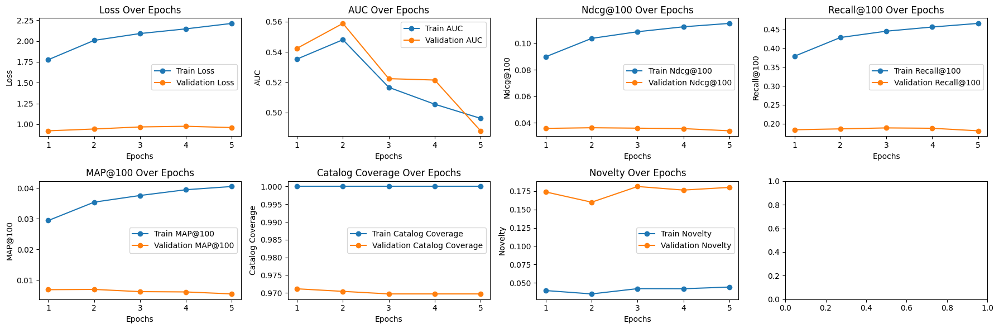

In [58]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


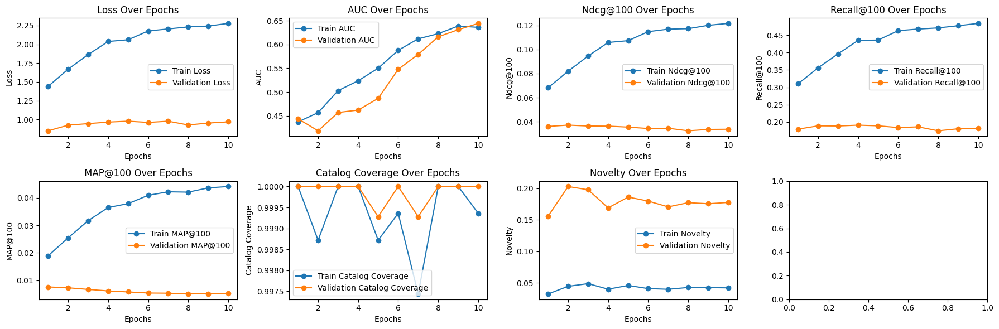

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


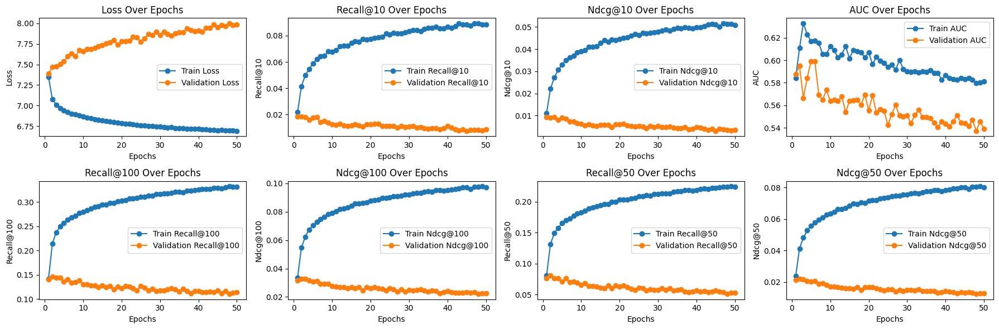

In [59]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}

### model_v204

In [61]:
VERSION = 'v204'

_tower_dim = {
    'user':[128, 256],
    'item':[256, 256],
}

_learning_rate = 0.01 # @param
_batch_size = 1024 * 2 # @param
_epochs = 50 # @param
_validation_batch_size = 2048 # @param
_sample_neg = _batch_size # @param
_validation_freq = 1 # @param
_loss = 'categorical_crossentropy' # @param
# _loss = 'bpr-max' # @param

_logq_sampling_correction = False # @param

embedding_dims = {
    'item': {
        'movie_id': 64,
        'genres': 8*2,
        'cast': 96
    },
    'user': {
        'user_id': 64,
        'gender': 8,
        'occupation': 8*2
    }
}

In [62]:
if VERSION in models:
    raise RuntimeError('Reusing model version: ', VERSION)

In [63]:
from merlin.models.tf.outputs.sampling.in_batch import InBatchSamplerV2

sampler = [InBatchSamplerV2(_sample_neg)]

models[VERSION] = model = build_towers(
    train,
    tower_dim=_tower_dim,
    neg_sampler=sampler,
    embedding_dims=embedding_dims,
    logq_sampling_correction=_logq_sampling_correction,
    item_categorical=item_embeddings_block  # needed to initiate the text embeddings
)

train_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=train, type_='Train', schema=train.schema)
valid_evaluation_clbks[VERSION] = EvaluationCallback(period=10, topk=100, data=valid, type_='Validation', schema=train.schema)
historys[VERSION] = []

TOP_K = [100, 50, 10]
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
    run_eagerly=False,
    metrics=topk_metrics_aggregator(TOP_K),
    loss=_loss,
)

#### model

In [64]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

In [65]:
# %pdb on
history.append(
    model.fit(train, validation_data=valid, batch_size=_batch_size, epochs=_epochs,
                 validation_batch_size=_validation_batch_size, validation_freq=_validation_freq,
                 callbacks=[train_evaluation_clbk,
                            valid_evaluation_clbk],
                  verbose=1)
)

Epoch 1/50
35/35 [==============================] - 33s 473ms/step - loss: 7.3437 - auc: 0.5870 - recall_at_100: 0.1026 - mrr_at_100: 0.0079 - ndcg_at_100: 0.0239 - map_at_100: 0.0079 - precision_at_100: 0.0010 - recall_at_50: 0.0575 - mrr_at_50: 0.0073 - ndcg_at_50: 0.0166 - map_at_50: 0.0073 - precision_at_50: 0.0011 - recall_at_10: 0.0146 - mrr_at_10: 0.0055 - ndcg_at_10: 0.0076 - map_at_10: 0.0055 - precision_at_10: 0.0015 - regularization_loss: 0.0000e+00 - loss_batch: 7.2728 - val_loss: 7.4350 - val_auc: 0.5911 - val_recall_at_100: 0.1398 - val_mrr_at_100: 0.0099 - val_ndcg_at_100: 0.0317 - val_map_at_100: 0.0099 - val_precision_at_100: 0.0014 - val_recall_at_50: 0.0745 - val_mrr_at_50: 0.0090 - val_ndcg_at_50: 0.0212 - val_map_at_50: 0.0090 - val_precision_at_50: 0.0015 - val_recall_at_10: 0.0187 - val_mrr_at_10: 0.0068 - val_ndcg_at_10: 0.0095 - val_map_at_10: 0.0068 - val_precision_at_10: 0.0019 - val_regularization_loss: 0.0000e+00 - val_loss_batch: 6.4334
Epoch 2/50
35/35 [=

69/69 [==============================] - 5s 25ms/step - loss: 1.7745 - auc: 0.5450 - recall_at_100: 0.3732 - mrr_at_100: 0.0273 - ndcg_at_100: 0.0868 - map_at_100: 0.0273 - precision_at_100: 0.0037 - recall_at_10: 0.0575 - mrr_at_10: 0.0182 - ndcg_at_10: 0.0272 - map_at_10: 0.0182 - precision_at_10: 0.0057 - regularization_loss: 0.0000e+00 - loss_batch: 1.7858
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.7744797468185425, 'auc': 0.5449553728103638, 'recall_at_100': 0.3763568103313446, 'mrr_at_100': 0.028496280312538147, 'ndcg_at_100': 0.08847805112600327, 'map_at_100': 0.028496280312538147, 'precision_at_100': 0.0037635688204318285, 'recall_at_10': 0.060596562922000885, 'mrr_at_10': 0.01942535489797592, 'ndcg_at_10': 0.028875160962343216, 'map_at_10': 0.01942535489797592, 'precision_at_10': 0.006059655919671059, 'regularization_loss': 0.0, 'loss_batch': 2.325056552886963, 'coverage': 1.0, 'novelty': 0.043919705649480695}
Candidate set rows: 1387


15/15 [==============================] - 3s 23ms/step - loss: 0.9206 - auc: 0.5627 - recall_at_100: 0.1767 - mrr_at_100: 0.0065 - ndcg_at_100: 0.0343 - map_at_100: 0.0065 - precision_at_100: 0.0018 - recall_at_10: 0.0109 - mrr_at_10: 0.0025 - ndcg_at_10: 0.0044 - map_at_10: 0.0025 - precision_at_10: 0.0011 - regularization_loss: 0.0000e+00 - loss_batch: 0.9818
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9206107258796692, 'auc': 0.5626853704452515, 'recall_at_100': 0.18396416306495667, 'mrr_at_100': 0.006869663950055838, 'ndcg_at_100': 0.035888127982616425, 'map_at_100': 0.006869663950055838, 'precision_at_100': 0.0018396413652226329, 'recall_at_10': 0.011702554300427437, 'mrr_at_10': 0.00267770909704268, 'ndcg_at_10': 0.0047080316580832005, 'map_at_10': 0.00267770909704268, 'precision_at_10': 0.0011702554766088724, 'regularization_loss': 0.0, 'loss_batch': 1.6217021942138672, 'coverage': 0.9704397981254506, 'novelty': 0.18625320955954966}
35/35 [==============

69/69 [==============================] - 5s 24ms/step - loss: 1.9968 - auc: 0.5483 - recall_at_100: 0.4166 - mrr_at_100: 0.0328 - ndcg_at_100: 0.0993 - map_at_100: 0.0328 - precision_at_100: 0.0042 - recall_at_10: 0.0702 - mrr_at_10: 0.0226 - ndcg_at_10: 0.0336 - map_at_10: 0.0226 - precision_at_10: 0.0070 - regularization_loss: 0.0000e+00 - loss_batch: 2.0126
Candidate set rows: 943
Train dataset topk evaluation {'loss': 1.9967809915542603, 'auc': 0.5482590794563293, 'recall_at_100': 0.4206860065460205, 'mrr_at_100': 0.03382817655801773, 'ndcg_at_100': 0.10096373409032822, 'map_at_100': 0.03382817655801773, 'precision_at_100': 0.004206860437989235, 'recall_at_10': 0.07291814684867859, 'mrr_at_10': 0.02359153889119625, 'ndcg_at_10': 0.034915678203105927, 'map_at_10': 0.02359153889119625, 'precision_at_10': 0.007291813381016254, 'regularization_loss': 0.0, 'loss_batch': 2.7657339572906494, 'coverage': 1.0, 'novelty': 0.040178951853429914}
Candidate set rows: 1387


15/15 [==============================] - 3s 22ms/step - loss: 0.9160 - auc: 0.5528 - recall_at_100: 0.1731 - mrr_at_100: 0.0060 - ndcg_at_100: 0.0331 - map_at_100: 0.0060 - precision_at_100: 0.0017 - recall_at_10: 0.0085 - mrr_at_10: 0.0022 - ndcg_at_10: 0.0036 - map_at_10: 0.0022 - precision_at_10: 8.4969e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9642
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9159512519836426, 'auc': 0.5527598857879639, 'recall_at_100': 0.17794570326805115, 'mrr_at_100': 0.006025056820362806, 'ndcg_at_100': 0.03391484543681145, 'map_at_100': 0.006025056820362806, 'precision_at_100': 0.001779457088559866, 'recall_at_10': 0.008960813283920288, 'mrr_at_10': 0.0020805338863283396, 'ndcg_at_10': 0.0036354106850922108, 'map_at_10': 0.0020805338863283396, 'precision_at_10': 0.0008960812701843679, 'regularization_loss': 0.0, 'loss_batch': 1.4693105220794678, 'coverage': 0.9682768565248738, 'novelty': 0.17033959537572255}
35/35 [========

69/69 [==============================] - 5s 21ms/step - loss: 2.0908 - auc: 0.4872 - recall_at_100: 0.4430 - mrr_at_100: 0.0369 - ndcg_at_100: 0.1078 - map_at_100: 0.0369 - precision_at_100: 0.0044 - recall_at_10: 0.0807 - mrr_at_10: 0.0260 - ndcg_at_10: 0.0386 - map_at_10: 0.0260 - precision_at_10: 0.0081 - regularization_loss: 0.0000e+00 - loss_batch: 2.1071
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.090806007385254, 'auc': 0.48715925216674805, 'recall_at_100': 0.44521522521972656, 'mrr_at_100': 0.038180891424417496, 'ndcg_at_100': 0.10932052880525589, 'map_at_100': 0.038180891424417496, 'precision_at_100': 0.004452153109014034, 'recall_at_10': 0.08333095908164978, 'mrr_at_10': 0.027285730466246605, 'ndcg_at_10': 0.0401618555188179, 'map_at_10': 0.027285730466246605, 'precision_at_10': 0.008333097212016582, 'regularization_loss': 0.0, 'loss_batch': 2.8807380199432373, 'coverage': 1.0, 'novelty': 0.03384416609841008}
Candidate set rows: 1387


15/15 [==============================] - 3s 24ms/step - loss: 0.9742 - auc: 0.4681 - recall_at_100: 0.1845 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0347 - map_at_100: 0.0058 - precision_at_100: 0.0018 - recall_at_10: 0.0080 - mrr_at_10: 0.0017 - ndcg_at_10: 0.0031 - map_at_10: 0.0017 - precision_at_10: 7.9844e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0184
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.9741794466972351, 'auc': 0.46805518865585327, 'recall_at_100': 0.18770897388458252, 'mrr_at_100': 0.005808986723423004, 'ndcg_at_100': 0.03522706776857376, 'map_at_100': 0.005808986723423004, 'precision_at_100': 0.0018770896131172776, 'recall_at_10': 0.007623378187417984, 'mrr_at_10': 0.001610918901860714, 'ndcg_at_10': 0.002962512895464897, 'map_at_10': 0.001610918901860714, 'precision_at_10': 0.0007623379351571202, 'regularization_loss': 0.0, 'loss_batch': 1.4808852672576904, 'coverage': 0.9675558759913482, 'novelty': 0.15926363789900355}
35/35 [=========

69/69 [==============================] - 5s 22ms/step - loss: 2.2012 - auc: 0.4974 - recall_at_100: 0.4620 - mrr_at_100: 0.0384 - ndcg_at_100: 0.1123 - map_at_100: 0.0384 - precision_at_100: 0.0046 - recall_at_10: 0.0849 - mrr_at_10: 0.0270 - ndcg_at_10: 0.0403 - map_at_10: 0.0270 - precision_at_10: 0.0085 - regularization_loss: 0.0000e+00 - loss_batch: 2.2160
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.2012267112731934, 'auc': 0.4974369406700134, 'recall_at_100': 0.4631349444389343, 'mrr_at_100': 0.03912203013896942, 'ndcg_at_100': 0.11317498236894608, 'map_at_100': 0.03912203013896942, 'precision_at_100': 0.004631349816918373, 'recall_at_10': 0.08589498698711395, 'mrr_at_10': 0.02782403863966465, 'ndcg_at_10': 0.041164688766002655, 'map_at_10': 0.02782403863966465, 'precision_at_10': 0.00858949963003397, 'regularization_loss': 0.0, 'loss_batch': 2.917081356048584, 'coverage': 1.0, 'novelty': 0.040778378378378374}
Candidate set rows: 1387


15/15 [==============================] - 3s 23ms/step - loss: 0.9628 - auc: 0.4637 - recall_at_100: 0.1803 - mrr_at_100: 0.0057 - ndcg_at_100: 0.0338 - map_at_100: 0.0057 - precision_at_100: 0.0018 - recall_at_10: 0.0075 - mrr_at_10: 0.0019 - ndcg_at_10: 0.0031 - map_at_10: 0.0019 - precision_at_10: 7.4542e-04 - regularization_loss: 0.0000e+00 - loss_batch: 0.9868
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.962837815284729, 'auc': 0.46369943022727966, 'recall_at_100': 0.1830279529094696, 'mrr_at_100': 0.006002352572977543, 'ndcg_at_100': 0.034555546939373016, 'map_at_100': 0.006002352572977543, 'precision_at_100': 0.0018302794778719544, 'recall_at_10': 0.00822522398084402, 'mrr_at_10': 0.0020191282965242863, 'ndcg_at_10': 0.0034213459584861994, 'map_at_10': 0.0020191282965242863, 'precision_at_10': 0.0008225225028581917, 'regularization_loss': 0.0, 'loss_batch': 1.237834095954895, 'coverage': 0.9675558759913482, 'novelty': 0.1756052141527002}
35/35 [==========

69/69 [==============================] - 5s 21ms/step - loss: 2.2239 - auc: 0.4879 - recall_at_100: 0.4634 - mrr_at_100: 0.0395 - ndcg_at_100: 0.1137 - map_at_100: 0.0395 - precision_at_100: 0.0046 - recall_at_10: 0.0873 - mrr_at_10: 0.0282 - ndcg_at_10: 0.0418 - map_at_10: 0.0282 - precision_at_10: 0.0087 - regularization_loss: 0.0000e+00 - loss_batch: 2.2387
Candidate set rows: 943
Train dataset topk evaluation {'loss': 2.2239174842834473, 'auc': 0.4879002571105957, 'recall_at_100': 0.4670094847679138, 'mrr_at_100': 0.04029703140258789, 'ndcg_at_100': 0.11500473320484161, 'map_at_100': 0.04029703140258789, 'precision_at_100': 0.004670094698667526, 'recall_at_10': 0.08915700763463974, 'mrr_at_10': 0.02886473573744297, 'ndcg_at_10': 0.04270673170685768, 'map_at_10': 0.02886473573744297, 'precision_at_10': 0.008915702812373638, 'regularization_loss': 0.0, 'loss_batch': 2.9415290355682373, 'coverage': 1.0, 'novelty': 0.03772754550910182}
Candidate set rows: 1387


15/15 [==============================] - 3s 23ms/step - loss: 0.9900 - auc: 0.4648 - recall_at_100: 0.1839 - mrr_at_100: 0.0058 - ndcg_at_100: 0.0345 - map_at_100: 0.0058 - precision_at_100: 0.0018 - recall_at_10: 0.0082 - mrr_at_10: 0.0019 - ndcg_at_10: 0.0033 - map_at_10: 0.0019 - precision_at_10: 8.1561e-04 - regularization_loss: 0.0000e+00 - loss_batch: 1.0227
Candidate set rows: 943
Validation dataset topk evaluation {'loss': 0.989962100982666, 'auc': 0.4648454785346985, 'recall_at_100': 0.18610405921936035, 'mrr_at_100': 0.005778154358267784, 'ndcg_at_100': 0.034953128546476364, 'map_at_100': 0.005778154358267784, 'precision_at_100': 0.0018610403640195727, 'recall_at_10': 0.007890865206718445, 'mrr_at_10': 0.0016569329891353846, 'ndcg_at_10': 0.0030581685714423656, 'map_at_10': 0.0016569329891353846, 'precision_at_10': 0.0007890865672379732, 'regularization_loss': 0.0, 'loss_batch': 1.3653908967971802, 'coverage': 0.9668348954578226, 'novelty': 0.16462988826815644}
35/35 [=======

#### analysis

In [66]:
history = historys[VERSION]
model = models[VERSION]
train_evaluation_clbk = train_evaluation_clbks[VERSION]
valid_evaluation_clbk = valid_evaluation_clbks[VERSION]

Plot for model v204


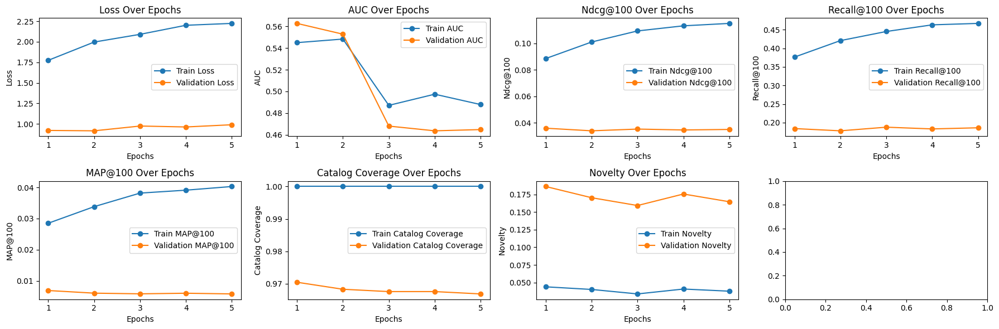

In [67]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


Plot for model v10


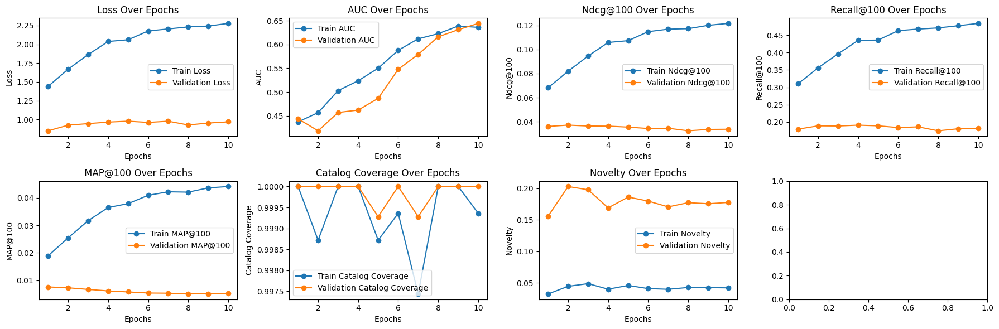

In [ ]:
_history = train_evaluation_clbk.get_records()
_history_val = valid_evaluation_clbk.get_records()
AUC_TERM = [k for k in _history if k.startswith('auc')][0]
_metrics  = {
    'Loss': 'loss',
    'AUC': AUC_TERM,
    'Ndcg@100': 'ndcg_at_100',
    'Recall@100': 'recall_at_100',
    'MAP@100':'map_at_100',
    'Catalog Coverage': 'coverage',
    'Novelty':'novelty'
}
print('Plot for model', VERSION)
plot_metrics(_history, _history_val, _metrics)


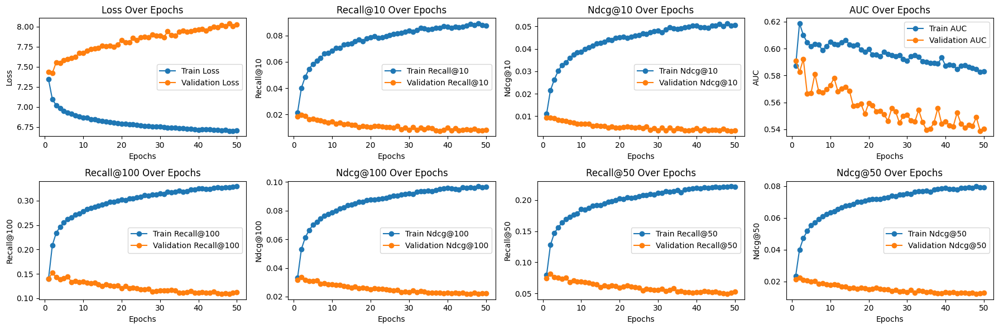

In [68]:
_history = merge_model_history(*history)
# AUC_TERM = [k for k in _history if k.startswith('auc')][0]
METRIC_AT = {'@'.join([k.split('_')[0].title(), k.split('_')[-1]]):k for k in _history if k.startswith('recall') or k.startswith('ndcg')}
val_history = { k[4:]:v for k,v in _history.items() if k.startswith('val')}
plot_metrics(_history, val_history, default_plot_metrics | {'AUC': 'auc', **METRIC_AT,})
# {'AUC': AUC_TERM, 'Recall@100': 'recall_at_100','NDCG@10': 'ndcg_at_10',}